**결측치 채우는 방법**
- 만약 년도/도시를 기준으로 하면 test set에서 데이터 전처리를 진행할 때 test set의 데이터를 참고하게 될 수 밖에 없음
    - 각 년도/도시/라벨/인종/성별 별로 하나의 데이터 씩 밖에 없기 때문
- 년도와 다르게 도시는 가까운 도시를 정의할 방법이 필요
    - 혹은 U.S. Total의 값을 적용하는 방법이 있음
- 도시간 거리를 정의한다면
    - 각 (인종,성별,도시,연도) tuple 별로 각 라벨에서의 데이터 값에 대해서 sppt에서의 거리와 label value에서의 거리 사이에 비교
    - sppt 에서의 metric
        - 각각의 차원에서의 거리를 규정한 뒤, 각 차원에서의 거리를 euclidean 
        - 기타 방법이 가능할 수 있으나 데이터의 양을 봤을 때 쉽지 않을 듯
        - 인종, 성별 : all, both 와의 거리는 다른 집단과의 거리보다 짧게
        - 도시 : 도시에 대한 geo_strata 정보를 기준으로 metric 정의
            - geo_strata의 feature : region, poverty, population, popDensity, segration
            - 추가적으로 feature를 더한다면 : 내륙/해안/접경, 위도경도
            - geo_strata의 값이 연도 별로 달라지는 지 확인
        - 연도 : 차이

- 각 label 별로 예측 학습을 진행하여 전처리에 이용할 수도 있음
    - race-sex에 따른 차이에 경향성이 유사한 것들끼리 묶어서 하는 것 가능하면 의미 있을지도
    - category 혹은 sub category 별로 변화 사이에서 correlation을 보는 등
    - 혹은 특정 label에 대해서 학습을 진행한 뒤, 다른 label에 그대로 적용


In [105]:
import numpy as np 
import pandas as pd 
import matplotlib as mpl
import matplotlib.pyplot as plt 
import missingno as msno
import seaborn as sns 
import os


from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

In [2]:
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats("png2x")
# 테마 설정: "default", "classic", "dark_background", "fivethirtyeight", "seaborn"
mpl.style.use("fivethirtyeight")
# 이미지가 레이아웃 안으로 들어오도록 함
mpl.rcParams.update({"figure.constrained_layout.use": True})

In [72]:
# D2Coding 폰트 경로 (예시 경로, 실제 폰트 경로로 변경 필요)
font_path = r'C:\Users\jaewonchoi\AppData\Local\Microsoft\Windows\Fonts\D2Coding-Ver1.3.2-20180524-all.ttc'

# 폰트 설치 확인
if font_path not in [f.fname for f in fm.fontManager.ttflist]:
    fm.fontManager.addfont(font_path)

# 폰트 설정
plt.rc('font', family='D2Coding')
plt.rcParams['axes.unicode_minus'] = False

In [73]:
import matplotlib.font_manager as fm
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
[fm.FontProperties(fname=font).get_name() for font in font_list if 'D2C' in font]
plt.rc('font', family='D2Coding')
mpl.rcParams['axes.unicode_minus'] = False

In [4]:
DATASET_DIR = 'C:\\Users\\jaewonchoi\\Desktop\\KDT\\project'
dir_name = 'project'
load_dir = 'project'
file_name = 'BigCitiesHealth.csv'
RSLT_DIR = 'C:\\Users\\jaewonchoi\\Desktop\\KDT\\project'
pvtb_dir = 'C:\\Users\\jaewonchoi\\Desktop\\KDT\\project'

## FUNCTIONS

- preprocess

In [5]:
def count_key_opt(data:pd.DataFrame,key,opt):
    rslt = dict()
    labels = data[key].unique()
    form = data[opt].value_counts().sort_values(ascending=False)
    form.iloc[:] = 0

    for feat in labels:
        cond = data[key]==feat
        val = form.copy()
        temp = data.loc[cond,opt].value_counts()
        val.loc[temp.index] = temp
        rslt[feat] = val

    return pd.DataFrame(rslt).T

In [6]:
import functools

def cond_check_dict(data=pd.DataFrame,val_dict=dict):
    cond_list=[
        data[col] == val
        for col, val in val_dict.items()
    ]
    return functools.reduce(lambda x,y: x & y, cond_list)

- plot

In [7]:
import re

def choose_split_point(word_len,space,ths):
    # 윗 줄에 space 만큼 공백이 있고, 한 줄의 길이가 ths로 제한 되어있을 때
    # 어떤 지점에서 단어를 끊어줄지 정하기
    # |-------ths-------|
    # |-space-|---------|-space-|------| : word
    #         |-------ths-------|
    print(word_len,space,ths)
    if word_len < ths + space :
        if abs(word_len/2 -ths) <= abs(word_len/2-space) :
            return word_len-ths
        else :
            return word_len - space if word_len < 2 * space else space
    else :
        return ths if word_len - (ths + space) < 0.3 * ths else space

def minimize_seq_idx_np(domain:np.array,func):
    vfunc = np.vectorize(func)
    temp = np.argsort(vfunc(domain))
    return temp[0]

def modify_strlen_ths(last,new,ths=16):
    front = len(last)
    space = ths - (1+front)
    if len(new) < space :
        rslt = [last + ' ' + new]
    else :
        if len(new) < ths:
            rslt = [last, new]
        else:
            cut = choose_split_point(len(new),space-1,ths-1)
            new_h, new_e = new[:cut]+'-', new[cut:]
            if cut < ths-1 :
                rslt = modify_strlen_ths(last+' '+new_h,new_e)
            else :
                rslt = [last] + modify_strlen_ths(new_h,new_e) 
    return rslt

def str_cutter(sentnc, ths = 16):
    words= sentnc.split(' ')
    rslt, pnt = [''], 0
    while pnt < len(words):
        last = '' if len(rslt)==0 else rslt[-1]
        next_ele = modify_strlen_ths(last,words[pnt],ths)
        rslt = rslt[:-1] + next_ele
        pnt += 1
    return '\n'.join(rslt)[1:]
#알고리즘 때문에 맨 앞에 빈칸 하나 들어가게 되는 이슈 있음

print(str_cutter('Racial Segregation Indices | Racial Segregation, White and Hispanic', 13))



Racial
Segregation
Indices |
Racial
Segregation,
White and
Hispanic


In [8]:
def choose_plot_grid(n:int,r_max=8,c_max=17,res_ths=2):
    #ver2
    r_min = np.ceil(n/c_max)
    sppt = np.arange(r_min,r_max+1) #need error process
    col_nums = np.ceil(n/sppt)
    res = col_nums * sppt -n
    min_idx = np.where((res==np.min(res)) | (res <= res_ths))[0]
    row_cand, col_cand = sppt[min_idx], col_nums[min_idx]
    if len(min_idx) > 1 :
        res = np.abs(row_cand-col_cand)
        i = np.where(res==np.min(res))[0][0]
    else : i = 0
    return int(row_cand[i]), int(col_cand[i])


def pair_plot_feat_hue(fig,axes,data:dict,pair_plot,axis_share=False,hue_label_dict=None, **kwargs):
    #ver2
    if (fig is None) or (axes is None) :
        num_r, num_c = choose_plot_grid(len(data))
        fig, axes = plt.subplots(num_r,num_c,figsize=(21,17),sharex=axis_share,sharey=axis_share)
    for n,key in enumerate(data.keys()):
        ax = axes.flatten()[n]
        plt.setp(ax.get_xticklabels(),ha = 'left',rotation = 90)
        if n >= len(data) : continue
        pair_plot(x=data[key][0], y = data[key][1],ax =ax, **kwargs)
        feat_name = str(key) 
        if hue_label_dict: color = 'b' if hue_label_dict[feat_name] else 'k'
        else : color = 'k'
        ax.set_xlabel(str_cutter(feat_name,20),loc='left',fontsize = 8.3,color=color)
    return fig,axes

In [9]:
choose_plot_grid(5)

(2, 3)

# Define metic on a support $X$

- 숫자들 간에는 차의 절대값으로 하면 됨
- categorical의 경우
    - geo : ordinal이라 볼 수 있지만 binary
    - race, sex : nominal이지만 중간값(all or both) 존재

In [10]:
raw_file_path = os.path.join(DATASET_DIR,file_name)
df_raw = pd.read_csv(raw_file_path)

df_raw

C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3106502152.py:2: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  df_raw = pd.read_csv(raw_file_path)


,metric_item_label,metric_cat_label,metric_subcat_label,metric_item_label_subtitle,metric_cat_item_yaxis_label,metric_source_desc_label_fn,metric_source_desc_label_url_fn,geo_label_city,geo_label_state,geo_label_citystate,...,value_90_ci_low,value_90_ci_high,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,strata_race_label,strata_sex_label,strata_race_sex_label
0,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Cleveland,OH,"Cleveland, OH",...,NaN,NaN,Midwest,Poorest cities (18%+ poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Black,Female,Black Female
1,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Oakland,CA,"Oakland, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),Hispanic,Male,Hispanic Male
2,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,San Francisco,CA,"San Francisco, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Less Segregated (<50%),All,Female,NaN
3,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Long Beach,CA,"Long Beach, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Hispanic,Female,Hispanic Female
4,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Cleveland,OH,"Cleveland, OH",...,NaN,NaN,Midwest,Poorest cities (18%+ poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Black,Male,Black Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189974,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Chicago,IL,"Chicago, IL",...,NaN,NaN,Midwest,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),All,Both,NaN
189975,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Charlotte,NC,"Charlotte, NC",...,NaN,NaN,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),All,Both,NaN
189976,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Boston,MA,"Boston, MA",...,NaN,NaN,Northeast,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),All,Both,NaN
189977,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bure

In [11]:
cond_US = cond_check_dict(df_raw,{"geo_label_city":"U.S. Total"})
df_city = df_raw[~cond_US]

df_city

,metric_item_label,metric_cat_label,metric_subcat_label,metric_item_label_subtitle,metric_cat_item_yaxis_label,metric_source_desc_label_fn,metric_source_desc_label_url_fn,geo_label_city,geo_label_state,geo_label_citystate,...,value_90_ci_low,value_90_ci_high,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,strata_race_label,strata_sex_label,strata_race_sex_label
0,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Cleveland,OH,"Cleveland, OH",...,NaN,NaN,Midwest,Poorest cities (18%+ poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Black,Female,Black Female
1,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Oakland,CA,"Oakland, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),Hispanic,Male,Hispanic Male
2,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,San Francisco,CA,"San Francisco, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Less Segregated (<50%),All,Female,NaN
3,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Long Beach,CA,"Long Beach, CA",...,NaN,NaN,West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Hispanic,Female,Hispanic Female
4,All Cancer Deaths,Chronic Health Conditions,Cancer,"Deaths from all types of cancer (per 100,000 p...","Per 100,000","National Vital Statistics System (NVSS), Cente...",https://www.cdc.gov/nchs/nvss/index.htm,Cleveland,OH,"Cleveland, OH",...,NaN,NaN,Midwest,Poorest cities (18%+ poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),Black,Male,Black Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189974,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Chicago,IL,"Chicago, IL",...,NaN,NaN,Midwest,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),All,Both,NaN
189975,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Charlotte,NC,"Charlotte, NC",...,NaN,NaN,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),All,Both,NaN
189976,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bureau",https://www.census.gov/programs-surveys/acs,Boston,MA,"Boston, MA",...,NaN,NaN,Northeast,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),All,Both,NaN
189977,"Racial Segregation, White and Hispanic",Social and Economic Factors,Racial Segregation Indices,Residential segregation of white non-Hispanic ...,Lower is better,"American Community Survey, U.S. Census Bure

### metric on geo_strat
- abstract geo_strat

In [12]:
geo_strat_cols = list(filter(lambda x : 'geo_strat' in x,df_city.columns))
geo_info_cols = list(filter(lambda x : 'geo_label' in x,df_city.columns))[:3]

df_temp = df_city[geo_info_cols+geo_strat_cols]

df_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188667 entries, 0 to 189978
Data columns (total 8 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   geo_label_city          188667 non-null  object
 1   geo_label_state         188667 non-null  object
 2   geo_label_citystate     188667 non-null  object
 3   geo_strata_region       188667 non-null  object
 4   geo_strata_poverty      188667 non-null  object
 5   geo_strata_Population   188667 non-null  object
 6   geo_strata_PopDensity   188667 non-null  object
 7   geo_strata_Segregation  188667 non-null  object
dtypes: object(8)
memory usage: 13.0+ MB


In [13]:
# EDA 결과, las vegas와 long beach에 대해서 오기입된 record가 하나씩 있음
# 오기입된 outlier을 제외하고 반복되어 등장한 것만 추림
dup_cond = df_temp.duplicated(keep=False)
print(len(df_temp[dup_cond].value_counts()))
#df_temp[dup_cond].value_counts()

35


In [14]:
df_geo_strat = df_temp[dup_cond].value_counts().reset_index()

In [15]:
df_geo_info = df_geo_strat.set_index('geo_label_city')

df_geo_info

,geo_label_state,geo_label_citystate,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,0
geo_label_city,,,,,,,,
New York City,NY,"New York City, NY",Northeast,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6535
Houston,TX,"Houston, TX",South,Poorest cities (18%+ poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6431
Los Angeles,CA,"Los Angeles, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6372
Philadelphia,PA,"Philadelphia, PA",Northeast,Poorest cities (18%+ poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6310
San Diego,CA,"San Diego, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),6251
Chicago,IL,"Chicago, IL",Midwest,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6210
San Francisco,CA,"San Francisco, CA",West,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Less Segregated (<50%),6121
Las Vegas,NV,"Las Vegas, NV",West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),5849
Boston,MA,"Boston, MA",Northeast,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),5718


In [16]:
save_path = os.path.join(RSLT_DIR,'geo_strat_info.csv')
df_geo_info.to_csv(save_path,index=True)

- except for geo_strata_region, all of them is ordinal and binary
- in geo_strata_region, minimal length between each regions could be base of metric
    - a condition of metric :

        (distance between a, c) <= (distance between a, b) + (distance between b, c)

In [17]:
df_region = df_geo_strat.groupby('geo_strata_region')['geo_label_state'].apply(set)

df_region

geo_strata_region
Midwest      {OH, MN, IL, WI, MI, MO, IN}
Northeast                    {MA, PA, NY}
South        {KY, OK, DC, TN, TX, NC, MD}
West             {CO, NV, OR, CA, AZ, WA}
Name: geo_label_state, dtype: object

In [18]:
df_geo_strat[geo_strat_cols].value_counts()

geo_strata_region  geo_strata_poverty            geo_strata_Population   geo_strata_PopDensity                  geo_strata_Segregation  
West               Less poor cities (<18% poor)  Smaller (<1.3 million)  Lower pop. density (<10k per sq mi)    Less Segregated (<50%)      6
South              Less poor cities (<18% poor)  Smaller (<1.3 million)  Lower pop. density (<10k per sq mi)    Less Segregated (<50%)      5
Midwest            Less poor cities (<18% poor)  Smaller (<1.3 million)  Lower pop. density (<10k per sq mi)    Less Segregated (<50%)      4
                   Poorest cities (18%+ poor)    Smaller (<1.3 million)  Lower pop. density (<10k per sq mi)    Highly Segregated (50%+)    3
South              Poorest cities (18%+ poor)    Smaller (<1.3 million)  Lower pop. density (<10k per sq mi)    Highly Segregated (50%+)    2
West               Less poor cities (<18% poor)  Largest (>1.3 million)  Lower pop. density (<10k per sq mi)    Highly Segregated (50%+)    2
           

In [19]:
for col in geo_strat_cols:
    display(df_geo_strat[col].value_counts())

South        12
West         12
Midwest       8
Northeast     3
Name: geo_strata_region, dtype: int64

Less poor cities (<18% poor)    26
Poorest cities (18%+ poor)       9
Name: geo_strata_poverty, dtype: int64

Smaller (<1.3 million)    26
Largest (>1.3 million)     9
Name: geo_strata_Population, dtype: int64

Lower pop. density (<10k per sq mi)      29
Highest pop. density (>10k per sq mi)     6
Name: geo_strata_PopDensity, dtype: int64

Less Segregated (<50%)      20
Highly Segregated (50%+)    15
Name: geo_strata_Segregation, dtype: int64

basically,
- if a,b are adjacent : d(a,b) = 1
- if minimal path == 2 : d(a,b) = 1.732 (cf. sqrt 3)

(cf : 정삼각형 2 개 붙어있는 모양)

In [20]:
import itertools

region_adjacent = [
    { "Midwest", "Northeast" },
    { "Midwest", "South" },
    { "Midwest", "West" },
    { "West", "South" },
    { "South", "Northeast" }
]

    
def metric_on_adj(points,adjacents,far_distance = 1.732):
    metric_dict=dict()
    for a,b in itertools.product(points,repeat=2):
        if a == b : metric_dict[(a,b)] = 0
        elif {a,b} in adjacents : metric_dict[(a,b)] = 1
        else : metric_dict[(a,b)] = far_distance 
    return lambda x,y : metric_dict[(x,y)]

metric_region = metric_on_adj(df_region.index,region_adjacent)

print(type(metric_region))
print(metric_region('West','Northeast'))

<class 'function'>
1.732


the algorithm could be applied on other nominal categories, e.g. race, sex, and other binay ordinal categories.

In [21]:
metric_binary = lambda x,y : 0 if x==y else 1
# metric_binary.__setattr__('name','metric_binary') -> 함수에 이름 정해주는 법 어떻게?

entire_race = ['All','White','Black','Hispanic','Asian/PI','Natives']
race_adjacnet = [
    {'All', a}
    for a in entire_race
    if a != 'All'
]
metric_race = metric_on_adj(entire_race, race_adjacnet)

entire_sex = ['Both','Female','Male']
sex_adjacnet = [
    {'Both', a}
    for a in entire_race
    if a != 'Both'
]
metric_sex = metric_on_adj(entire_sex, sex_adjacnet)

metric_race('White','Black')

1.732

In [22]:
dict_metric = dict()

dict_metric['strata_race_label'] = metric_race
dict_metric['strata_sex_label'] = metric_sex
dict_metric['geo_strata_region'] = metric_region

for col in geo_strat_cols:
    if col == 'geo_strata_region' : continue
    dict_metric[col] = metric_binary

dict_metric

{'strata_race_label': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'strata_sex_label': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'geo_strata_region': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'geo_strata_poverty': <function __main__.<lambda>(x, y)>,
 'geo_strata_Population': <function __main__.<lambda>(x, y)>,
 'geo_strata_PopDensity': <function __main__.<lambda>(x, y)>,
 'geo_strata_Segregation': <function __main__.<lambda>(x, y)>}

In [23]:
dict_metric['geo_strata_Segregation'].__name__

'<lambda>'

In [24]:
dict_metric['geo_strata_region'] ('Midwest','Midwest')

0

In [25]:
dict_metric['strata_race_label'] ('All','White')

1

### distance between cities
- 각 axis 에서의 거리를 L7 norm 한 것으로 테스트
- 7은 임의로 정한 것으로 필요시 다른 값으로 테스트 해봐도 좋을 듯

In [26]:
df_geo_info

,geo_label_state,geo_label_citystate,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,0
geo_label_city,,,,,,,,
New York City,NY,"New York City, NY",Northeast,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6535
Houston,TX,"Houston, TX",South,Poorest cities (18%+ poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6431
Los Angeles,CA,"Los Angeles, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6372
Philadelphia,PA,"Philadelphia, PA",Northeast,Poorest cities (18%+ poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6310
San Diego,CA,"San Diego, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),6251
Chicago,IL,"Chicago, IL",Midwest,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6210
San Francisco,CA,"San Francisco, CA",West,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Less Segregated (<50%),6121
Las Vegas,NV,"Las Vegas, NV",West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),5849
Boston,MA,"Boston, MA",Northeast,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),5718


In [27]:
print(metric_region('Northeast', 'Northeast'))

0


In [28]:
print(dict_metric['geo_strata_region']('Northeast', 'Northeast'))

0


In [29]:
city_list = list(df_geo_info.index)

metric_val= dict()
for a, b in itertools.product(city_list,repeat=2):
    diff = [
        dict_metric[col](df_geo_info.loc[a,col],
                         df_geo_info.loc[b,col])
        for col in geo_strat_cols
        ]
    metric_val[(a,b)] = np.linalg.norm(np.array(diff),ord=7)
    
metric_val 

{('New York City', 'New York City'): 0.0,
 ('New York City', 'Houston'): 1.169930812758687,
 ('New York City', 'Los Angeles'): 1.7372440623952268,
 ('New York City', 'Philadelphia'): 1.0,
 ('New York City', 'San Diego'): 1.7423948319061235,
 ('New York City', 'Chicago'): 1.0,
 ('New York City', 'San Francisco'): 1.7423948319061235,
 ('New York City', 'Las Vegas'): 1.7474558315662452,
 ('New York City', 'Boston'): 1.0,
 ('New York City', 'Oakland'): 1.7474558315662452,
 ('New York City', 'Dallas'): 1.1040895136738123,
 ('New York City', 'Fort Worth'): 1.2190136542044754,
 ('New York City', 'Seattle'): 1.7474558315662452,
 ('New York City', 'Phoenix'): 1.7372440623952268,
 ('New York City', 'Charlotte'): 1.2190136542044754,
 ('New York City', 'San Antonio'): 1.169930812758687,
 ('New York City', 'Washington'): 1.1040895136738123,
 ('New York City', 'Portland'): 1.7474558315662452,
 ('New York City', 'Long Beach'): 1.7423948319061235,
 ('New York City', 'San Jose'): 1.7474558315662452,
 (

In [30]:
metric_val[('Portland','Seattle')]

0.0

In [31]:
metric_val[('New York City', 'Denver')]

1.7474558315662452

In [32]:
temp = pd.Series(metric_val).reset_index()

pd.pivot_table(temp, index = 'level_0', columns = 'level_1')

0                                                    \
level_1          Austin Baltimore    Boston Charlotte   Chicago Cleveland   
level_0                                                                     
Austin         0.000000  1.104090  1.169931  0.000000  1.219014  1.169931   
Baltimore      1.104090  0.000000  1.169931  1.104090  1.219014  1.000000   
Boston         1.169931  1.169931  0.000000  1.169931  1.104090  1.169931   
Charlotte      0.000000  1.104090  1.169931  0.000000  1.219014  1.169931   
Chicago        1.219014  1.219014  1.104090  1.219014  0.000000  1.169931   
Cleveland      1.169931  1.000000  1.169931  1.169931  1.169931  0.000000   
Columbus       1.000000  1.169931  1.169931  1.000000  1.169931  1.104090   
Dallas         1.104090  1.104090  1.169931  1.104090  1.104090  1.169931   
Denver         1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
Detroit        1.169931  1.000000  1.169931  1.169931  1.169931  0.000000   
El Paso        1.000000  1.000000  1.219014  1.000000  1.258499  1.104090   
Fort Worth     0.000000  1.104090  1.169931  0.000000  1.219014  1.169931   
Houston        1.169931  1.000000  1.219014  1.169931  1.169931  1.104090   
Indianapolis   1.000000  1.169931  1.169931  1.000000  1.169931  1.104090   
Kansas City    1.000000  1.169931  1.169931  1.000000  1.169931  1.104090   
Las Vegas      1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
Long Beach     1.104090  1.104090  1.737244  1.104090  1.169931  1.104090   
Los Angeles    1.169931  1.169931  1.742395  1.169931  1.104090  1.169931   
Louisville     0.000000  1.104090  1.169931  0.000000  1.219014  1.169931   
Memphis        1.104090  0.000000  1.169931  1.104090  1.219014  1.000000   
Milwaukee      1.169931  1.000000  1.169931  1.169931  1.169931  0.000000   
Minneapolis    1.000000  1.169931  1.169931  1.000000  1.169931  1.104090   
New York City  1.219014  1.219014  1.000000  1.219014  1.000000  1.219014   
Oakland        1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
Oklahoma City  0.000000  1.104090  1.169931  0.000000  1.219014  1.169931   
Philadelphia   1.258499  1.169931  1.104090  1.258499  1.104090  1.169931   
Phoenix        1.169931  1.169931  1.742395  1.169931  1.104090  1.169931   
Portland       1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
San Antonio    1.000000  1.169931  1.219014  1.000000  1.169931  1.219014   
San Diego      1.104090  1.219014  1.747456  1.104090  1.169931  1.219014   
San Francisco  1.104090  1.219014  1.737244  1.104090  1.169931  1.219014   
San Jose       1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
Seattle        1.000000  1.169931  1.742395  1.000000  1.219014  1.169931   
Tucson         1.104090  1.104090  1.747456  1.104090  1.258499  1.104090   
Washington     1.104090  1.104090  1.000000  1.104090  1.104090  1.169931   

                                                       ...               \
level_1        Columbus    Dallas    Denver   Detroit  ... Philadelphia   
level_0                                                ...                
Austin         1.000000  1.104090  1.000000  1.169931  ...     1.258499   
Baltimore      1.169931  1.104090  1.169931  1.000000  ...     1.169931   
Boston         1.169931  1.169931  1.742395  1.169931  ...     1.104090   
Charlotte      1.000000  1.104090  1.000000  1.169931  ...     1.258499   
Chicago        1.169931  1.104090  1.219014  1.169931  ...     1.104090   
Cleveland      1.104090  1.169931  1.169931  0.000000  ...     1.169931   
Columbus       0.000000  1.169931  1.000000  1.104090  ...     1.258499   
Dallas         1.169931  0.000000  1.169931  1.169931  ...     1.169931   
Denver         1.000000  1.169931  0.000000  1.169931  ...     1.752430   
Detroit        1.104090  1.169931  1.169931  0.000000  ...     1.169931   
El Paso        1.104090  1.169931  1.104090  1.104090  ...     1.219014   
Fort Worth     1.000000  1.104090  1.000000  

In [33]:
temp[0].value_counts().sort_index()

0.000000    107
1.000000    264
1.104090    296
1.169931    338
1.219014    122
1.258499     26
1.737244      8
1.742395     26
1.747456     24
1.752430     14
Name: 0, dtype: int64

In [34]:
#dict_metric['geo_label_city'] = lambda x,y : np.linalg.norm(np.array([metric_val[(x,y)],0.3 * metric_binary(x,y)]),ord=3)
dict_metric['geo_label_city'] = lambda x,y : metric_val[(x,y)]

In [35]:
dict_metric

{'strata_race_label': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'strata_sex_label': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'geo_strata_region': <function __main__.metric_on_adj.<locals>.<lambda>(x, y)>,
 'geo_strata_poverty': <function __main__.<lambda>(x, y)>,
 'geo_strata_Population': <function __main__.<lambda>(x, y)>,
 'geo_strata_PopDensity': <function __main__.<lambda>(x, y)>,
 'geo_strata_Segregation': <function __main__.<lambda>(x, y)>,
 'geo_label_city': <function __main__.<lambda>(x, y)>}

In [36]:
dict_metric['geo_label_city'] ('Portland','Seattle')

0.0

In [37]:
metric_val[('New York City', 'Denver')]

1.7474558315662452

In [38]:
metric_val[('Portland','Seattle')]

0.0

In [39]:
df_geo_info.loc[['Portland','Seattle']]

,geo_label_state,geo_label_citystate,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,0
geo_label_city,,,,,,,,
Portland,OR,"Portland, OR",West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),5219
Seattle,WA,"Seattle, WA",West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),5507


- dict_metric을 pkl 파일로 저장해서 사용할 수 있을 것 같음

# KNN regression

### LOAD DATA

In [40]:
pvtb_name = 'pvtb_city_entire_ver0.csv'


pvtb_path = os.path.join(pvtb_dir,pvtb_name)
pvtb_entire = pd.read_csv(pvtb_path)

pvtb_entire

,geo_label_city,date_label,strata_race_label,strata_sex_label,Active Transportation | Riding Bike to Work,Active Transportation | Walking to Work,Air Pollution | Hazardous Air Quality,Air Pollution | Poor Air Quality,Birth Control | Teen Birth Control,Births | Low Birthweight,...,Substance Use | Adult Smoking,Substance Use | Drug Overdose Deaths,Substance Use | Opioid Overdose Deaths,Substance Use | Teen Alcohol,Substance Use | Teen Marijuana,Substance Use | Teen Smoking,Transportation | Drives Alone to Work,Transportation | Lack of Car,Transportation | Longer Driving Commute Time,Transportation | Public Transportation Use
0,Austin,2010,All,Both,1.458997,2.506039,2.191781,25.479452,NaN,7.836414,...,14.1,14.814379,5.316296,NaN,NaN,NaN,71.701852,7.104797,NaN,4.673879
1,Austin,2010,All,Female,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,12.110401,4.224056,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Austin,2010,All,Male,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,17.451652,6.417004,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Austin,2010,Asian/PI,Both,NaN,NaN,NaN,NaN,NaN,8.785406,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Austin,2010,Asian/PI,Female,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7275,Washington,2022,Hispanic,Male,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,25.584642,21.067009,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7276,Washington,2022,Natives,Both,NaN,8.766234,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,19.237013,NaN,NaN,38.879870
7277,Washington,2022,White,Both,NaN,14.201808,NaN,NaN,NaN,5.574537,...,NaN,13.498547,8.887272,NaN,NaN,NaN,24.173919,NaN,NaN,21.684225
7278,Washington,2022,White,Female,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,6.485127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**user defined metric on dataset**

- city 사이의 metric은 city 이름과 독립적인 변수로 정의한 내용을 저장해 놓은 것 뿐이 때문에 아래에서 metric을 구할 때 city간 metric을 이용해도 무관함
- city 사이의 거리와 year 사이 거리의 euclidean으로 시도

In [41]:
def metric_cityyear(X,Y):
    city_x,city_y = city_list[int(X[0])],city_list[int(Y[0])]
    diff = [dict_metric['geo_label_city'](city_x,city_y),
            abs(X[1]-Y[1]),
            dict_metric['strata_race_label'](X[2],Y[2]),
            dict_metric['strata_sex_label'](X[3],Y[3]),
            ]
    return np.linalg.norm(np.array(diff),ord=5)

In [42]:
dict_metric['strata_race_label']('White','Black')

1.732

In [43]:
weight_norm = np.array([0.4,0.1,0.5,0.5])

def metric_cityyear_weighted(X,Y):
    city_x,city_y = city_list[int(X[0])],city_list[int(Y[0])]
    race_x, race_y = entire_race[int(X[2])], entire_race[int(Y[2])]
    sex_x, sex_y = entire_sex[int(X[3])], entire_sex[int(Y[3])]
    diff = [dict_metric['geo_label_city'](city_x,city_y),
            abs(X[1]-Y[1]),
            dict_metric['strata_race_label'](race_x,race_y),
            dict_metric['strata_sex_label'](sex_x,sex_y),
            ]
    return np.linalg.norm(np.array(diff)*weight_norm,ord=5)

vec_metric_cy_weighted= np.vectorize(metric_cityyear_weighted)
#함수 내에서 쓰인 외부의 변수들도 decompose하려고 하기 때문에, city_list 등을 모두 exclude 해야 작동함

In [44]:
a = np.arange(5)
print(type(a[0]))
city_list[a[0]]

<class 'numpy.int32'>


'New York City'

In [45]:
import numpy as np

def g(x,p):
  return p[0]+x*p[1]+x*x*p[2]

print(g(5,[0,0,1]))

vg = np.vectorize(g, excluded=['p'])
print(vg(x=[0,1,2,3,4,5],p=[0,1,2])) 

25
[ 0  3 10 21 36 55]


In [91]:
weight_norm = np.array([0.4,0.1,0.5,0.5])
#weight를 1보다 작게 주는 것이 정수로 주는 것보다
#vectorize 안 한 상황에서는 한번씩 해봤을 때는 빠르게 나왔음

def metric_cityyear_weighted(city_list, entire_race, entire_sex, dict_metric, weight_norm, X, Y):
    city_x, city_y = city_list[int(X[0])], city_list[int(Y[0])]
    race_x, race_y = entire_race[int(X[2])], entire_race[int(Y[2])]
    sex_x, sex_y = entire_sex[int(X[3])], entire_sex[int(Y[3])]
    diff = [
        dict_metric['geo_label_city'](city_x, city_y),
        abs(X[1] - Y[1]),
        dict_metric['strata_race_label'](race_x, race_y),
        dict_metric['strata_sex_label'](sex_x, sex_y),
    ]
    return np.linalg.norm(np.array(diff) * weight_norm, ord=5)

# 벡터화된 함수 정의
vec_metric_cy_weighted = np.vectorize(
    lambda x, y: metric_cityyear_weighted(
        city_list, entire_race, entire_sex, dict_metric, weight_norm, x, y
    ), 
    excluded={0, 1}
)

In [47]:
vec_metric_city = np.vectorize(dict_metric['geo_label_city'])

In [48]:
def idx2city(city_list,idx):
    return city_list[idx]

idx2city(city_list,0)

'New York City'

In [49]:
vec_idx2city=np.vectorize(idx2city,excluded={0})

In [50]:
vec_idx2city(city_list,0)

array('New York City', dtype='<U13')

In [51]:
vec_metric_city('New York City','Portland')

array(1.74745583)

In [52]:
vec_metric_cy_weighted(np.array([20,2010,0,0]),np.array([20,2010,0,1]))

0.866

In [53]:
type(vec_metric_cy_weighted)

numpy.vectorize

In [54]:
from sklearn.neighbors import KNeighborsRegressor

test_col = [
    'Deaths | Premature Death',                                  
    'Deaths | Injury Deaths',                                    
    'Cancer | All Cancer Deaths',                                
    'Cardiovascular Disease | Cardiovascular Disease Deaths',    
    'Deaths | Deaths from All Causes',                           
    'Substance Use | Drug Overdose Deaths',                      
    'Cardiovascular Disease | Heart Disease Deaths',             
    'Diabetes and Obesity | Diabetes Deaths',                    
    'Cancer | Lung Cancer Deaths',                               
    'Life Expectancy at Birth | Life Expectancy',                
    'Mental Health | Suicide',                                   
    'Deaths | Motor Vehicle Deaths',                             
    'Deaths | Gun Deaths (Firearms)',                            
    'Respiratory Infection | Pneumonia or Influenza Deaths',     
    'Substance Use | Opioid Overdose Deaths',                    
    'Cancer | Colorectal Cancer Deaths',                         
    'Crime Incidents | Homicides',                               
]

In [55]:
test_df = pvtb_entire[['geo_label_city','date_label','strata_race_label','strata_sex_label',test_col[0]]]
test_df

,geo_label_city,date_label,strata_race_label,strata_sex_label,Deaths | Premature Death
0,Austin,2010,All,Both,5094.792265
1,Austin,2010,All,Female,3807.898474
2,Austin,2010,All,Male,6377.256790
3,Austin,2010,Asian/PI,Both,2579.797021
4,Austin,2010,Asian/PI,Female,2025.151915
...,...,...,...,...,...
7275,Washington,2022,Hispanic,Male,6300.589535
7276,Washington,2022,Natives,Both,NaN
7277,Washington,2022,White,Both,2231.116039
7278,Washington,2022,White,Female,1609.792900


In [56]:
city_list

['New York City',
 'Houston',
 'Los Angeles',
 'Philadelphia',
 'San Diego',
 'Chicago',
 'San Francisco',
 'Las Vegas',
 'Boston',
 'Oakland',
 'Dallas',
 'Fort Worth',
 'Seattle',
 'Phoenix',
 'Charlotte',
 'San Antonio',
 'Washington',
 'Portland',
 'Long Beach',
 'San Jose',
 'Austin',
 'Detroit',
 'Denver',
 'Cleveland',
 'Baltimore',
 'Oklahoma City',
 'Indianapolis',
 'Columbus',
 'Milwaukee',
 'Kansas City',
 'Tucson',
 'Memphis',
 'El Paso',
 'Louisville',
 'Minneapolis']

In [57]:
entire_race, entire_sex

(['All', 'White', 'Black', 'Hispanic', 'Asian/PI', 'Natives'],
 ['Both', 'Female', 'Male'])

In [92]:
# 'geo_label_city' 컬럼의 값을 'city_list' 리스트에서의 인덱스로 변환하여 'city_idx' 컬럼에 저장
test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))

# 'strata_race_label' 컬럼의 값을 'entire_race' 리스트에서의 인덱스로 변환하여 'race_idx' 컬럼에 저장
test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))

# 'strata_sex_label' 컬럼의 값을 'entire_sex' 리스트에서의 인덱스로 변환하여 'sex_idx' 컬럼에 저장
test_df['sex_idx'] = test_df['strata_sex_label'].apply(lambda x: entire_sex.index(x))

C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\2563910829.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\2563910829.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\2563910829.py:8: SettingWithCopyWarning: 
A v

In [93]:
test_nonan = test_df.dropna()
racesex_col = ['strata_race_label','strata_sex_label']
X= test_nonan[['city_idx','date_label']+['race_idx','sex_idx']]
y= test_nonan[test_col[0]]

In [94]:
X.head()

,city_idx,date_label,race_idx,sex_idx
0,20,2010,0,0
1,20,2010,0,1
2,20,2010,0,2
3,20,2010,4,0
4,20,2010,4,1


In [96]:
X_row = X.iloc[0]
Y_row = X.iloc[1]

In [97]:
metric_cityyear_weighted(city_list, entire_race, entire_sex, dict_metric, weight_norm, X_row, Y_row)

0.866

In [63]:
input = np.array([X.iloc[0],X.iloc[1]])

input[0]

array([  20, 2010,    0,    0], dtype=int64)

In [64]:
knn_test = KNeighborsRegressor(n_neighbors=5,weights='distance',metric=vec_metric_cy_weighted,algorithm='auto')

In [65]:
knn_test.fit(X,y)

KNeighborsRegressor(metric=<numpy.vectorize object at 0x000001AE000D4FA0>,
                    weights='distance')

In [66]:
y_pred   = knn_test.predict(X)

In [67]:
from sklearn.metrics import mean_squared_error

print("Mean Squared Error (MSE):")
print(mean_squared_error(y_pred, y))
print(mean_squared_error([np.mean(y)]*len(y), y))
print()

Mean Squared Error (MSE):
1184496.4412294289
16674495.720254228



In [68]:
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_squared_log_error

# Mean Squared Error (MSE)
print("Mean Squared Error (MSE):")
print(mean_squared_error(y_pred, y))
print(mean_squared_error([np.mean(y)]*len(y), y))
print()

# Mean Absolute Percentage Error (MAPE)
print("Mean Absolute Percentage Error (MAPE):")
print(mean_absolute_percentage_error(y_pred, y))
print(mean_absolute_percentage_error([np.mean(y)]*len(y), y))
print()

# Root Mean Squared Error (RMSE)
print("Root Mean Squared Error (RMSE):")
print(np.sqrt(mean_squared_error(y_pred, y)))
print(np.sqrt(mean_squared_error([np.mean(y)]*len(y), y)))
print()

# Root Mean Squared Log Error (RMSLE)
print("Root Mean Squared Log Error (RMSLE):")
print(np.sqrt(mean_squared_log_error(y_pred, y)))
print(np.sqrt(mean_squared_log_error([np.mean(y)]*len(y), y)))
print()

Mean Squared Error (MSE):
1184496.4412294289
16674495.720254228

Mean Absolute Percentage Error (MAPE):
0.09443626478668649
0.4351945227627554

Root Mean Squared Error (RMSE):
1088.3457360735276
4083.4416513835763

Root Mean Squared Log Error (RMSLE):
0.1595853737557311
0.5623152636954458



In [70]:
len(y_pred), len(y)

(6825, 6825)

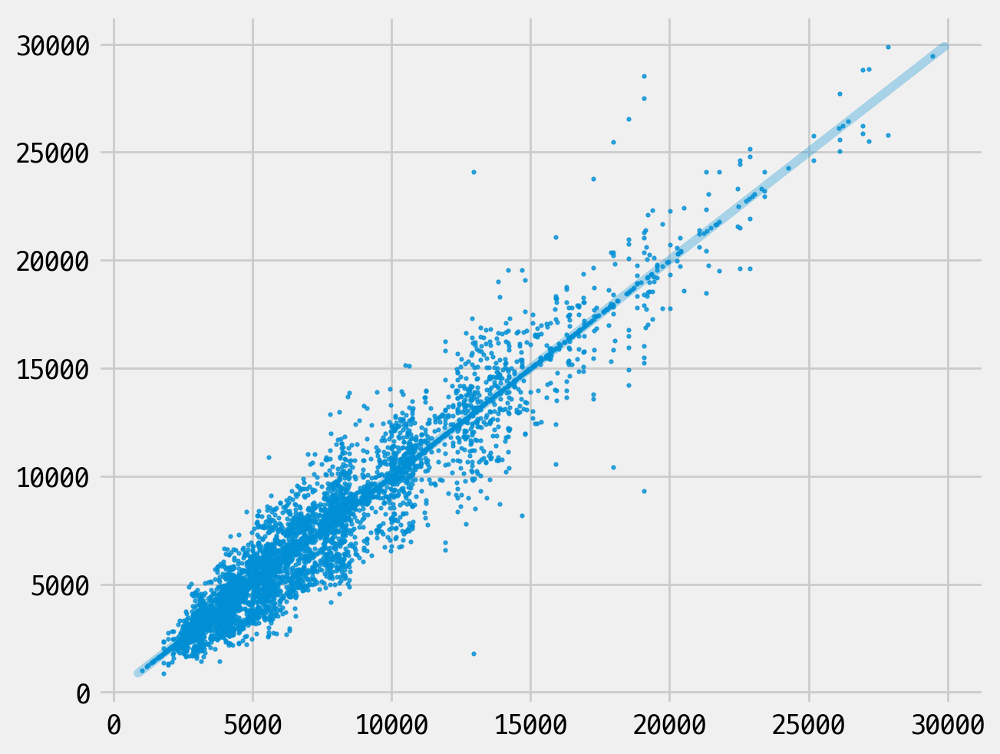

In [74]:
fig,ax = plt.subplots()
ax.plot(y,y,alpha = 0.3)
ax.scatter(y_pred,y,s=3, alpha = 0.8)
pass

7220.0270940443515 4083.740837496106


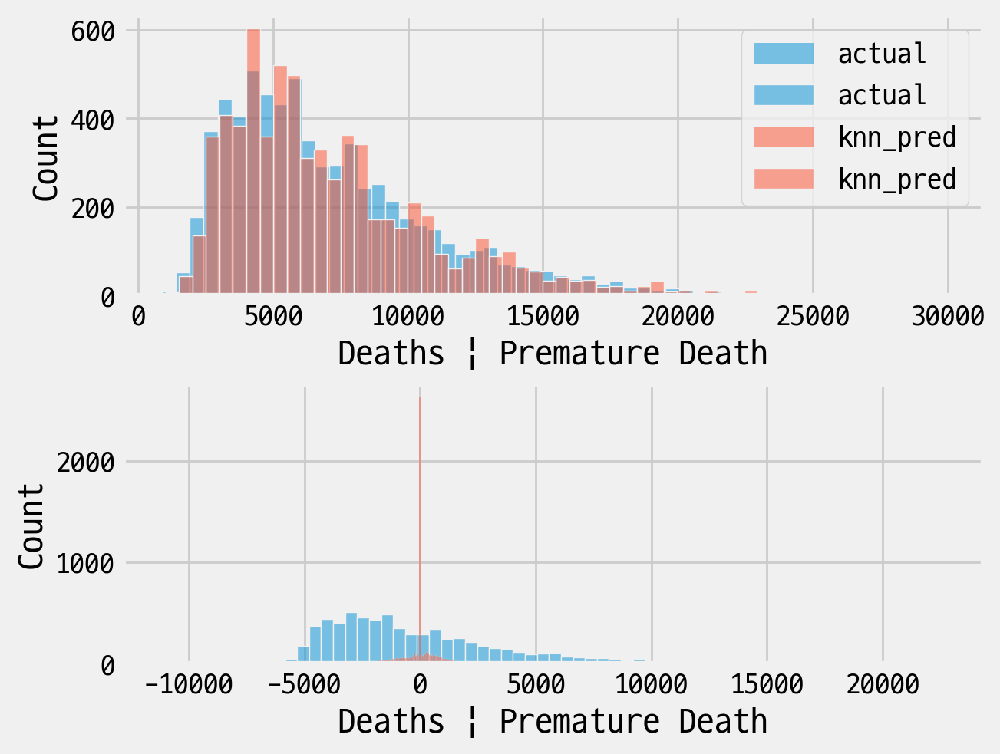

In [75]:
fig,axes = plt.subplots(2,1)
sns.histplot(y,label='actual',ax=axes[0],alpha=0.5)
sns.histplot(y_pred,label='knn_pred',ax=axes[0],alpha=0.5)

sns.histplot(y-np.mean(y),ax=axes[1], label = 'baseline',alpha=0.5)
sns.histplot(y-y_pred,ax=axes[1], label = 'knn_pred',alpha=0.5)
axes[0].legend()

print(y.mean(),y.std())

### train test split and cross validation

In [76]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import r2_score

In [77]:
train_X, test_X, train_y, test_y = train_test_split(X,y,
                                                    test_size = 0.2,
                                                    random_state=801) #check how to using stratify option

display(train_X.shape)
display(test_X.shape)
display(train_y.shape)
display(test_y .shape)

(5460, 4)

(1365, 4)

(5460,)

(1365,)

In [78]:
knn_model = KNeighborsRegressor(n_neighbors=7,weights='distance',metric=vec_metric_cy_weighted,algorithm='auto')
knn_model.fit(train_X, train_y)

KNeighborsRegressor(metric=<numpy.vectorize object at 0x000001AE000D4FA0>,
                    n_neighbors=7, weights='distance')

In [79]:
y_pred = knn_model.predict(test_X)

#n=5, 7 둘다 시간/MSE에 큰 차이는 없는 것으로 보임
#k_nn 특성상 train set의 크기가 시간/MSE에 더 큰 영향을 주는 것으로 보임

In [80]:
print(np.sqrt(mean_squared_error(y_pred,test_y)))
print(np.sqrt(mean_squared_error([train_y.mean()]*len(test_y),test_y)))
r2_score(test_y,y_pred)

1595.39612597244
4027.8392351868088


0.8429134582958928

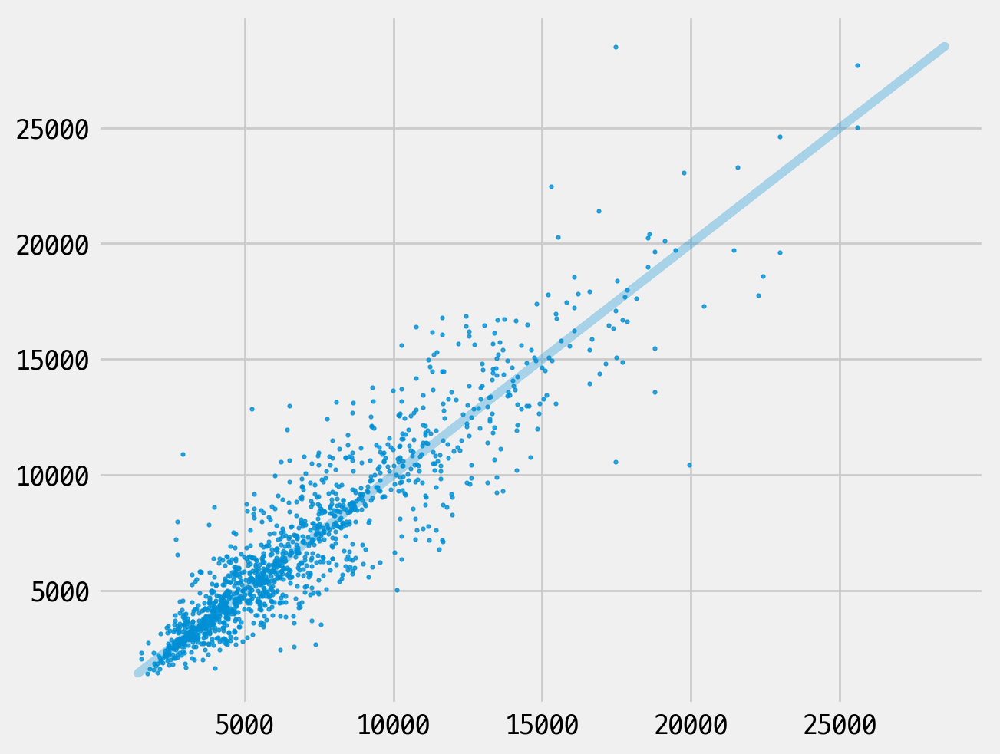

In [81]:
fig,ax = plt.subplots()
ax.plot(test_y,test_y,alpha = 0.3)
ax.scatter(y_pred,test_y,s=3, alpha = 0.8)
pass

7105.79272914359 4026.7826091168167


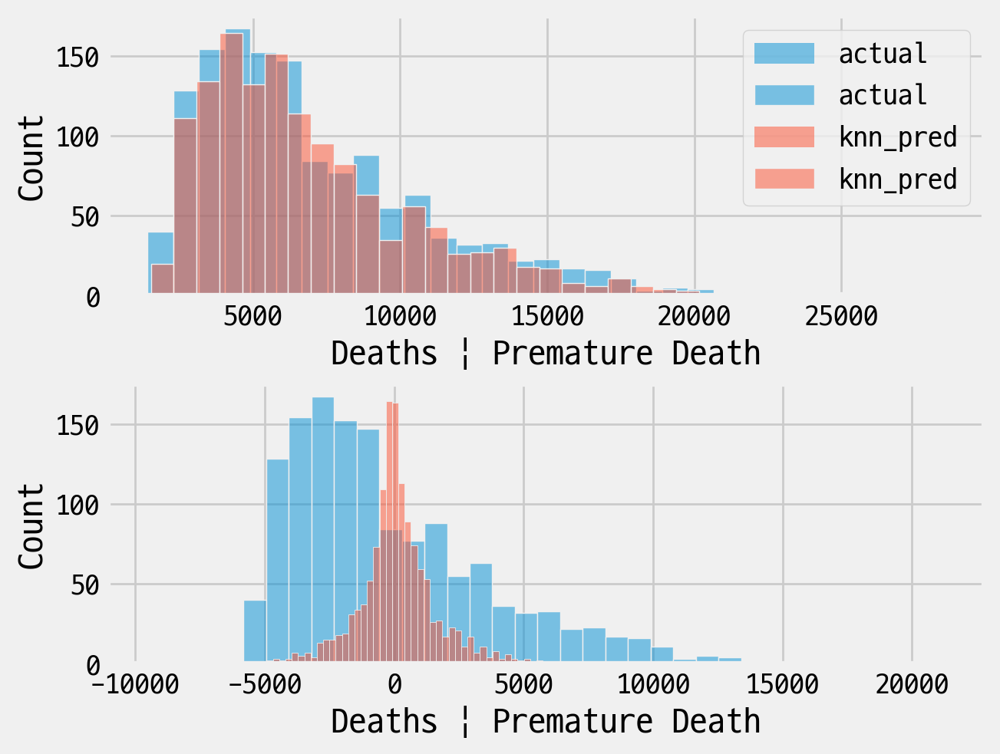

In [82]:
fig,axes = plt.subplots(2,1)
sns.histplot(test_y,label='actual',ax=axes[0],alpha=0.5)
sns.histplot(y_pred,label='knn_pred',ax=axes[0],alpha=0.5)

sns.histplot(test_y-np.mean(train_y),ax=axes[1], label = 'baseline',alpha=0.5)
sns.histplot(test_y-y_pred,ax=axes[1], label = 'knn_pred',alpha=0.5)
axes[0].legend()

print(test_y.mean(),test_y.std())

In [100]:
# test_col 리스트
test_col = [
    'Deaths | Premature Death',                                  
    'Deaths | Injury Deaths',                                    
    'Cancer | All Cancer Deaths',                                
    'Cardiovascular Disease | Cardiovascular Disease Deaths',    
    'Deaths | Deaths from All Causes',                           
    'Substance Use | Drug Overdose Deaths',                      
    'Cardiovascular Disease | Heart Disease Deaths',             
    'Diabetes and Obesity | Diabetes Deaths',                    
    'Cancer | Lung Cancer Deaths',                               
    'Life Expectancy at Birth | Life Expectancy',                
    'Mental Health | Suicide',                                   
    'Deaths | Motor Vehicle Deaths',                             
    'Deaths | Gun Deaths (Firearms)',                            
    'Respiratory Infection | Pneumonia or Influenza Deaths',     
    'Substance Use | Opioid Overdose Deaths',                    
    'Cancer | Colorectal Cancer Deaths',                         
    'Crime Incidents | Homicides',                               
]

test_col

['Deaths | Premature Death',
 'Deaths | Injury Deaths',
 'Cancer | All Cancer Deaths',
 'Cardiovascular Disease | Cardiovascular Disease Deaths',
 'Deaths | Deaths from All Causes',
 'Substance Use | Drug Overdose Deaths',
 'Cardiovascular Disease | Heart Disease Deaths',
 'Diabetes and Obesity | Diabetes Deaths',
 'Cancer | Lung Cancer Deaths',
 'Life Expectancy at Birth | Life Expectancy',
 'Mental Health | Suicide',
 'Deaths | Motor Vehicle Deaths',
 'Deaths | Gun Deaths (Firearms)',
 'Respiratory Infection | Pneumonia or Influenza Deaths',
 'Substance Use | Opioid Overdose Deaths',
 'Cancer | Colorectal Cancer Deaths',
 'Crime Incidents | Homicides']

Processing column: Deaths | Premature Death


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
1184496.4412294289
16674495.720254228

Mean Absolute Percentage Error (MAPE):
0.09443626478668649
0.4351945227627554

Root Mean Squared Error (RMSE):
1088.3457360735276
4083.4416513835763

Root Mean Squared Log Error (RMSLE):
0.1595853737557311
0.5623152636954458



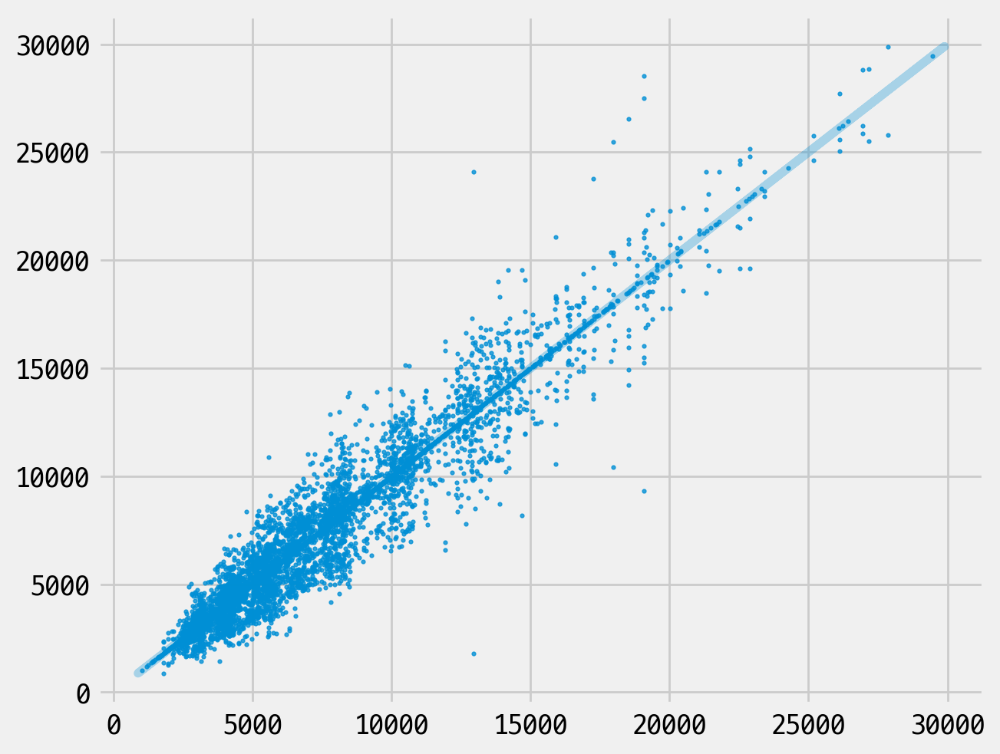

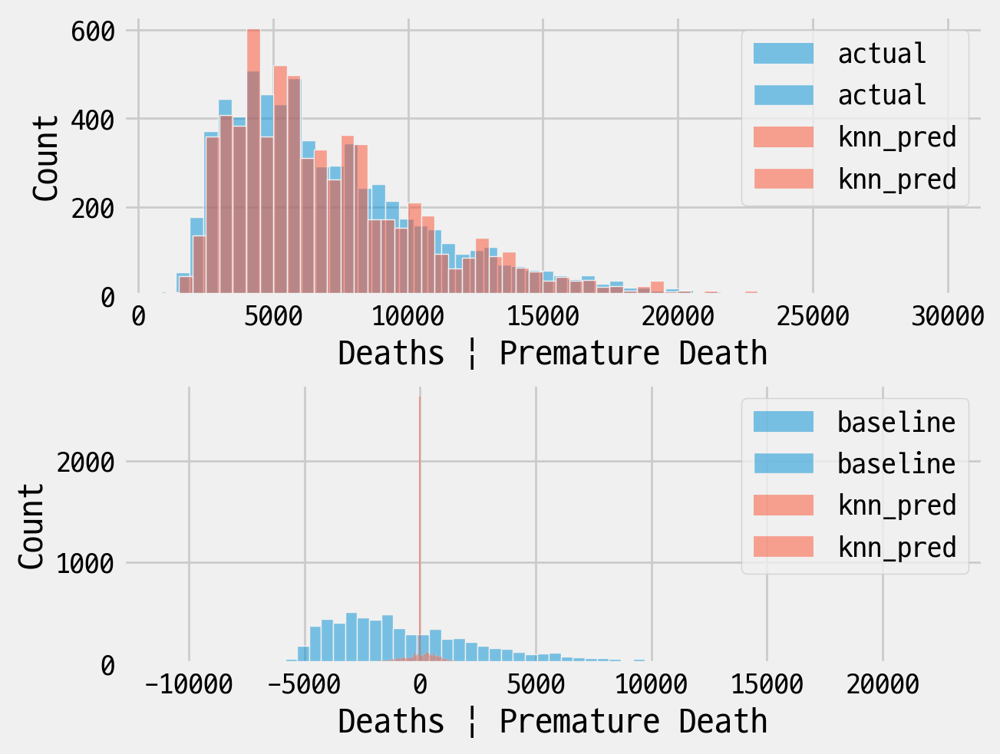

Mean: 7220.0270940443515, Std Dev: 4083.740837496106
Processing column: Deaths | Injury Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
247.4276377156269
3183.8416498961656

Mean Absolute Percentage Error (MAPE):
0.12030075642415834
0.5156460132928423

Root Mean Squared Error (RMSE):
15.72983273005873
56.425540758562214

Root Mean Squared Log Error (RMSLE):
0.1906519526021671
0.6843700853597837



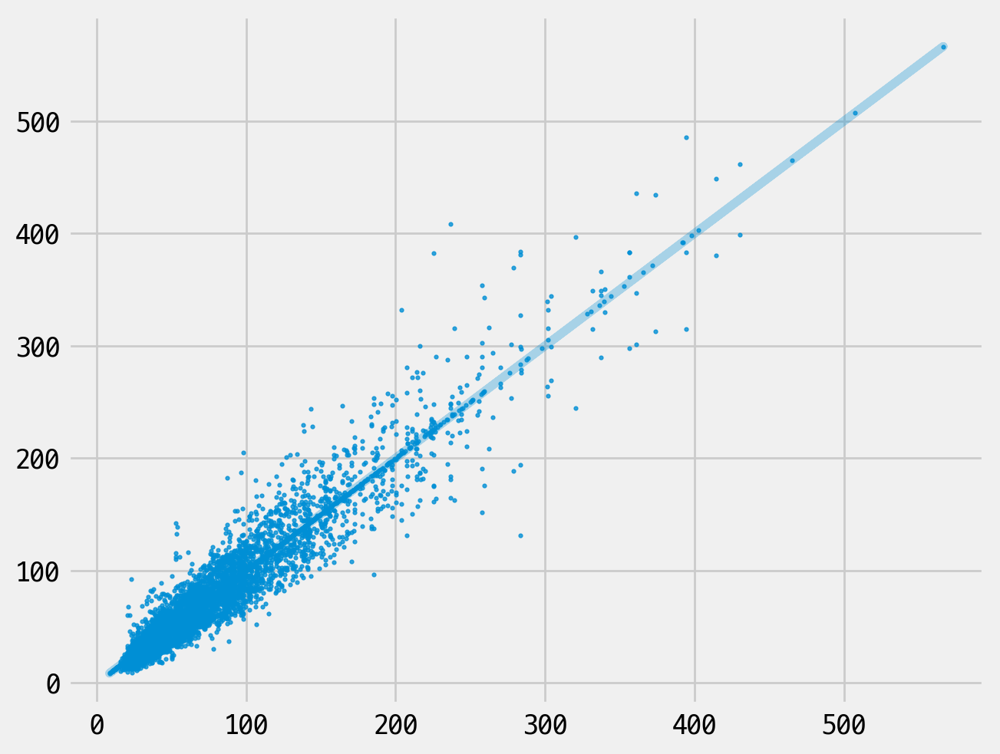

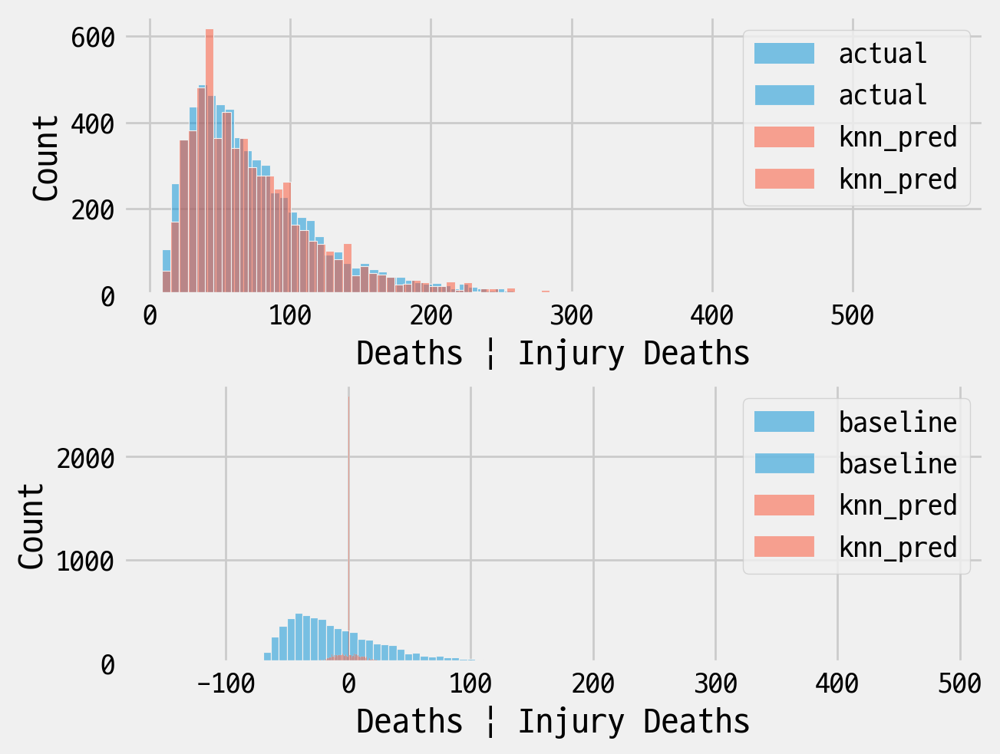

Mean: 78.11813431159638, Std Dev: 56.42995503908988
Processing column: Cancer | All Cancer Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
259.5115288686594
2475.990614532354

Mean Absolute Percentage Error (MAPE):
0.0620086964840608
0.24988352247245862

Root Mean Squared Error (RMSE):
16.109361528895533
49.75932690996085

Root Mean Squared Log Error (RMSLE):
0.1054977927498653
0.3199728774076366



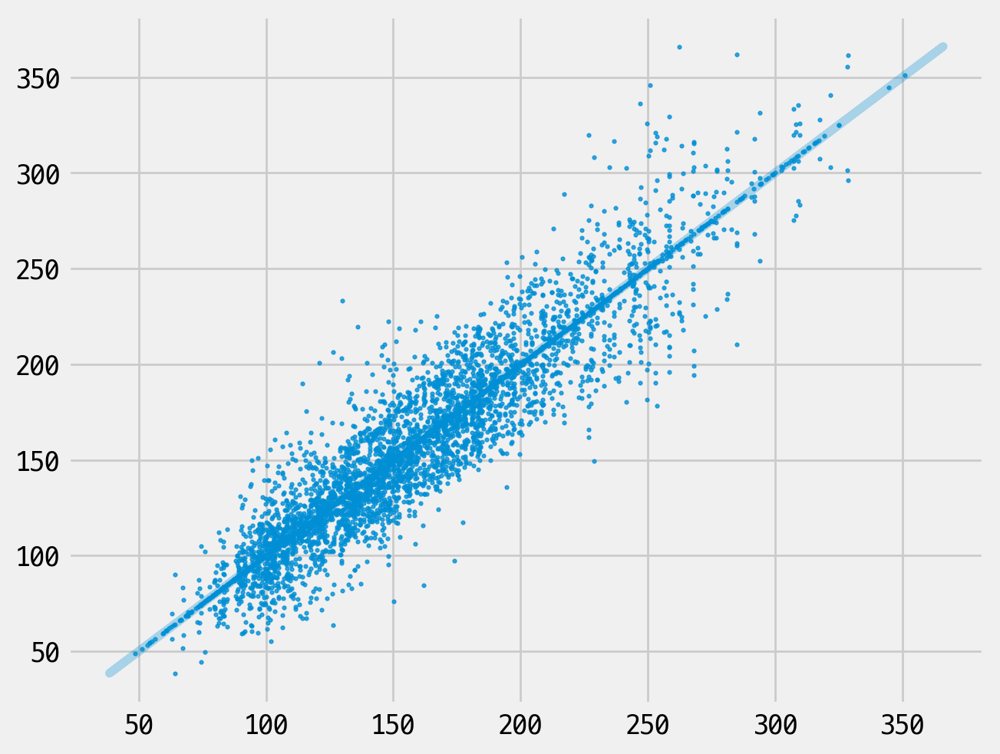

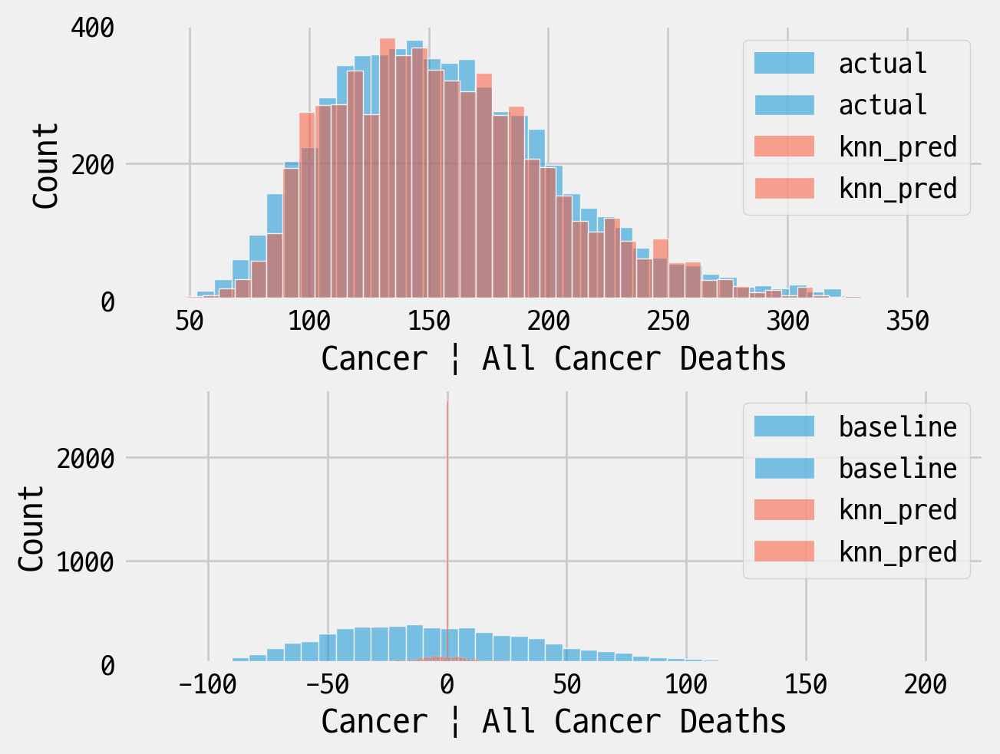

Mean: 157.7095047417267, Std Dev: 49.76332733822714
Processing column: Cardiovascular Disease | Cardiovascular Disease Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
721.4696192934609
8001.997752562691

Mean Absolute Percentage Error (MAPE):
0.07496018114610312
0.3122799076075488

Root Mean Squared Error (RMSE):
26.860186508910562
89.45388617920796

Root Mean Squared Log Error (RMSLE):
0.12751539521978772
0.40177244262578615



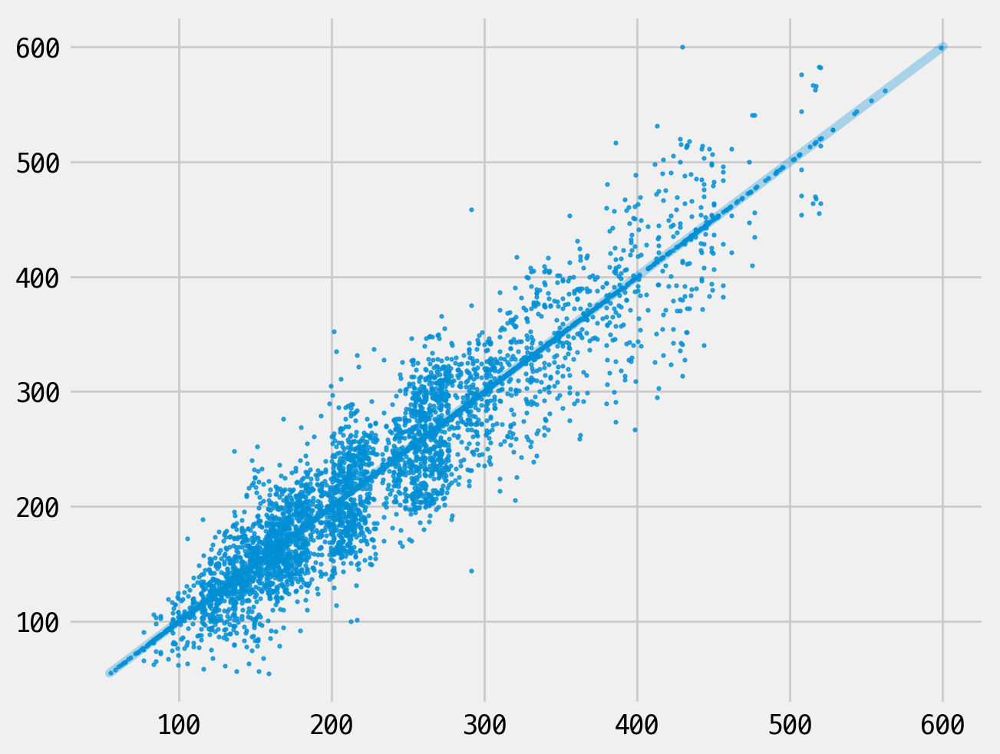

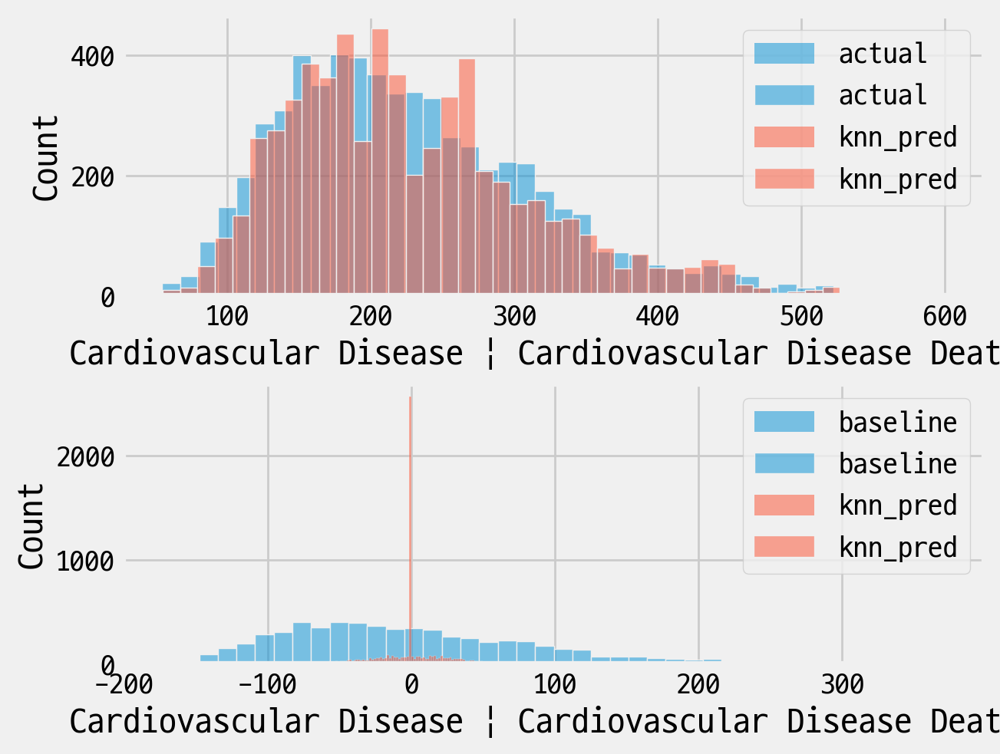

Mean: 228.20255800688452, Std Dev: 89.46112208507857
Processing column: Deaths | Deaths from All Causes


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
5892.043059735382
75752.69664158425

Mean Absolute Percentage Error (MAPE):
0.06228467963658698
0.2829061139681894

Root Mean Squared Error (RMSE):
76.7596447342963
275.2320777845203

Root Mean Squared Log Error (RMSLE):
0.10506858206124979
0.3685519546980592



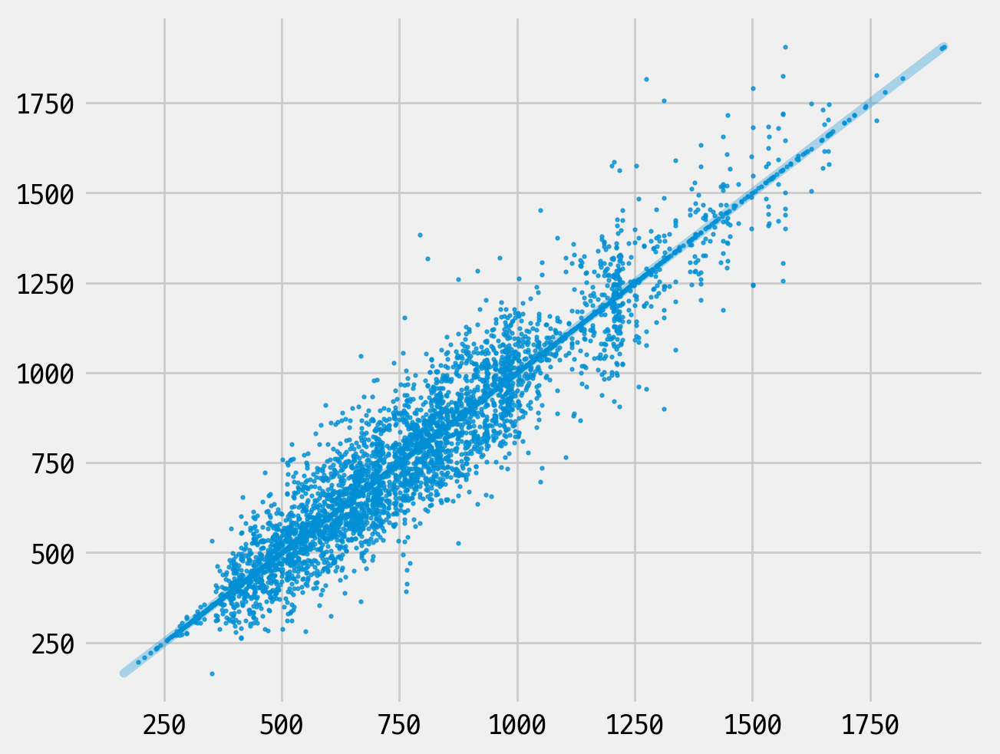

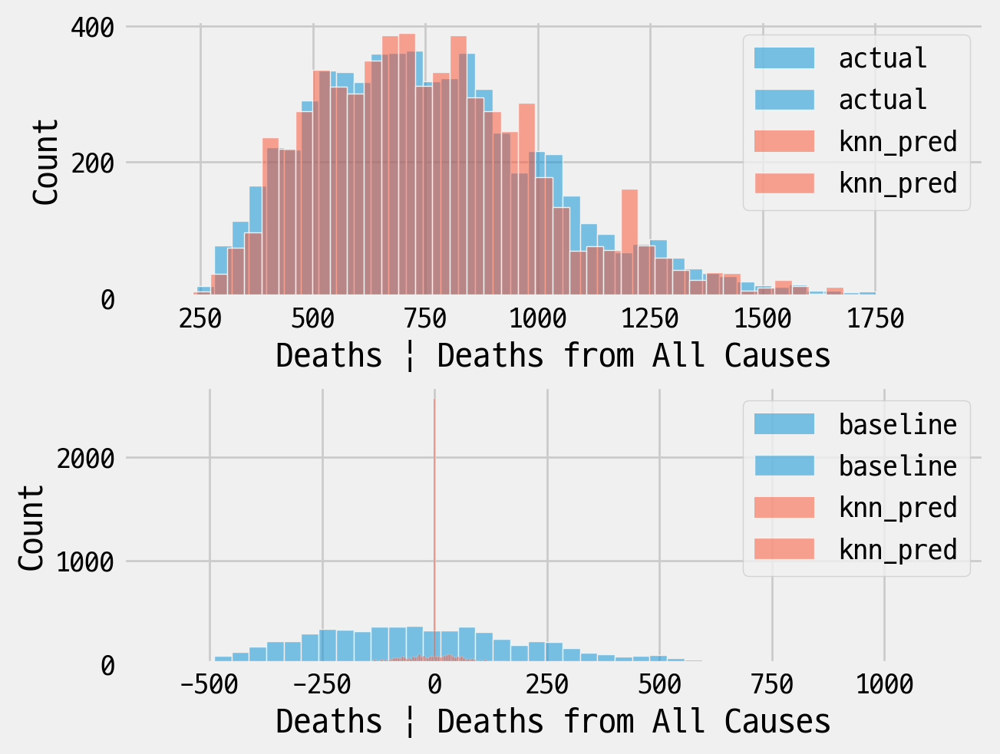

Mean: 770.4697789701974, Std Dev: 275.2541661500135
Processing column: Substance Use | Drug Overdose Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
106.67471521540011
855.3276489090267

Mean Absolute Percentage Error (MAPE):
0.17189180414084027
0.648549840951463

Root Mean Squared Error (RMSE):
10.328345231226544
29.245985175901097

Root Mean Squared Log Error (RMSLE):
0.2598328690362969
0.8604764439676381



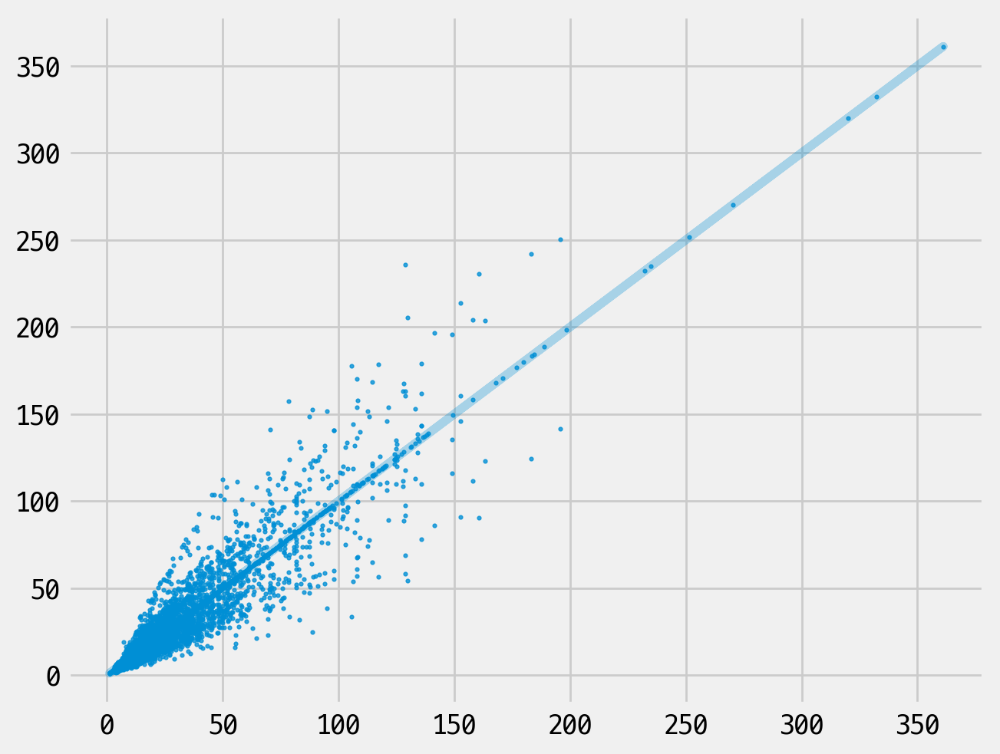

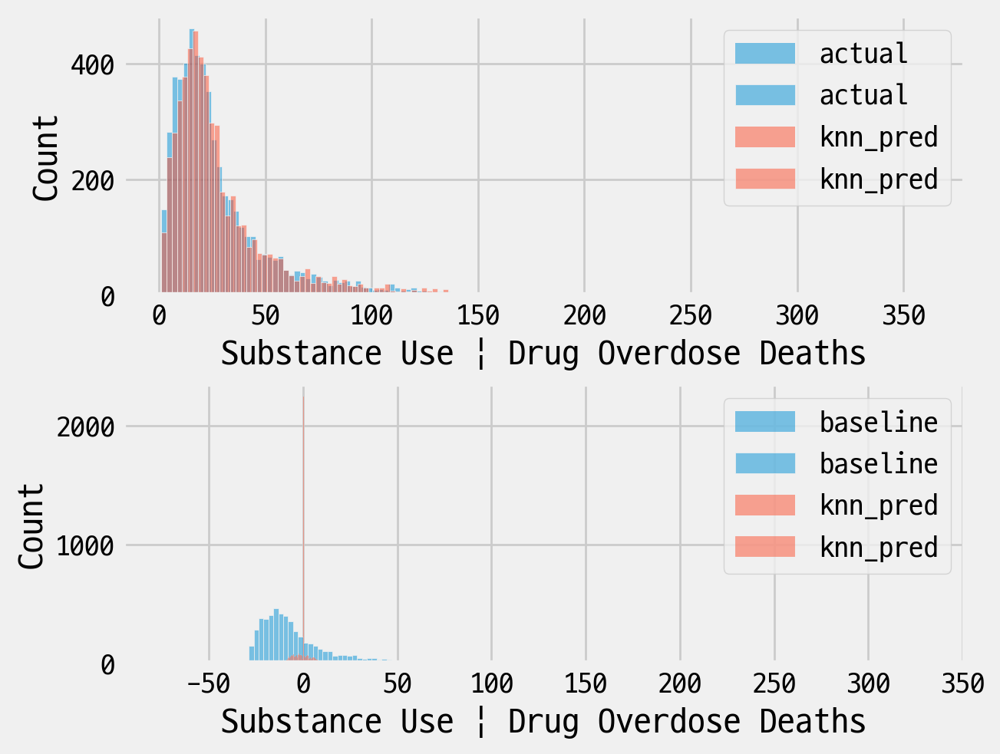

Mean: 29.839379087506053, Std Dev: 29.24866866310002
Processing column: Cardiovascular Disease | Heart Disease Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
543.5341059597084
5500.968108082873

Mean Absolute Percentage Error (MAPE):
0.08740885639451873
0.35127840315632786

Root Mean Squared Error (RMSE):
23.313817918987624
74.16851156712579

Root Mean Squared Log Error (RMSLE):
0.148827964440003
0.4603133900343319



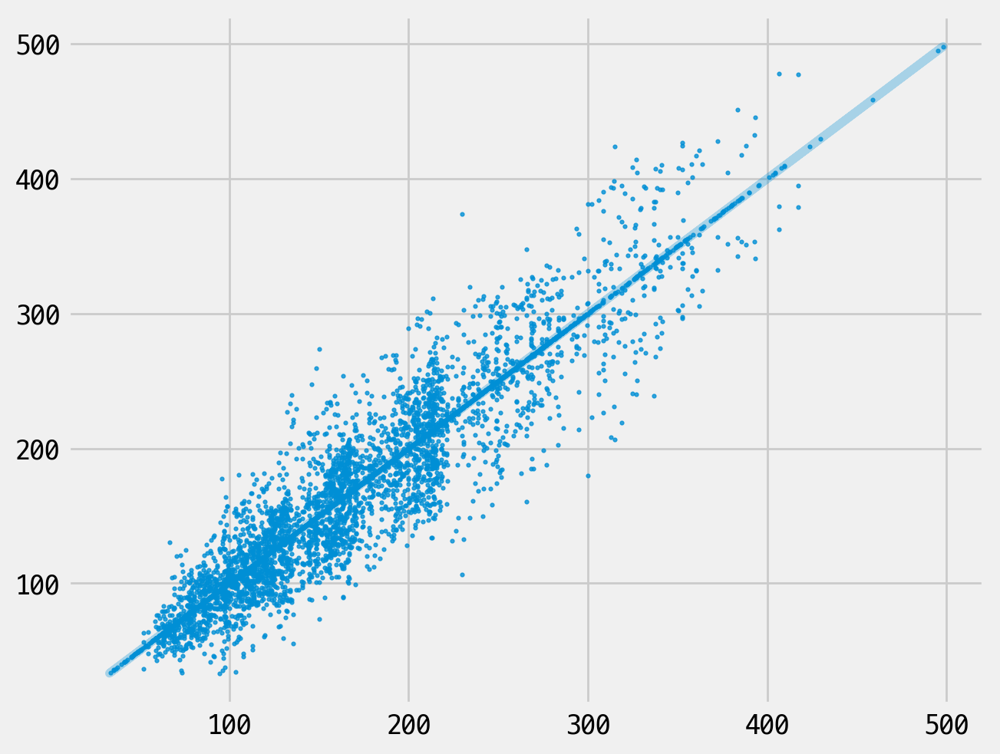

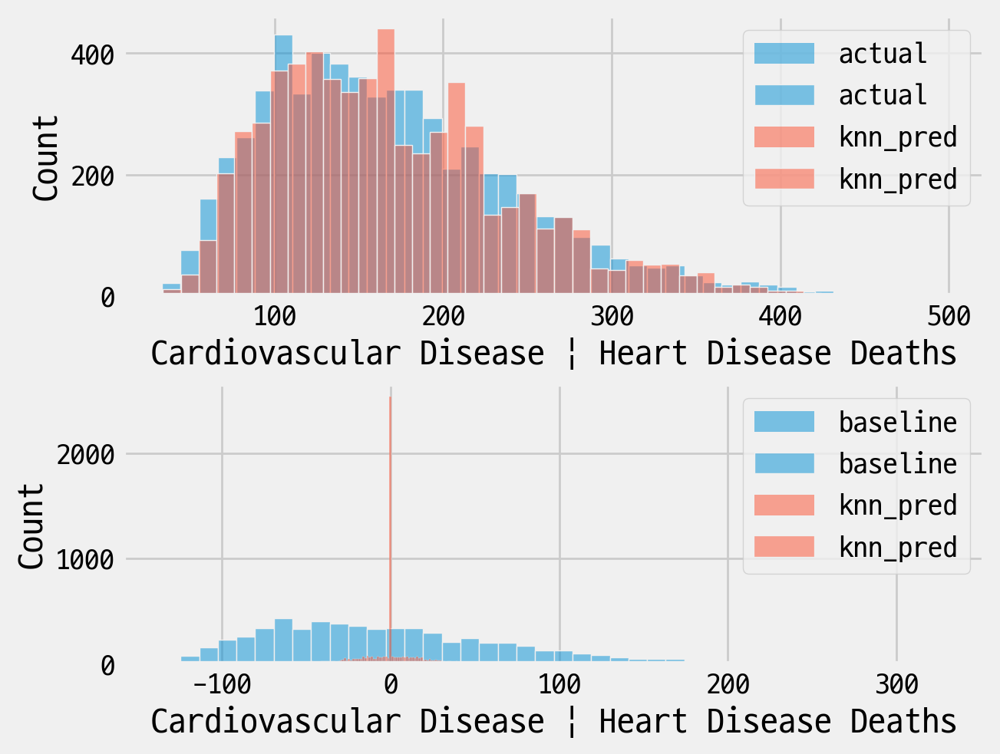

Mean: 168.9238420235086, Std Dev: 74.17456688097572
Processing column: Diabetes and Obesity | Diabetes Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
27.82906533236746
179.6915719668565

Mean Absolute Percentage Error (MAPE):
0.10303563464092301
0.3624597667301979

Root Mean Squared Error (RMSE):
5.275326087775755
13.404908502740945

Root Mean Squared Log Error (RMSLE):
0.1783594551191724
0.46072948163644023



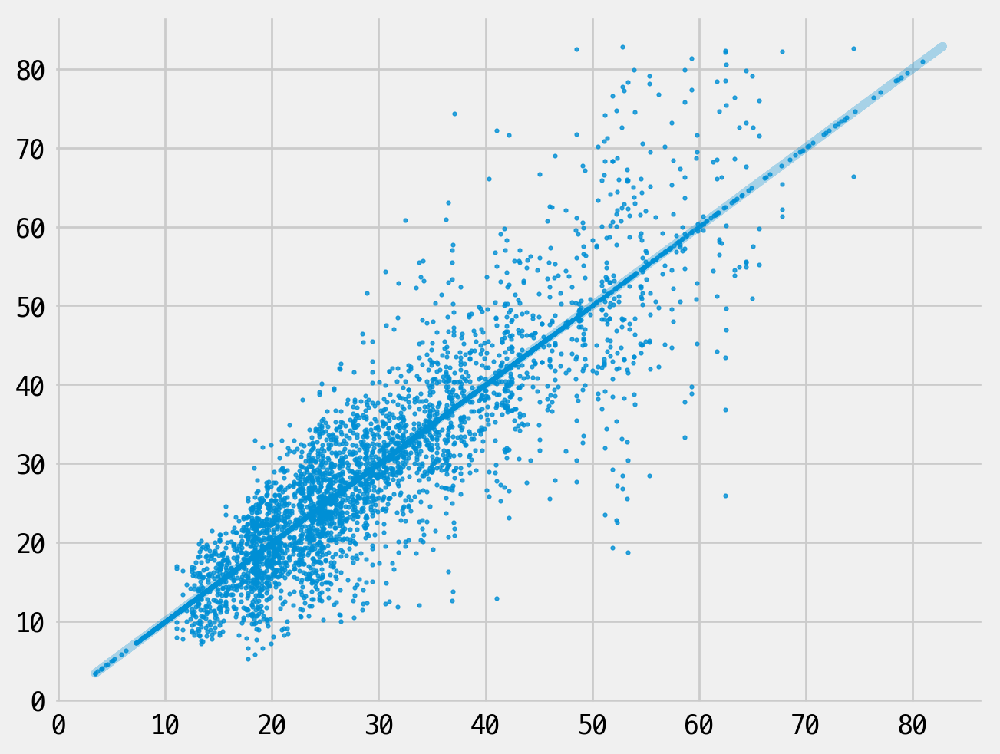

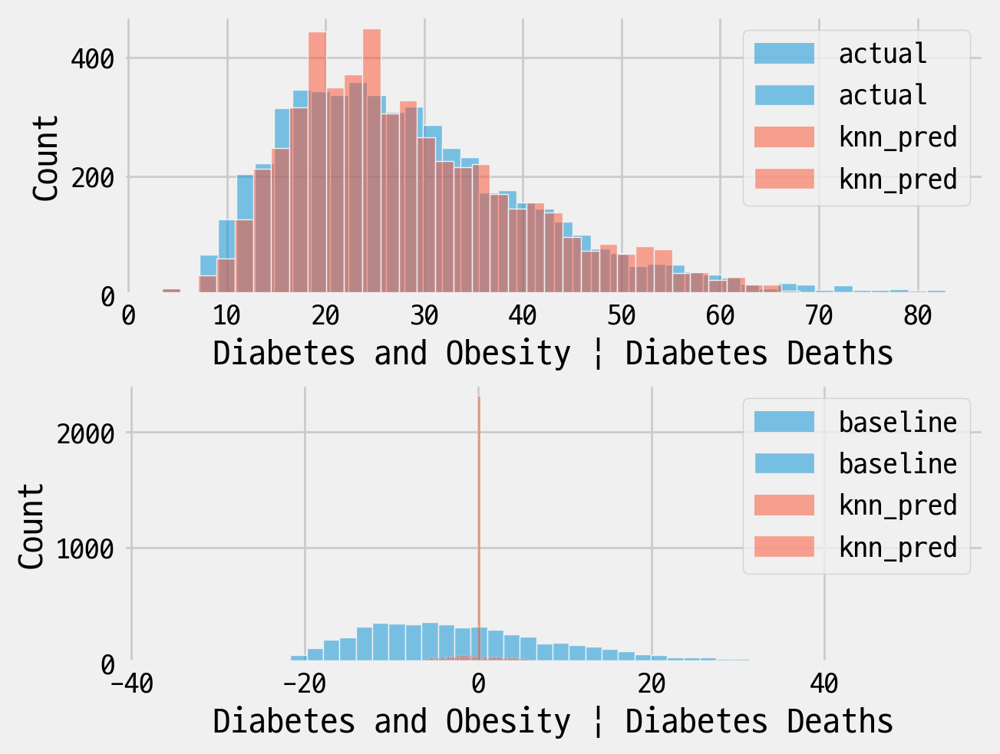

Mean: 28.86753356072297, Std Dev: 13.406132639404174
Processing column: Cancer | Lung Cancer Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
28.3332244526647
268.7117918335267

Mean Absolute Percentage Error (MAPE):
0.08341770659807773
0.35555733200100764

Root Mean Squared Error (RMSE):
5.322896246656016
16.39243093118061

Root Mean Squared Log Error (RMSLE):
0.1362074514620479
0.4691768241832761



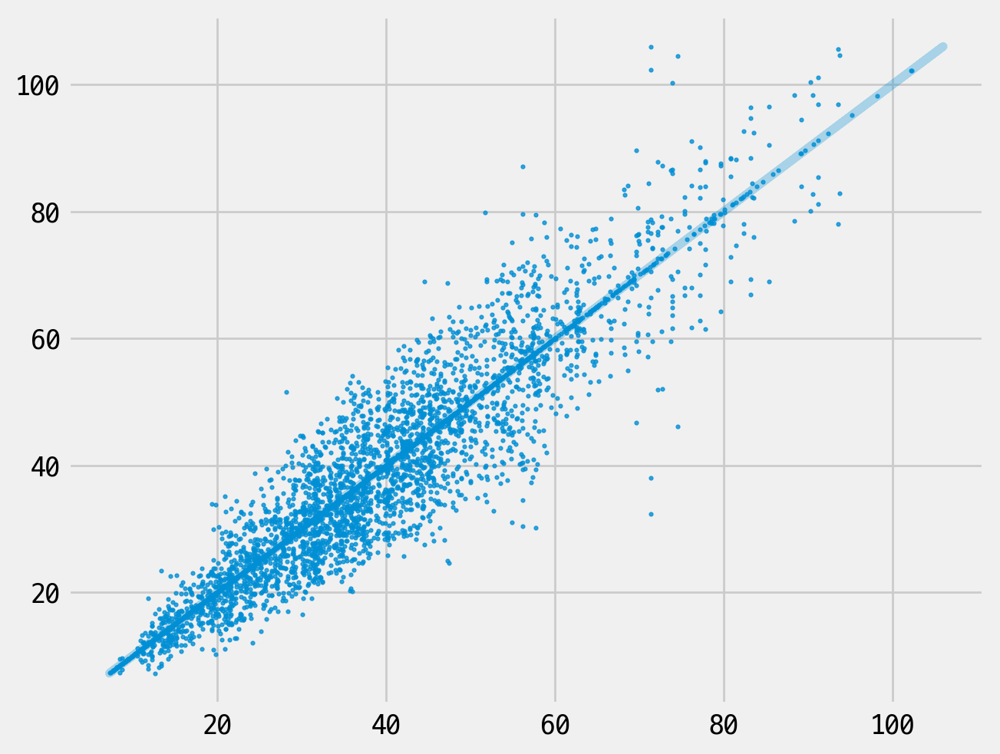

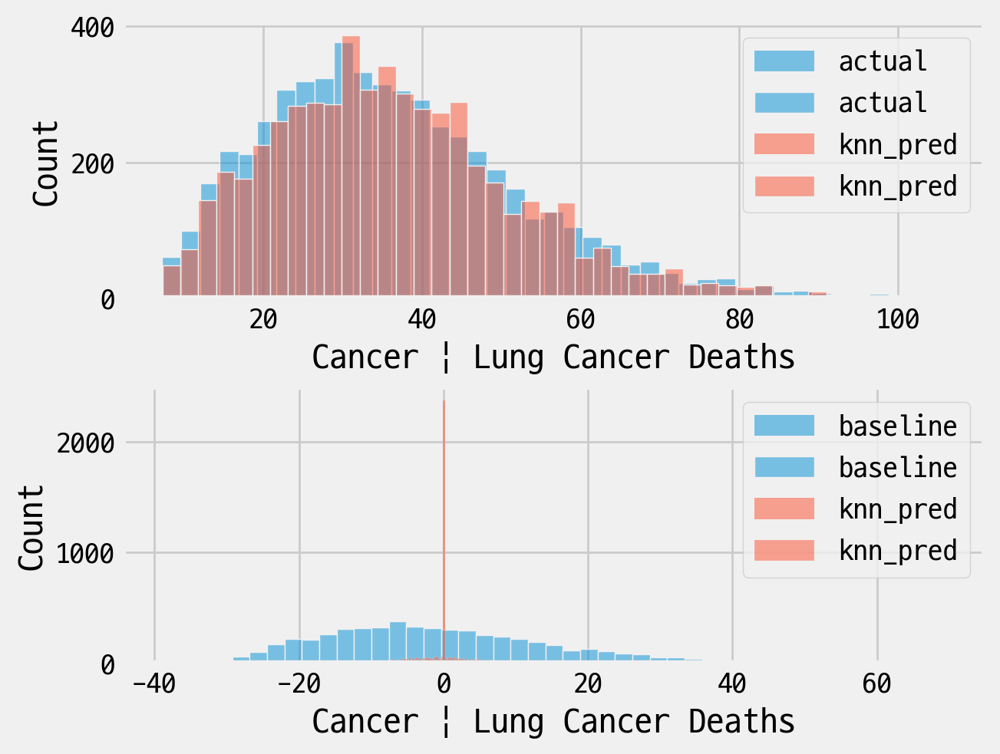

Mean: 36.4755305147706, Std Dev: 16.393928161939648
Processing column: Life Expectancy at Birth | Life Expectancy


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
1.9741667038000175
27.45508554115715

Mean Absolute Percentage Error (MAPE):
0.011071791194254606
0.05362706352435677

Root Mean Squared Error (RMSE):
1.4050504274936246
5.239760065227906

Root Mean Squared Log Error (RMSLE):
0.017805486027183574
0.06717205391885357



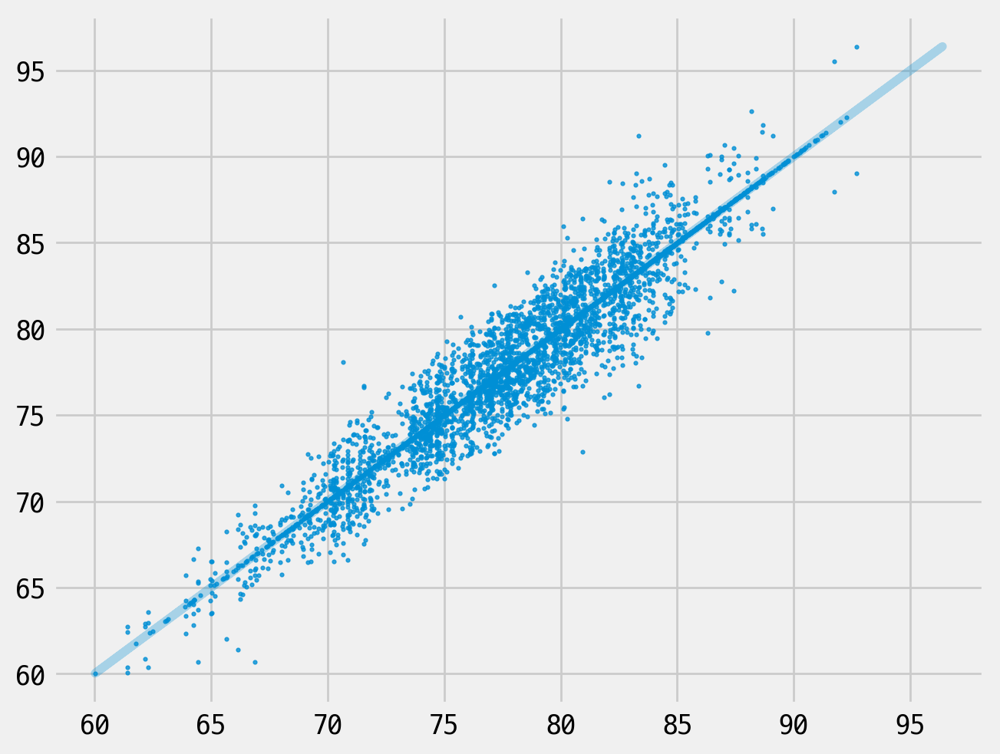

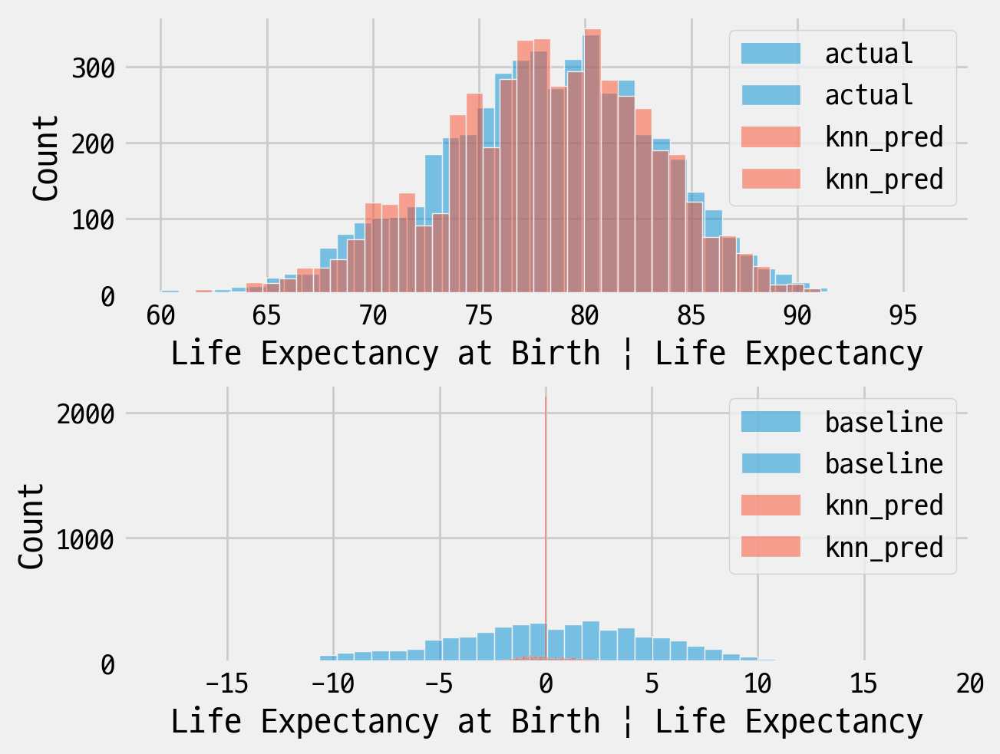

Mean: 78.13987584296875, Std Dev: 5.240284959801246
Processing column: Mental Health | Suicide


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
7.206749678670409
67.99537008167843

Mean Absolute Percentage Error (MAPE):
0.11609111194990086
0.5059597737879681

Root Mean Squared Error (RMSE):
2.6845390067328894
8.245930516423142

Root Mean Squared Log Error (RMSLE):
0.1740065044662583
0.6277359163852143



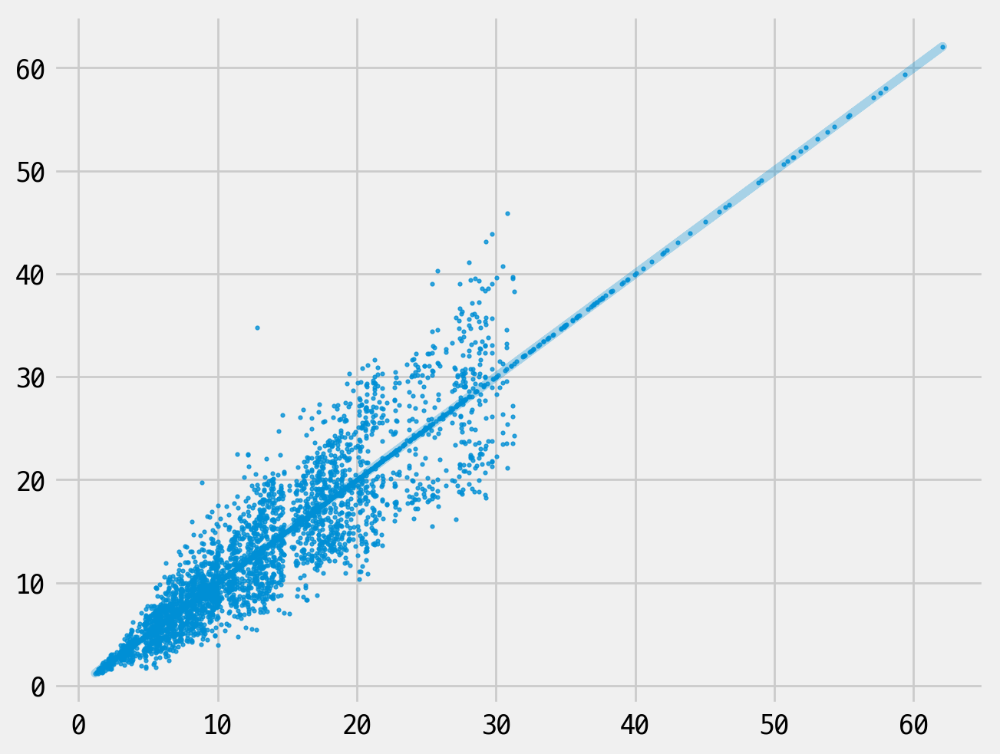

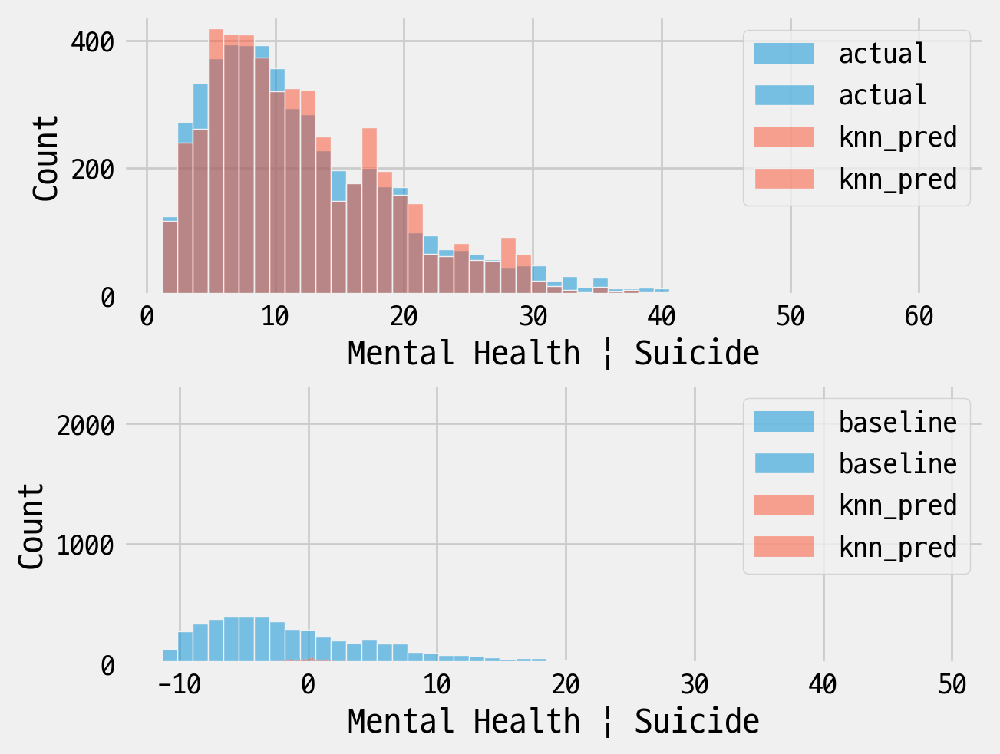

Mean: 12.561472731446175, Std Dev: 8.246733235385028
Processing column: Deaths | Motor Vehicle Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
8.594317658334912
55.16817195375911

Mean Absolute Percentage Error (MAPE):
0.1282017756234555
0.49924102454266006

Root Mean Squared Error (RMSE):
2.9316066684217565
7.42752798404416

Root Mean Squared Log Error (RMSLE):
0.20009231588648704
0.5944567897112525



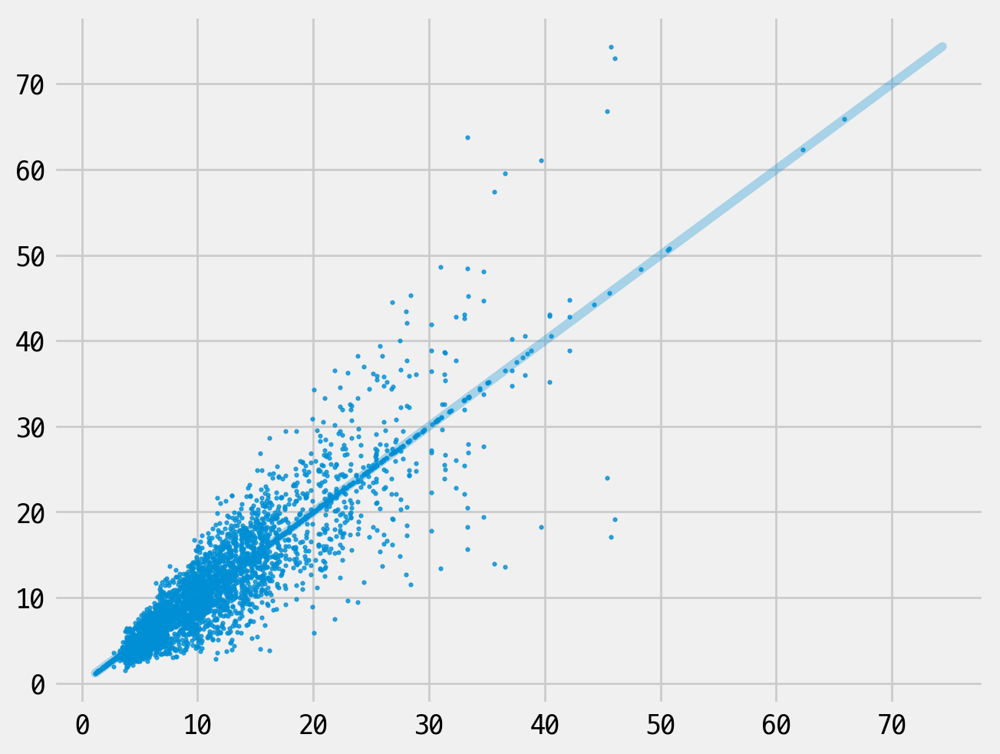

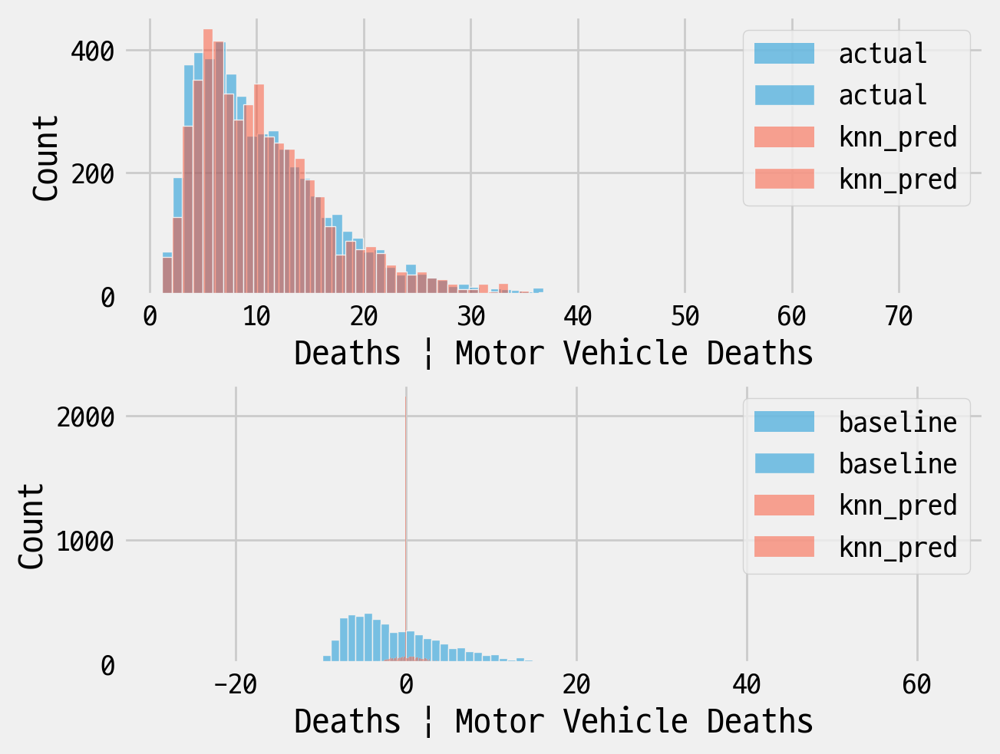

Mean: 11.006874090056534, Std Dev: 7.428254570300146
Processing column: Deaths | Gun Deaths (Firearms)


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
58.72965483691259
486.85656563751894

Mean Absolute Percentage Error (MAPE):
0.181326898460699
0.7699676074606999

Root Mean Squared Error (RMSE):
7.66352757135463
22.064826435698944

Root Mean Squared Log Error (RMSLE):
0.2702085142290683
1.046519084709777



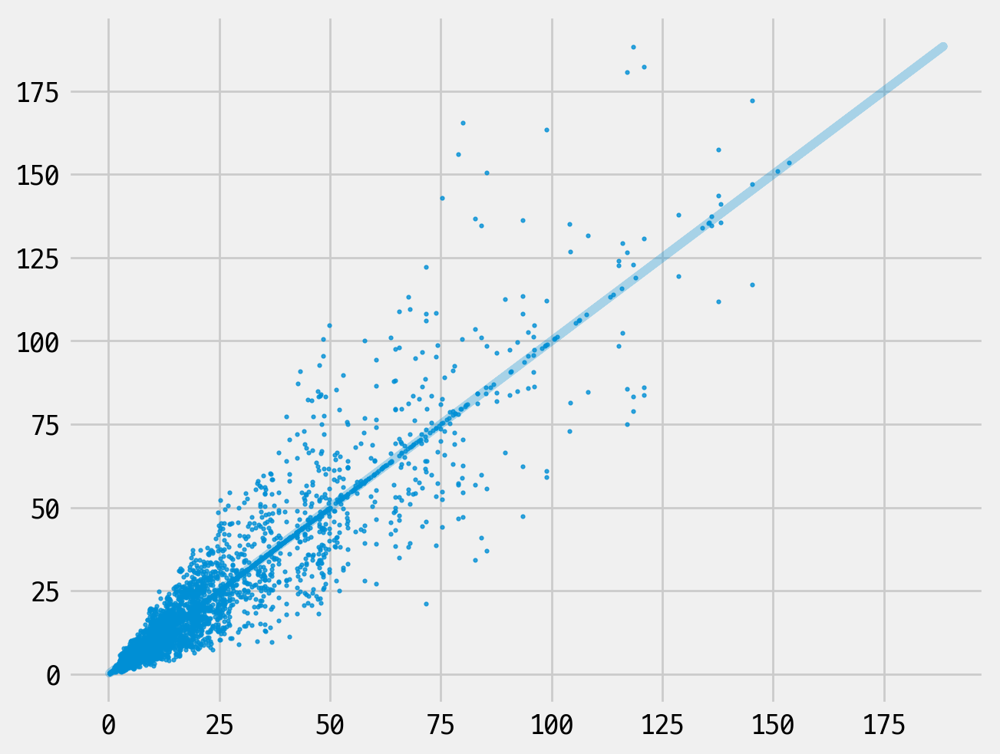

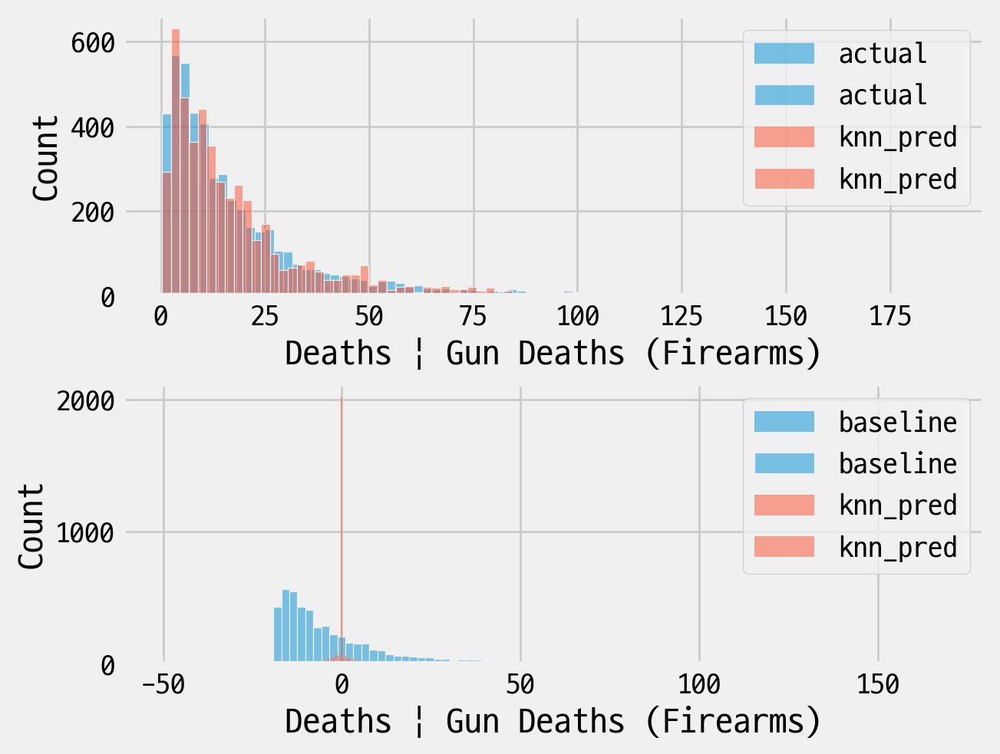

Mean: 19.41793764691354, Std Dev: 22.06707645624583
Processing column: Respiratory Infection | Pneumonia or Influenza Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
7.512503825376908
29.792326372200517

Mean Absolute Percentage Error (MAPE):
0.11102245122724481
0.2962250973981115

Root Mean Squared Error (RMSE):
2.7408947125668486
5.458234730405107

Root Mean Squared Log Error (RMSLE):
0.17687214854824337
0.3557684700344039



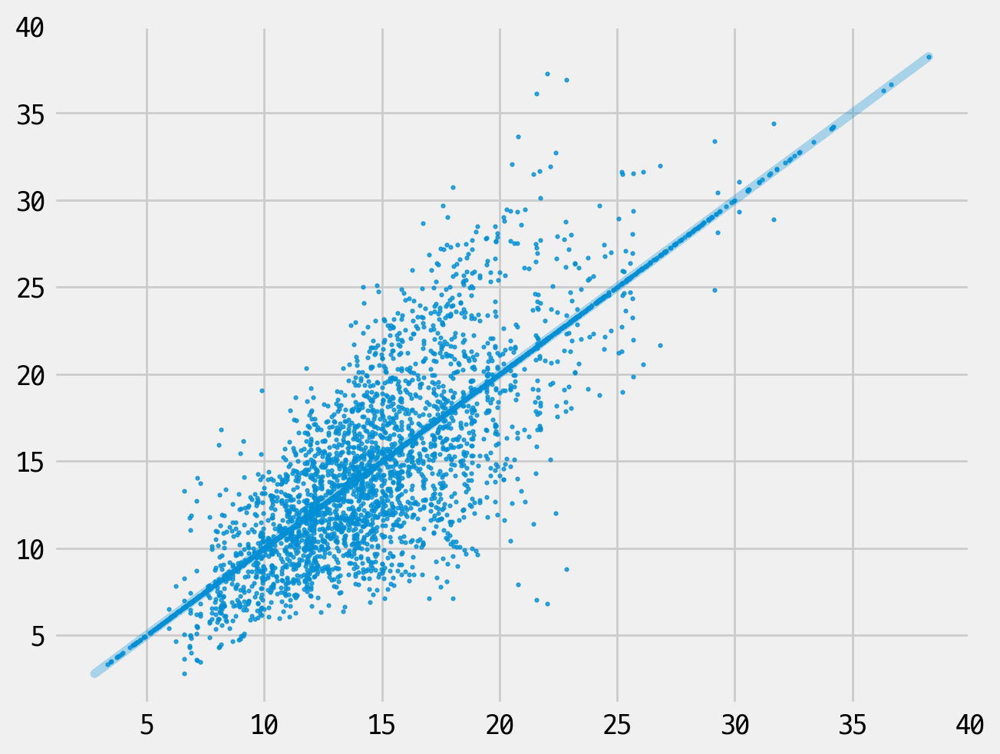

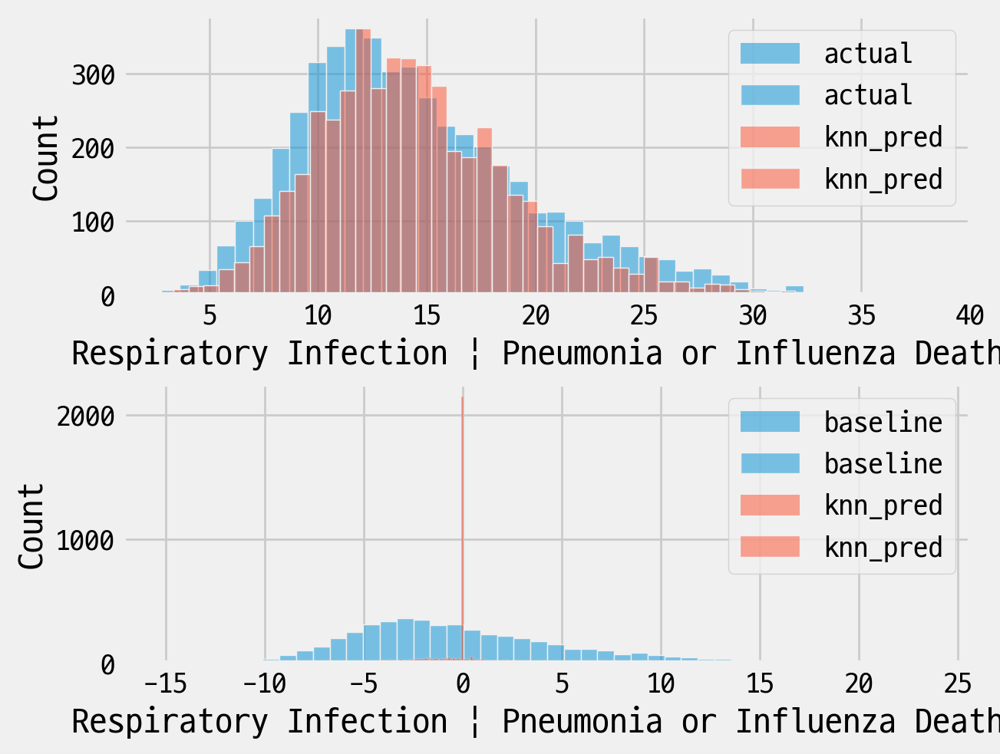

Mean: 14.557715485132176, Std Dev: 5.458800204090168
Processing column: Substance Use | Opioid Overdose Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
103.74204638575468
651.087212806749

Mean Absolute Percentage Error (MAPE):
0.23610592607329844
0.7700159455678921

Root Mean Squared Error (RMSE):
10.185383958680923
25.51641065680573

Root Mean Squared Log Error (RMSLE):
0.3609830627206567
0.987927119616135



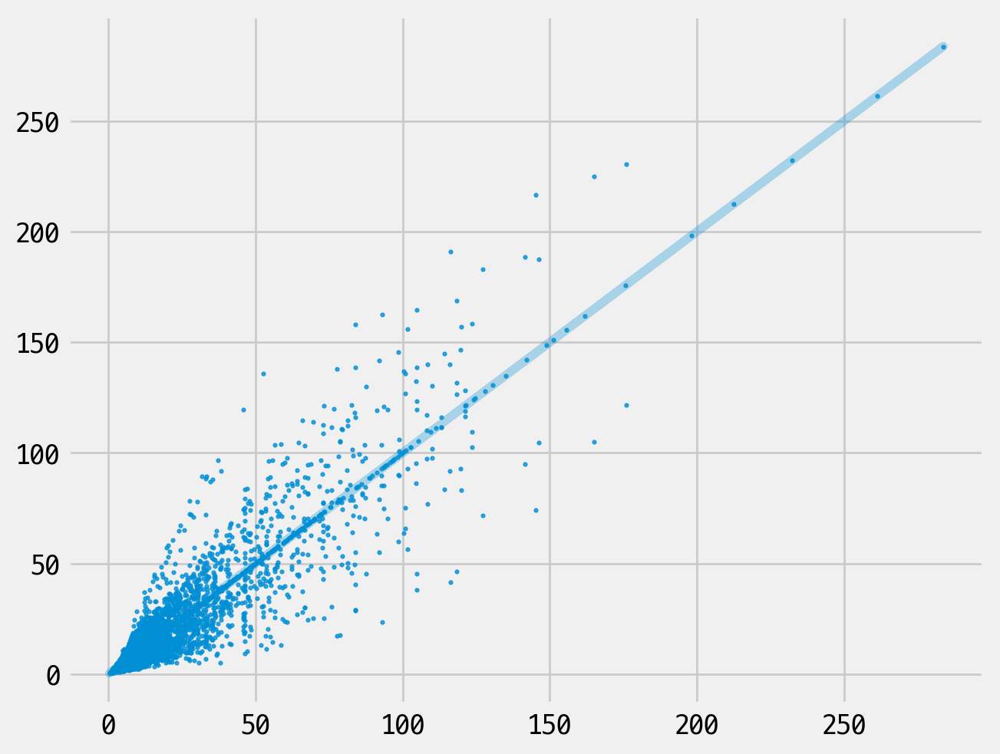

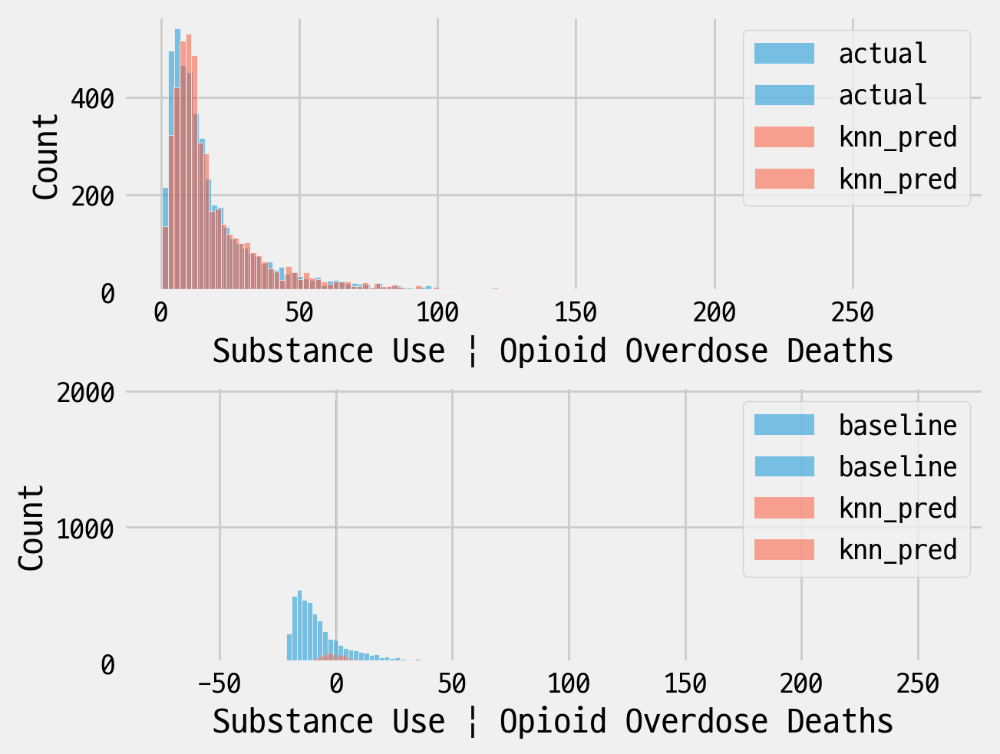

Mean: 21.639407420142295, Std Dev: 25.519061299378382
Processing column: Cancer | Colorectal Cancer Deaths


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
3.5935550092046427
26.6426217204825

Mean Absolute Percentage Error (MAPE):
0.06828344239422701
0.25681851731857264

Root Mean Squared Error (RMSE):
1.8956674310660724
5.161649127990249

Root Mean Squared Log Error (RMSLE):
0.1098776392040028
0.3016450840565393



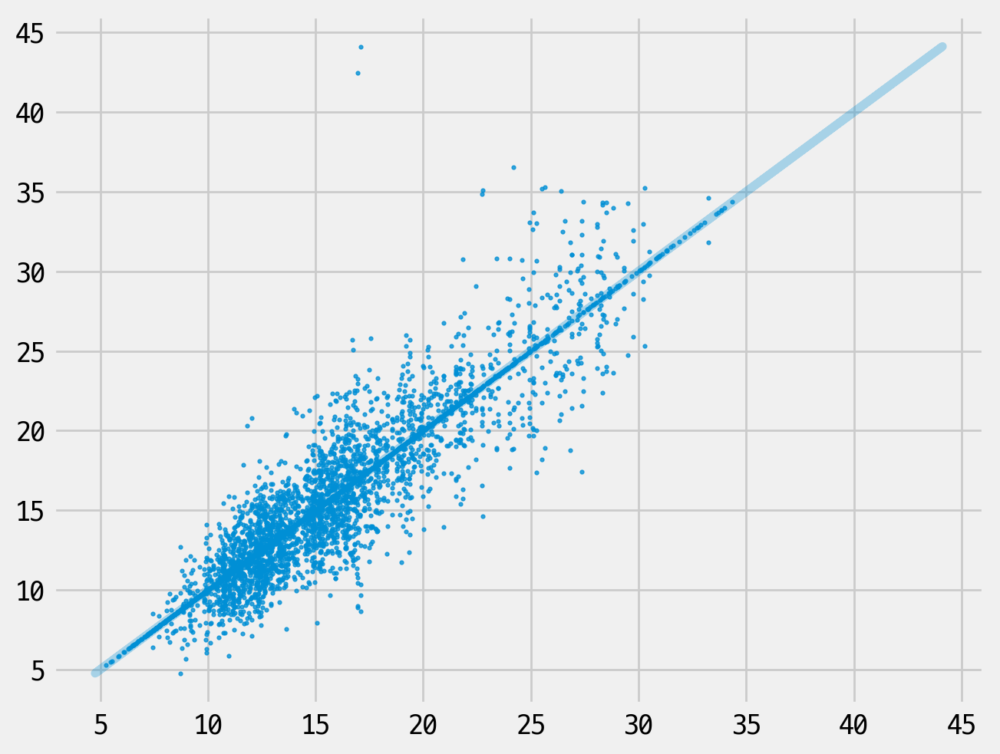

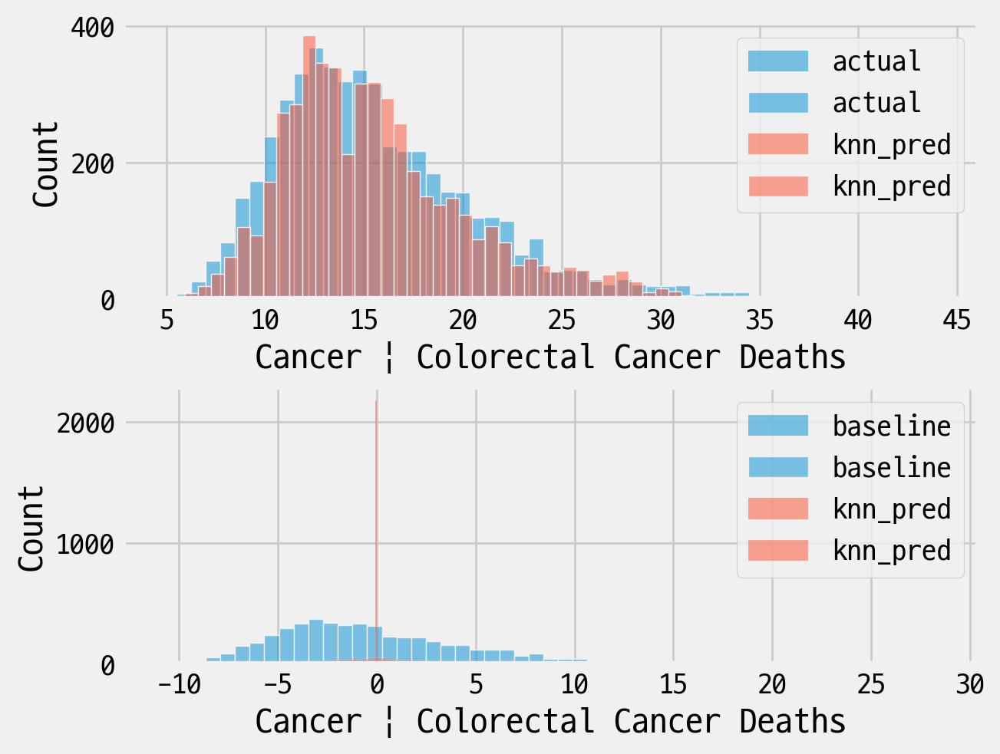

Mean: 15.64664981937292, Std Dev: 5.162160866367355
Processing column: Crime Incidents | Homicides


C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
C:\Users\jaewonchoi\AppData\Local\Temp\ipykernel_124084\3945777364.py:9: SettingWithCopyWarning: 
A v

Mean Squared Error (MSE):
51.4312869929716
477.1911708913276

Mean Absolute Percentage Error (MAPE):
0.17493669441428336
0.8866564932367479

Root Mean Squared Error (RMSE):
7.171560987189023
21.844705786330188

Root Mean Squared Log Error (RMSLE):
0.2647272920123231
1.1121429976854627



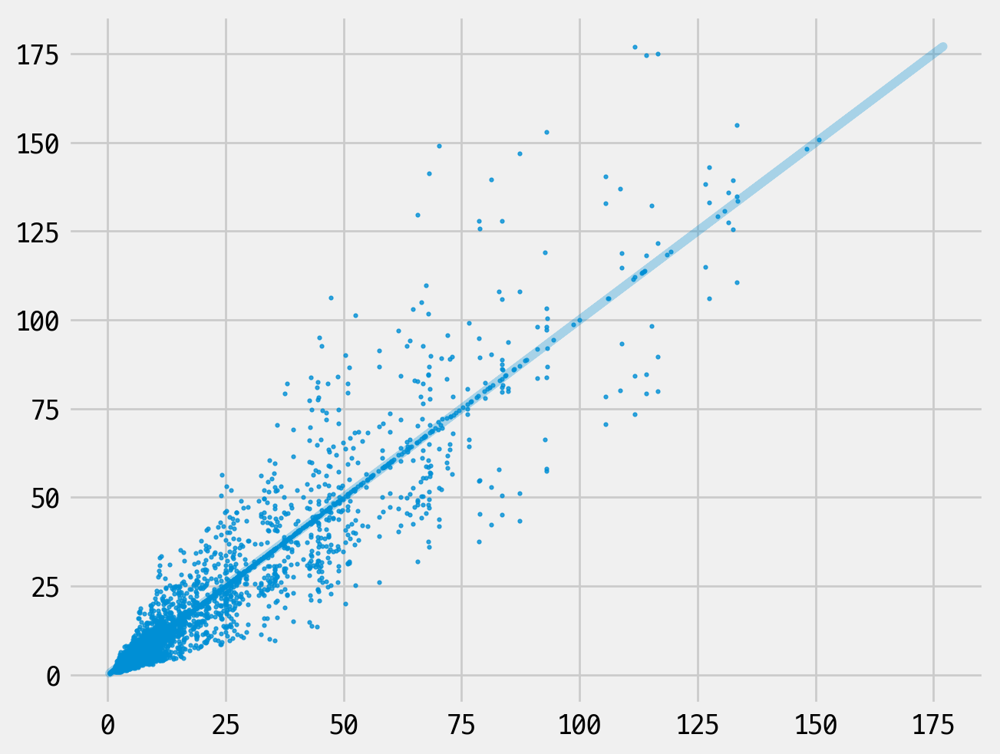

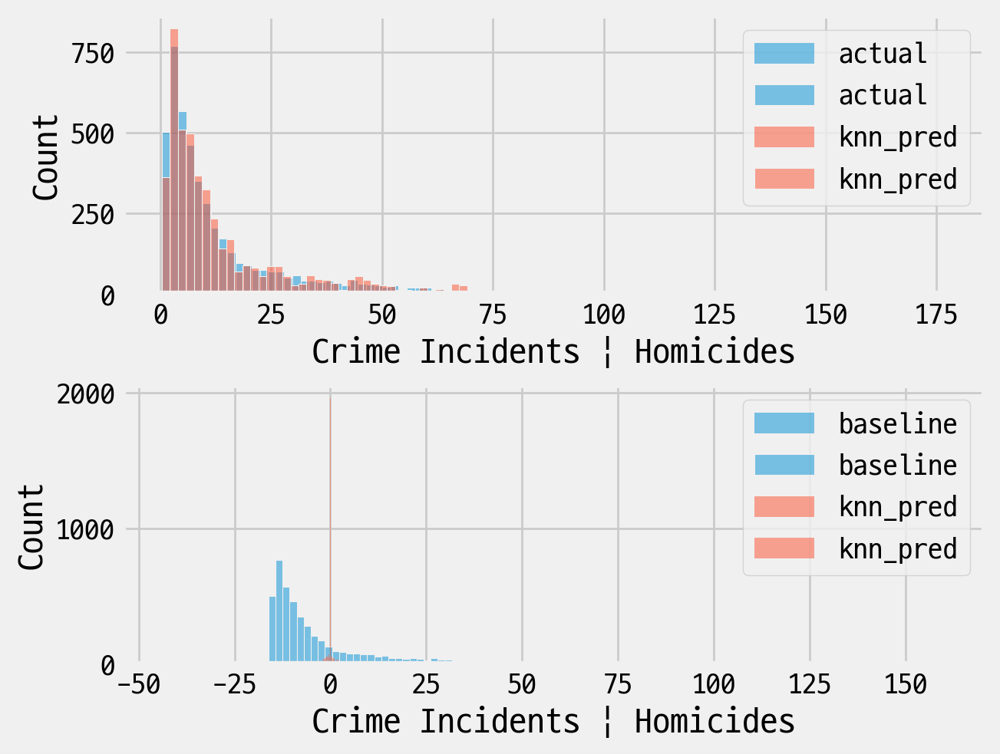

Mean: 16.537192403453798, Std Dev: 21.847010444857077


In [101]:
# test_col의 각 요소에 대해 동일한 작업 수행
for col in test_col:
    print(f"Processing column: {col}")
    
    # 1. city_idx, race_idx, sex_idx 생성
    test_df = pvtb_entire[['geo_label_city', 'date_label', 'strata_race_label', 'strata_sex_label', col]]
    test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x: city_list.index(x))
    test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x: entire_race.index(x))
    test_df['sex_idx'] = test_df['strata_sex_label'].apply(lambda x: entire_sex.index(x))
    
    # 2. 결측치 제거 및 X, y 생성
    test_nonan = test_df.dropna()
    X = test_nonan[['city_idx', 'date_label', 'race_idx', 'sex_idx']]
    y = test_nonan[col]
    
    # 3. KNN 모델 생성
    knn_test = KNeighborsRegressor(n_neighbors=5, weights='distance', metric=vec_metric_cy_weighted, algorithm='auto')
    
    # 4. 모델 학습
    knn_test.fit(X, y)
    
    # 5. 예측 값 생성
    y_pred = knn_test.predict(X)
    
    # 6. 평가 지표 출력
    print("Mean Squared Error (MSE):")
    print(mean_squared_error(y_pred, y))
    print(mean_squared_error([np.mean(y)]*len(y), y))
    print()
    
    print("Mean Absolute Percentage Error (MAPE):")
    print(mean_absolute_percentage_error(y_pred, y))
    print(mean_absolute_percentage_error([np.mean(y)]*len(y), y))
    print()
    
    print("Root Mean Squared Error (RMSE):")
    print(np.sqrt(mean_squared_error(y_pred, y)))
    print(np.sqrt(mean_squared_error([np.mean(y)]*len(y), y)))
    print()
    
    print("Root Mean Squared Log Error (RMSLE):")
    print(np.sqrt(mean_squared_log_error(y_pred, y)))
    print(np.sqrt(mean_squared_log_error([np.mean(y)]*len(y), y)))
    print()
    
    # 7. 예측 값과 실제 값 비교 그래프
    fig, ax = plt.subplots()
    ax.plot(y, y, alpha=0.3)
    ax.scatter(y_pred, y, s=3, alpha=0.8)
    plt.show()
    
    # 8. 히스토그램 비교
    fig, axes = plt.subplots(2, 1)
    sns.histplot(y, label='actual', ax=axes[0], alpha=0.5)
    sns.histplot(y_pred, label='knn_pred', ax=axes[0], alpha=0.5)
    
    sns.histplot(y - np.mean(y), ax=axes[1], label='baseline', alpha=0.5)
    sns.histplot(y - y_pred, ax=axes[1], label='knn_pred', alpha=0.5)
    axes[0].legend()
    axes[1].legend()
    plt.show()
    
    print(f"Mean: {y.mean()}, Std Dev: {y.std()}")

In [141]:
test_nonan[col]

0         3.955670
1         2.598895
2         5.251541
6        10.474347
8        15.810016
           ...    
7270     63.438504
7271     16.574519
7272    118.485673
7273      7.957176
7275     12.826002
Name: Crime Incidents | Homicides, Length: 4740, dtype: float64

## pvtb_city_encoded_ver1 로 변경 , DT모델적용


In [173]:
# CSV 파일 경로
file_path_1 = 'pvtb_city_encoded_ver1.csv'

# CSV 파일 읽기
pvtb_entire_1 = pd.read_csv(file_path_1)

# 데이터프레임의 컬럼 출력
print(pvtb_entire_1.columns.tolist())

['Unnamed: 0', 'geo_label_city', 'encoded_strata_race_label', 'encoded_strata_sex_label', 'encoded_geo_strata_region', 'encoded_geo_strata_poverty', 'encoded_geo_strata_Population', 'encoded_geo_strata_PopDensity', 'encoded_geo_strata_Segregation', 'date_label', 'Active Transportation | Riding Bike to Work', 'Active Transportation | Walking to Work', 'Air Pollution | Hazardous Air Quality', 'Air Pollution | Poor Air Quality', 'Birth Control | Teen Birth Control', 'Births | Low Birthweight', 'Births | Prenatal Care', 'Births | Preterm Births', 'Births | Teen Births', 'Cancer | All Cancer Deaths', 'Cancer | Breast Cancer Deaths', 'Cancer | Colorectal Cancer Deaths', 'Cancer | Lung Cancer Deaths', 'Cancer | Prostate Cancer Deaths', 'Cardiovascular Disease | Cardiovascular Disease Deaths', 'Cardiovascular Disease | Heart Disease Deaths', 'Cardiovascular Disease | High Blood Pressure', 'Crime Incidents | Homicides', 'Crime Incidents | Violent Crime', 'Deaths | Deaths from All Causes', 'Deat

In [174]:
# 고유한 city 값을 리스트로 추출
city_list = pvtb_entire_1['geo_label_city'].unique().tolist()

# city 값을 정수 인덱스로 변환
pvtb_entire_1['city_idx'] = pvtb_entire_1['geo_label_city'].apply(lambda x: city_list.index(x))

In [175]:
# 원핫인코딩 수행
pvtb_encoded_1 = pd.get_dummies(pvtb_entire_1, columns=['encoded_strata_race_label', 'encoded_strata_sex_label'])


In [176]:
# 원핫인코딩 후 생성된 컬럼 확인
print(pvtb_encoded_1.columns)

Index(['Unnamed: 0', 'geo_label_city', 'encoded_geo_strata_region',
       'encoded_geo_strata_poverty', 'encoded_geo_strata_Population',
       'encoded_geo_strata_PopDensity', 'encoded_geo_strata_Segregation',
       'date_label', 'Active Transportation | Riding Bike to Work',
       'Active Transportation | Walking to Work',
       ...
       'city_idx', 'encoded_strata_race_label_0',
       'encoded_strata_race_label_1', 'encoded_strata_race_label_2',
       'encoded_strata_race_label_3', 'encoded_strata_race_label_4',
       'encoded_strata_race_label_5', 'encoded_strata_sex_label_0',
       'encoded_strata_sex_label_1', 'encoded_strata_sex_label_2'],
      dtype='object', length=136)


In [183]:
# 특징 변수와 타겟 변수 분리
X = pvtb_encoded_1.drop(columns=['geo_label_city','date_label','encoded_strata_race_label_0', 'encoded_strata_race_label_1',
       'encoded_strata_race_label_2', 'encoded_strata_race_label_3',
       'encoded_strata_race_label_4', 'encoded_strata_race_label_5',
       'encoded_strata_sex_label_0', 'encoded_strata_sex_label_1',
       'encoded_strata_sex_label_2']) 
y = pvtb_encoded_1['Deaths | Deaths from All Causes']  

# 결측치 제거
X = X.fillna(0)
y = y.fillna(0)

In [184]:
pvtb_encoded_1['Deaths | Deaths from All Causes']  

0       688.409886
1       587.977647
2       829.423526
3       392.403955
4       304.999747
           ...    
7275    666.886799
7276           NaN
7277    418.624572
7278           NaN
7279           NaN
Name: Deaths | Deaths from All Causes, Length: 7280, dtype: float64

Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 1.6272634416660294

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0006648980368155957

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 1.2756423643270982

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.002728988971035515



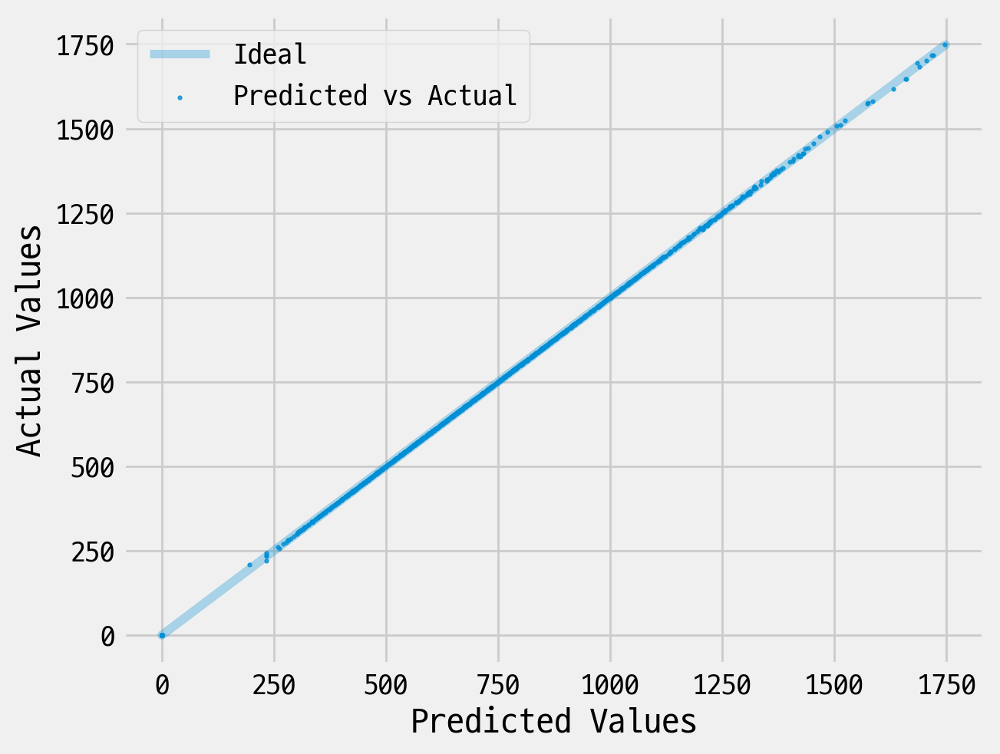

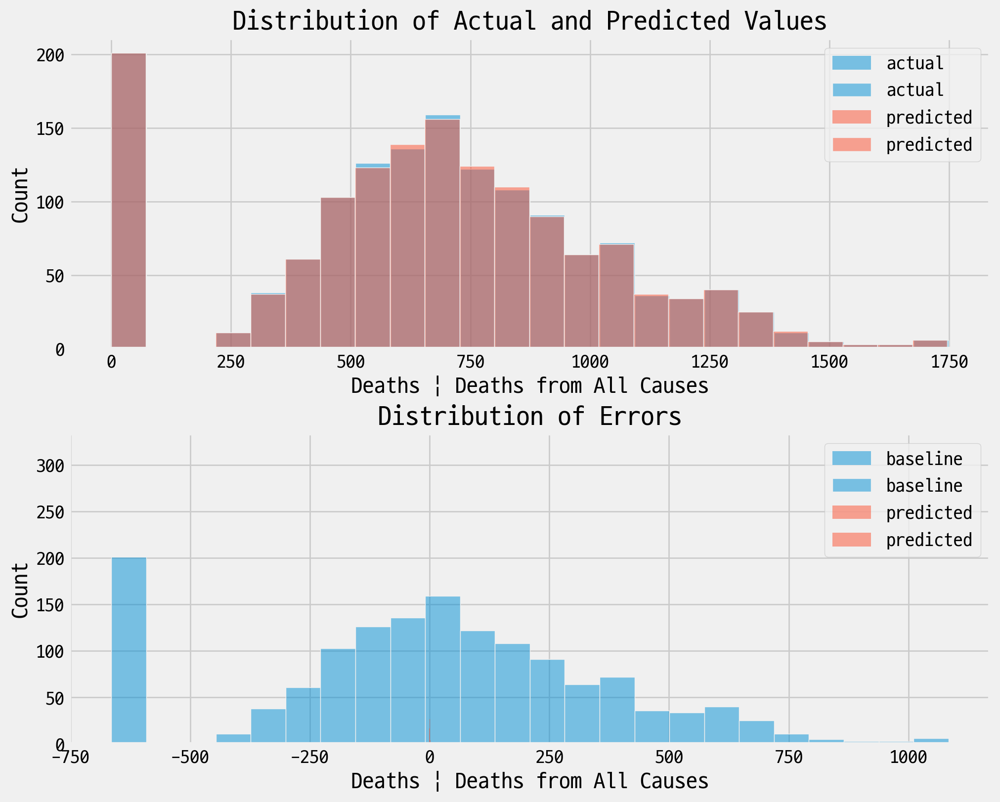

In [189]:
# 학습 데이터와 테스트 데이터로 분리
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 결정 트리 모델 생성 및 학습
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

# 예측 수행
y_pred_train = dt_model.predict(X_train)
y_pred_test = dt_model.predict(X_test)

# 평가 지표 계산 및 출력
print("Train Mean Squared Error (MSE):", mean_squared_error(y_train, y_pred_train))
print("Test Mean Squared Error (MSE):", mean_squared_error(y_test, y_pred_test))
print()

print("Train Mean Absolute Percentage Error (MAPE):", mean_absolute_percentage_error(y_train, y_pred_train))
print("Test Mean Absolute Percentage Error (MAPE):", mean_absolute_percentage_error(y_test, y_pred_test))
print()

print("Train Root Mean Squared Error (RMSE):", np.sqrt(mean_squared_error(y_train, y_pred_train)))
print("Test Root Mean Squared Error (RMSE):", np.sqrt(mean_squared_error(y_test, y_pred_test)))
print()

print("Train Root Mean Squared Log Error (RMSLE):", np.sqrt(mean_squared_log_error(y_train, y_pred_train)))
print("Test Root Mean Squared Log Error (RMSLE):", np.sqrt(mean_squared_log_error(y_test, y_pred_test)))
print()

# 예측 값과 실제 값을 비교하는 산점도 및 대각선 그래프
fig, ax = plt.subplots()
ax.plot(y_test, y_test, alpha=0.3, label='Ideal')  # 대각선 그래프 (y = y)
ax.scatter(y_pred_test, y_test, s=3, alpha=0.8, label='Predicted vs Actual')  # 실제 값 대 예측 값 산점도
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values')
ax.legend()
plt.show()

# 히스토그램 비교
fig, axes = plt.subplots(2, 1, figsize=(10, 8))  # 그래프 크기 조정 (옵션)

# 첫 번째 서브플롯: 실제 값과 예측 값의 히스토그램
sns.histplot(y_test, label='actual', ax=axes[0], alpha=0.5)
sns.histplot(y_pred_test, label='predicted', ax=axes[0], alpha=0.5)
axes[0].set_title('Distribution of Actual and Predicted Values')
axes[0].legend()

# 두 번째 서브플롯: 기준선과 예측 오차의 히스토그램
sns.histplot(y_test - np.mean(y_test), ax=axes[1], label='baseline', alpha=0.5)
sns.histplot(y_test - y_pred_test, ax=axes[1], label='predicted', alpha=0.5)
axes[1].set_title('Distribution of Errors')
axes[1].legend()

plt.tight_layout()
plt.show()

In [186]:
test_col_1 = [
    'Deaths | Premature Death',                                  
    'Deaths | Injury Deaths',                                    
    'Cancer | All Cancer Deaths',                                
    'Cardiovascular Disease | Cardiovascular Disease Deaths',    
    'Deaths | Deaths from All Causes',                           
    'Substance Use | Drug Overdose Deaths',                      
    'Cardiovascular Disease | Heart Disease Deaths',             
    'Diabetes and Obesity | Diabetes Deaths',                    
    'Cancer | Lung Cancer Deaths',                               
    'Life Expectancy at Birth | Life Expectancy',                
    'Mental Health | Suicide',                                   
    'Deaths | Motor Vehicle Deaths',                             
    'Deaths | Gun Deaths (Firearms)',                            
    'Respiratory Infection | Pneumonia or Influenza Deaths',     
    'Substance Use | Opioid Overdose Deaths',                    
    'Cancer | Colorectal Cancer Deaths',                         
    'Crime Incidents | Homicides',                               
]

In [190]:
test_col_1

['Deaths | Premature Death',
 'Deaths | Injury Deaths',
 'Cancer | All Cancer Deaths',
 'Cardiovascular Disease | Cardiovascular Disease Deaths',
 'Deaths | Deaths from All Causes',
 'Substance Use | Drug Overdose Deaths',
 'Cardiovascular Disease | Heart Disease Deaths',
 'Diabetes and Obesity | Diabetes Deaths',
 'Cancer | Lung Cancer Deaths',
 'Life Expectancy at Birth | Life Expectancy',
 'Mental Health | Suicide',
 'Deaths | Motor Vehicle Deaths',
 'Deaths | Gun Deaths (Firearms)',
 'Respiratory Infection | Pneumonia or Influenza Deaths',
 'Substance Use | Opioid Overdose Deaths',
 'Cancer | Colorectal Cancer Deaths',
 'Crime Incidents | Homicides']

Processing: Deaths | Premature Death
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 1175.36320376591

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0010306556221539626

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 34.283570464085415

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0053568245647574375



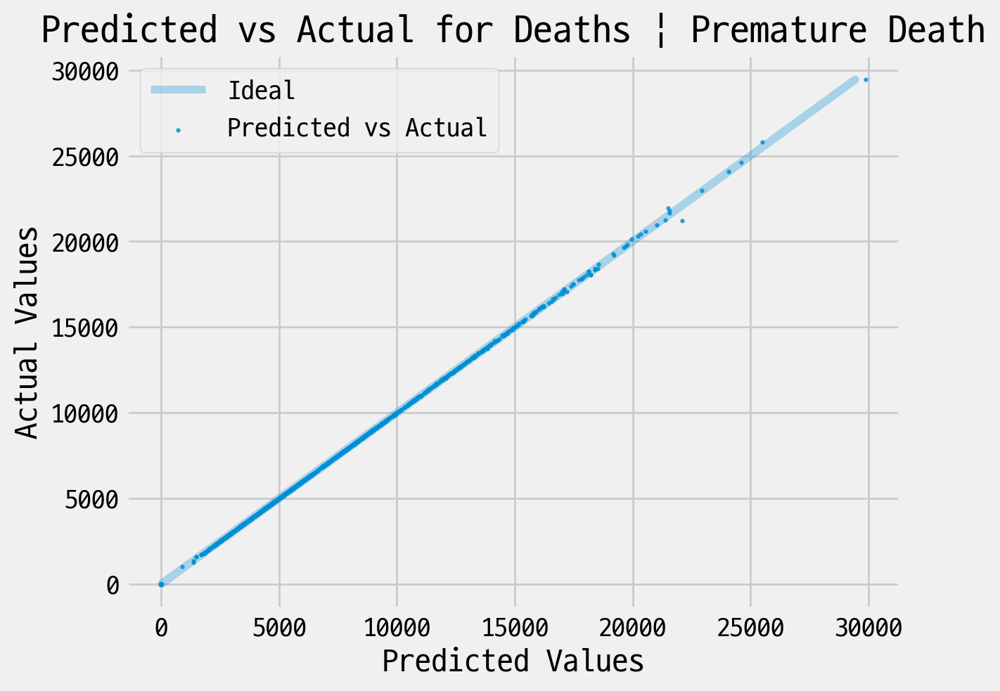

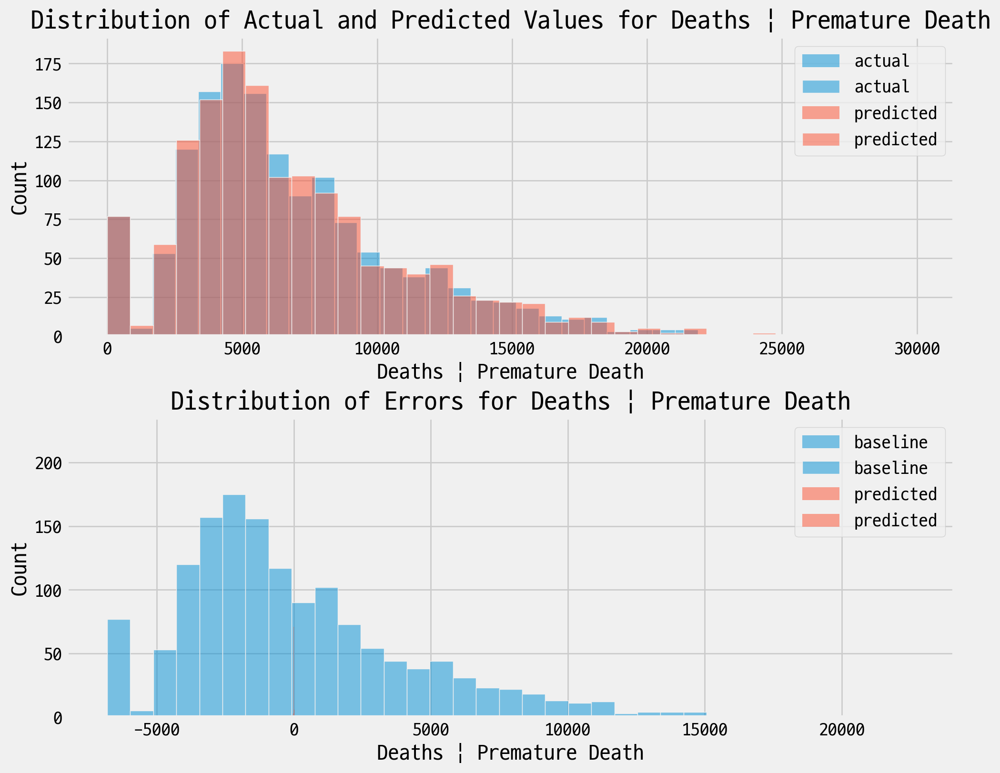

Processing: Deaths | Injury Deaths
Train Mean Squared Error (MSE): 1.2362637944385454e-18
Test Mean Squared Error (MSE): 6.797488125351182

Train Mean Absolute Percentage Error (MAPE): 4.936143373825395e-13
Test Mean Absolute Percentage Error (MAPE): 0.0012211820621959924

Train Root Mean Squared Error (RMSE): 1.1118740011523542e-09
Test Root Mean Squared Error (RMSE): 2.6071992876171133

Train Root Mean Squared Log Error (RMSLE): 2.601368326945199e-11
Test Root Mean Squared Log Error (RMSLE): 0.005502698902004686



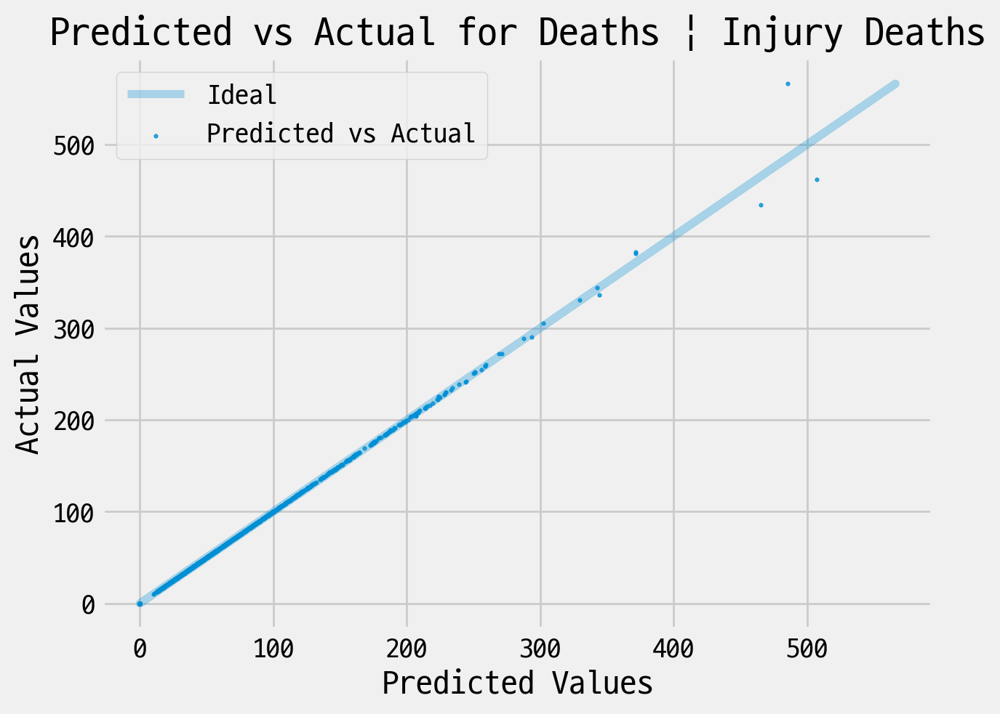

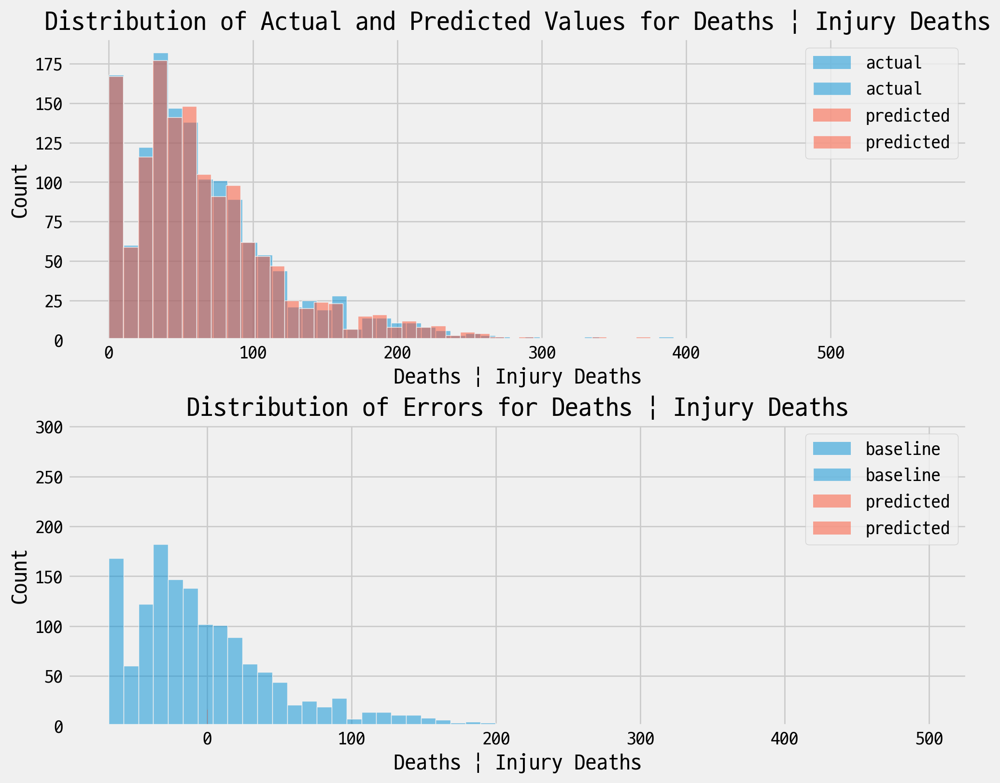

Processing: Cancer | All Cancer Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.08973625964475689

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0006733001920589973

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.2995601102362544

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.004376508087008511



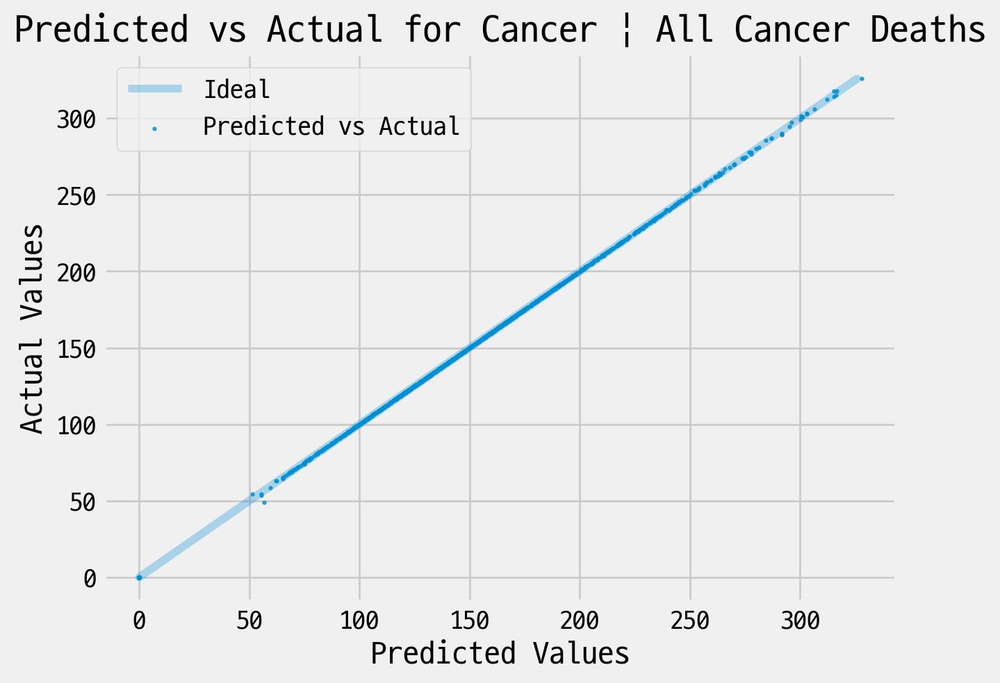

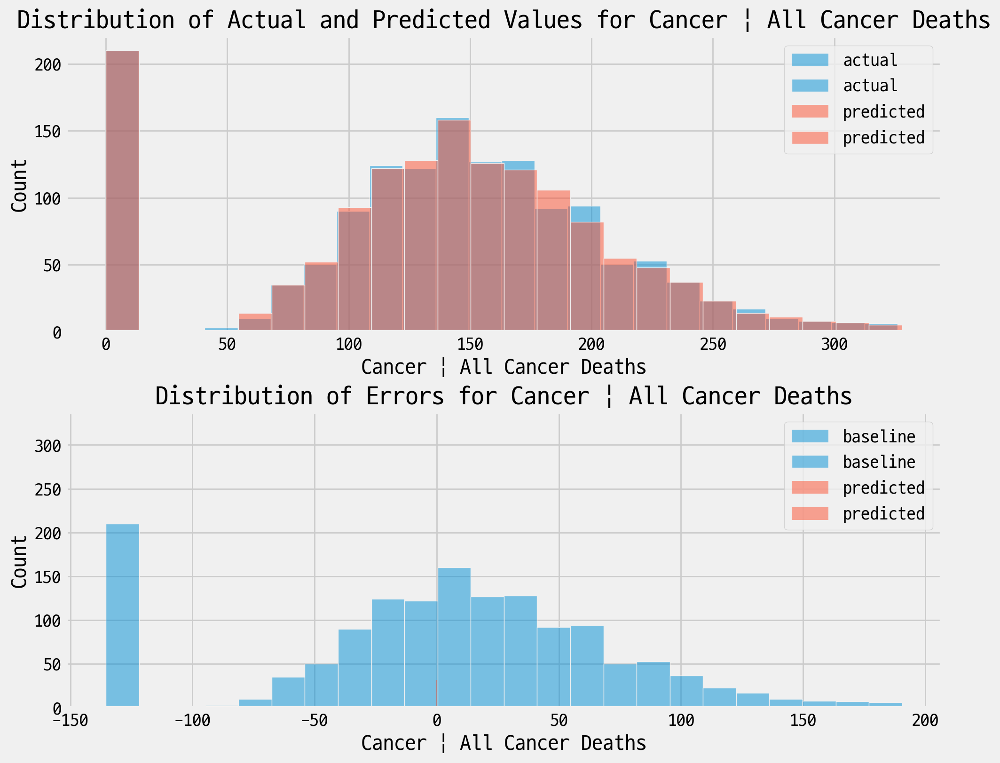

Processing: Cardiovascular Disease | Cardiovascular Disease Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.0986237086415951

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.000587155597545628

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.31404411894126455

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0017222694120056998



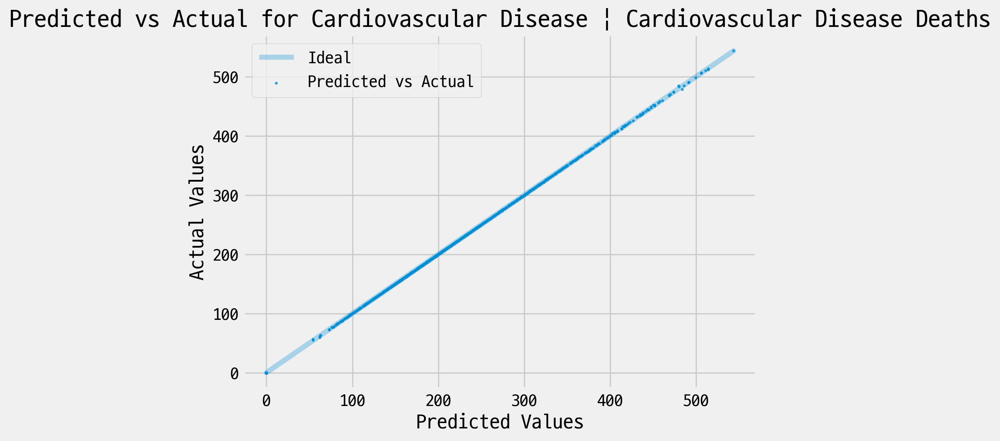

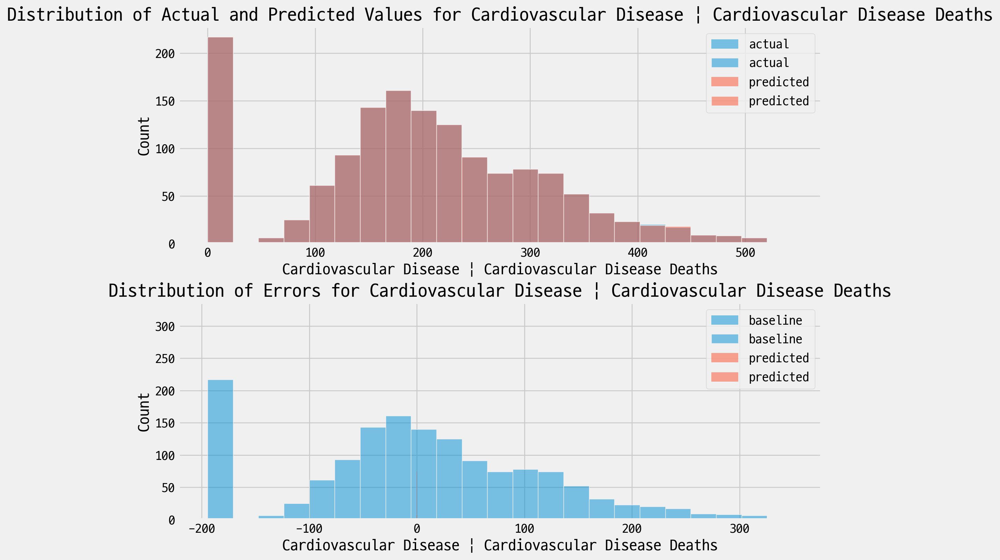

Processing: Deaths | Deaths from All Causes
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 1.6272634416660294

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0006648980368155957

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 1.2756423643270982

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.002728988971035515



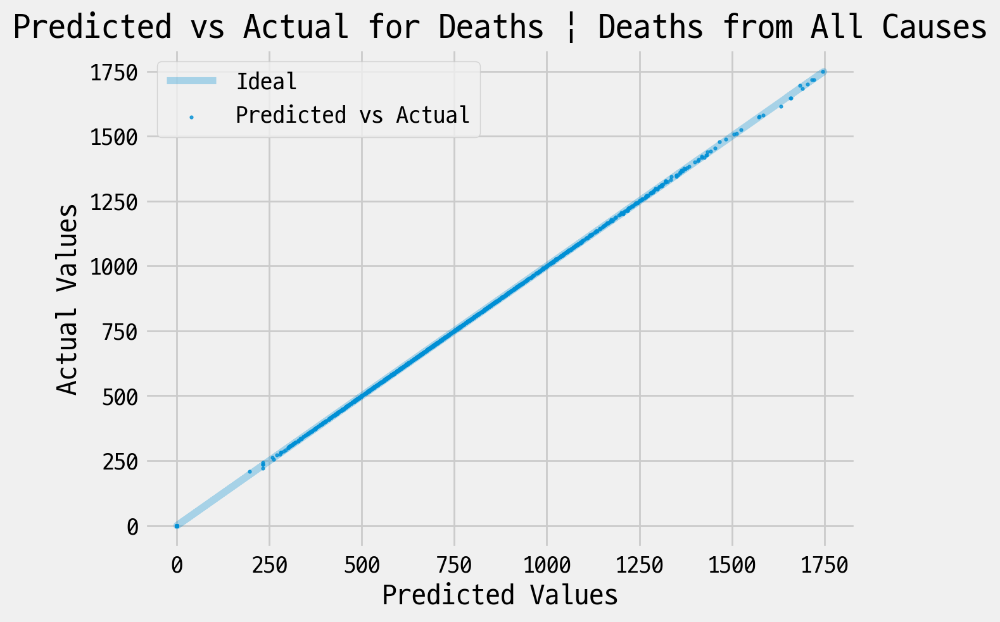

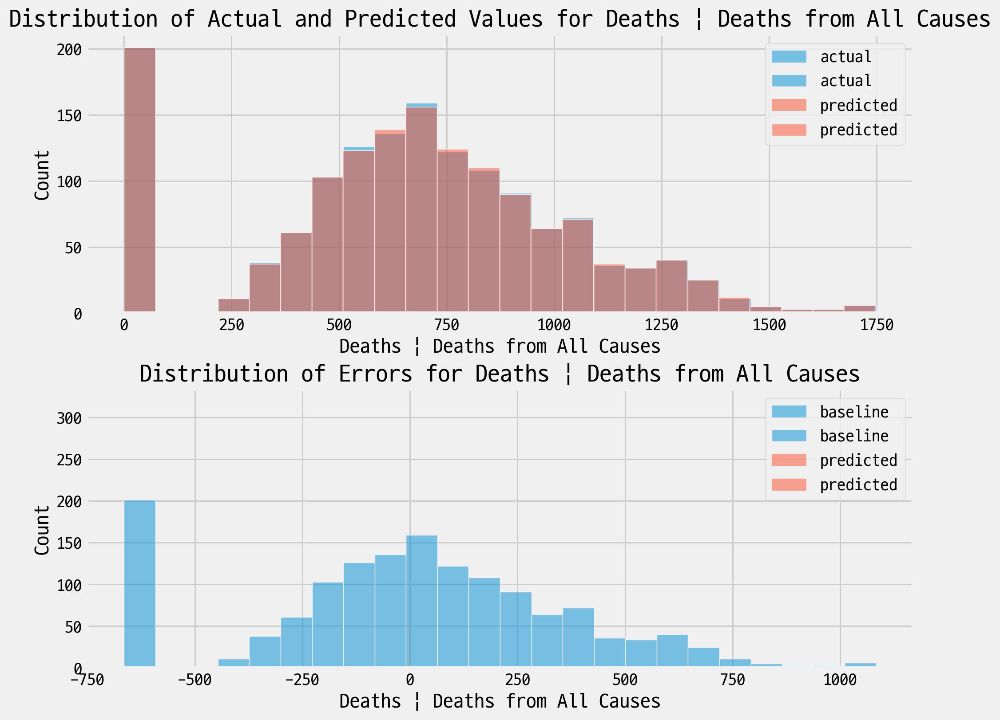

Processing: Substance Use | Drug Overdose Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 4.915814591691546

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0017640978052948758

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 2.217163636651915

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.008457893955163592



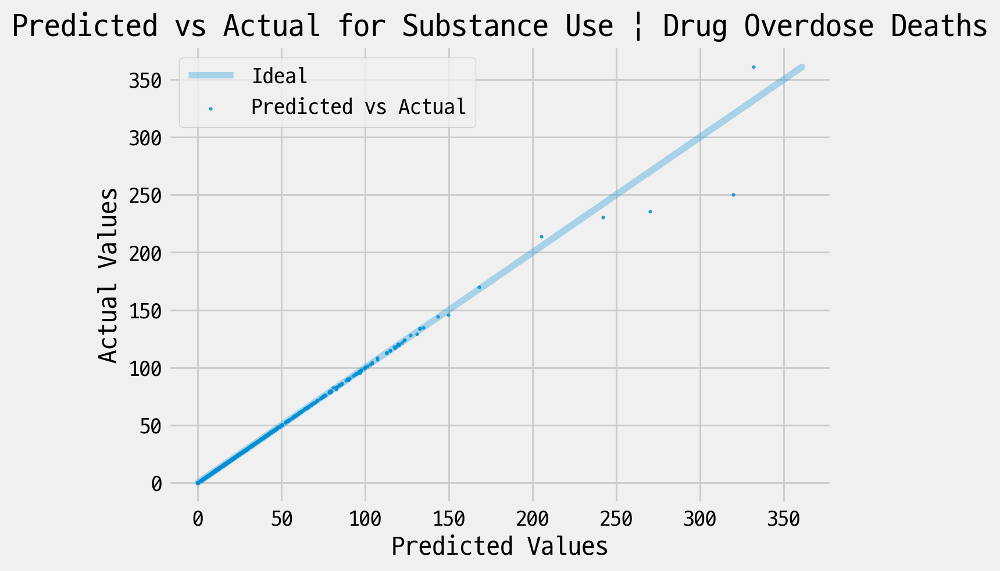

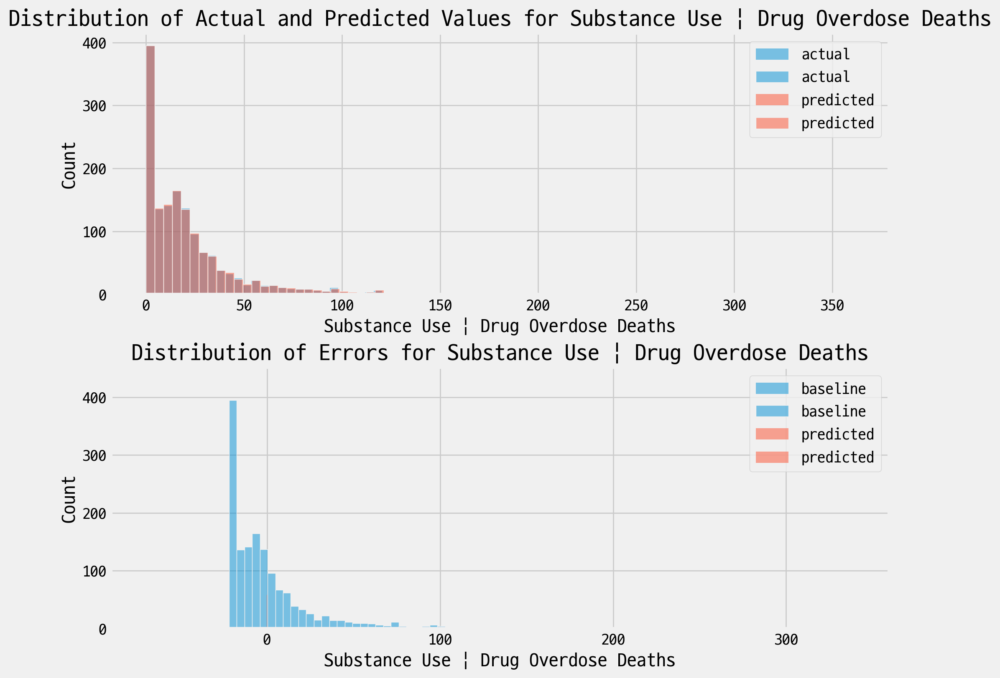

Processing: Cardiovascular Disease | Heart Disease Deaths
Train Mean Squared Error (MSE): 8.077781533682926e-15
Test Mean Squared Error (MSE): 0.09386105556910093

Train Mean Absolute Percentage Error (MAPE): 6.429447060063736e-12
Test Mean Absolute Percentage Error (MAPE): 0.000798245202700411

Train Root Mean Squared Error (RMSE): 8.987647931290435e-08
Test Root Mean Squared Error (RMSE): 0.30636751715725496

Train Root Mean Squared Log Error (RMSLE): 3.4561773532397483e-10
Test Root Mean Squared Log Error (RMSLE): 0.0032621839780741695



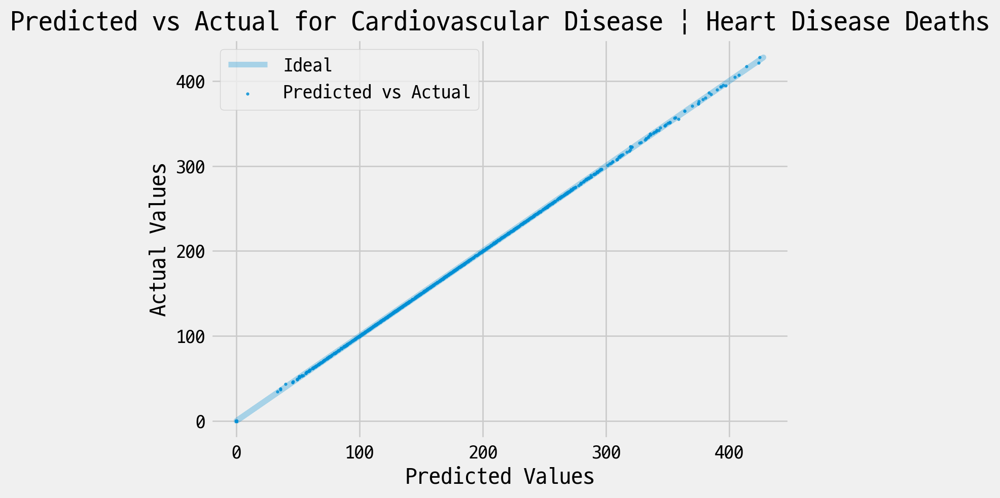

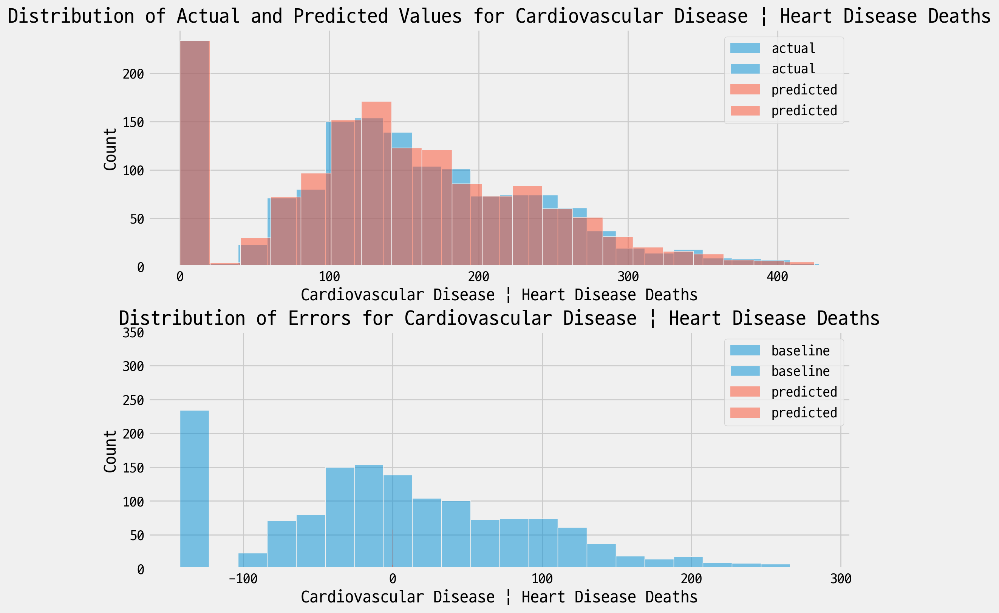

Processing: Diabetes and Obesity | Diabetes Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.006898565294230874

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0009427480923522594

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.08305760226632403

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0048967359263157985



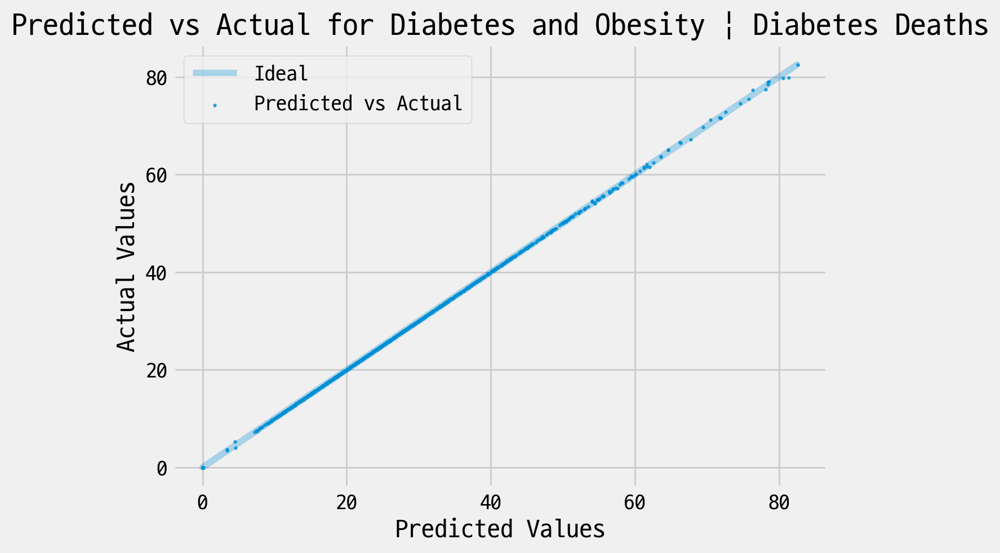

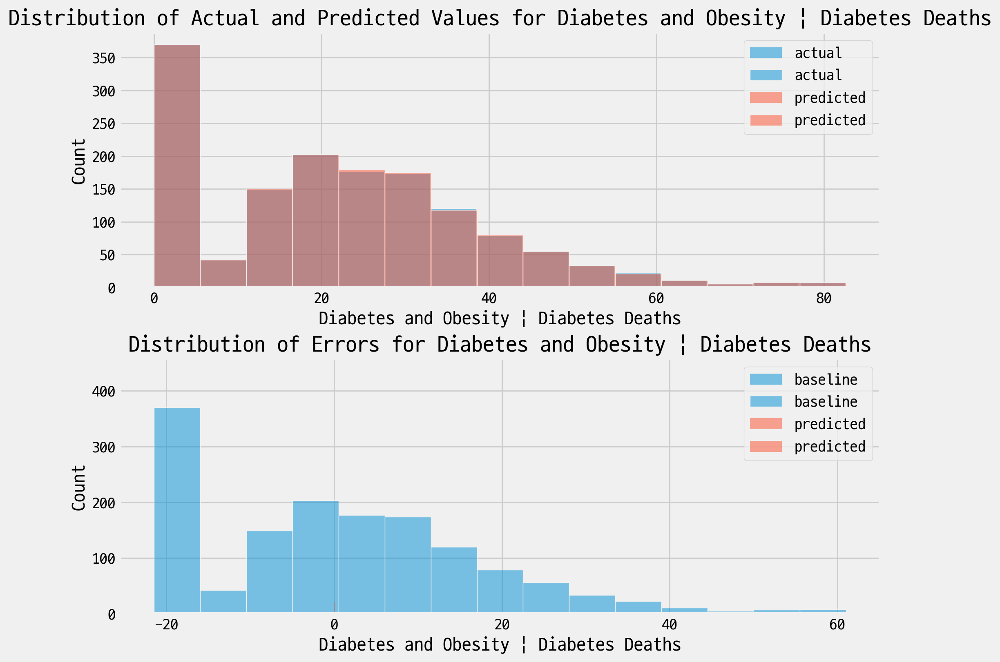

Processing: Cancer | Lung Cancer Deaths
Train Mean Squared Error (MSE): 7.22012375974303e-18
Test Mean Squared Error (MSE): 0.008226519767094372

Train Mean Absolute Percentage Error (MAPE): 1.913237179179009e-12
Test Mean Absolute Percentage Error (MAPE): 0.0007651916772210368

Train Root Mean Squared Error (RMSE): 2.6870287977137555e-09
Test Root Mean Squared Error (RMSE): 0.09070016409629242

Train Root Mean Squared Log Error (RMSLE): 9.94237555336844e-11
Test Root Mean Squared Log Error (RMSLE): 0.002005624436918527



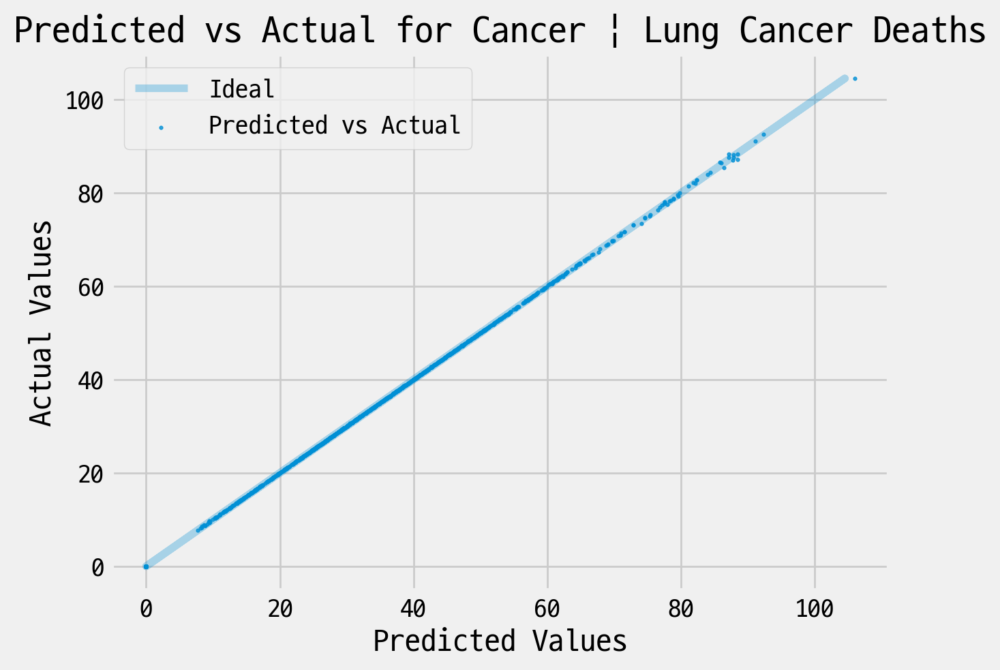

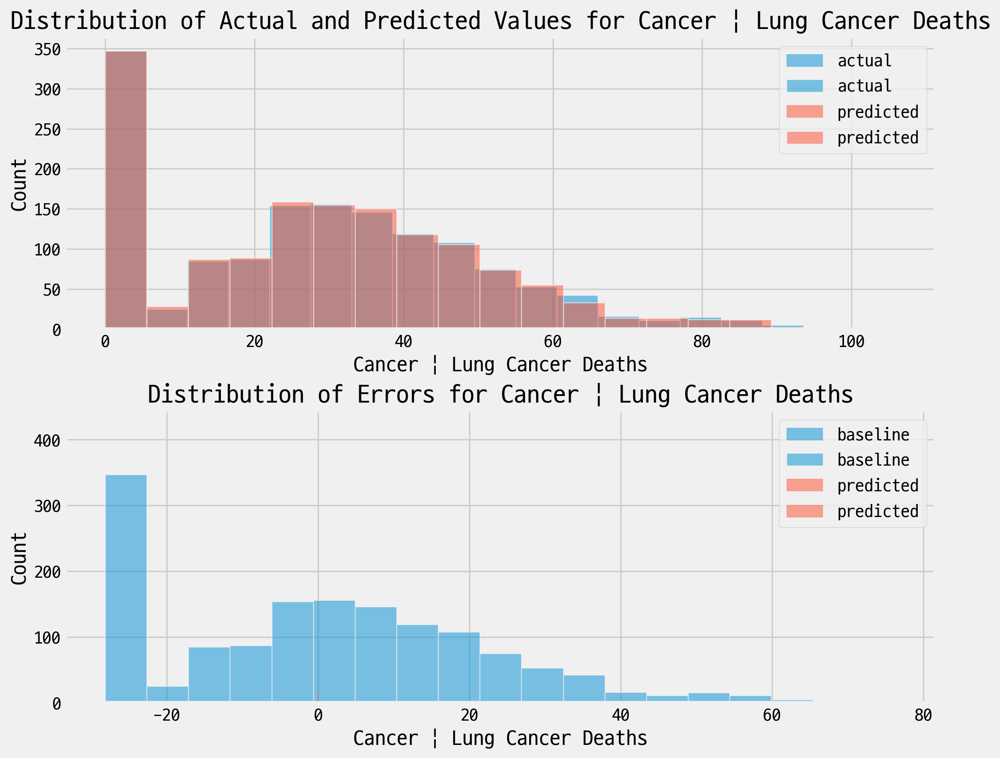

Processing: Life Expectancy at Birth | Life Expectancy
Train Mean Squared Error (MSE): 2.9259958814068545e-16
Test Mean Squared Error (MSE): 0.00028164764569041297

Train Mean Absolute Percentage Error (MAPE): 5.844130547077397e-12
Test Mean Absolute Percentage Error (MAPE): 9.547817982381852e-05

Train Root Mean Squared Error (RMSE): 1.710554261462306e-08
Test Root Mean Squared Error (RMSE): 0.016782361147657767

Train Root Mean Squared Log Error (RMSLE): 2.2292753182861244e-10
Test Root Mean Squared Log Error (RMSLE): 0.00021611051740695654



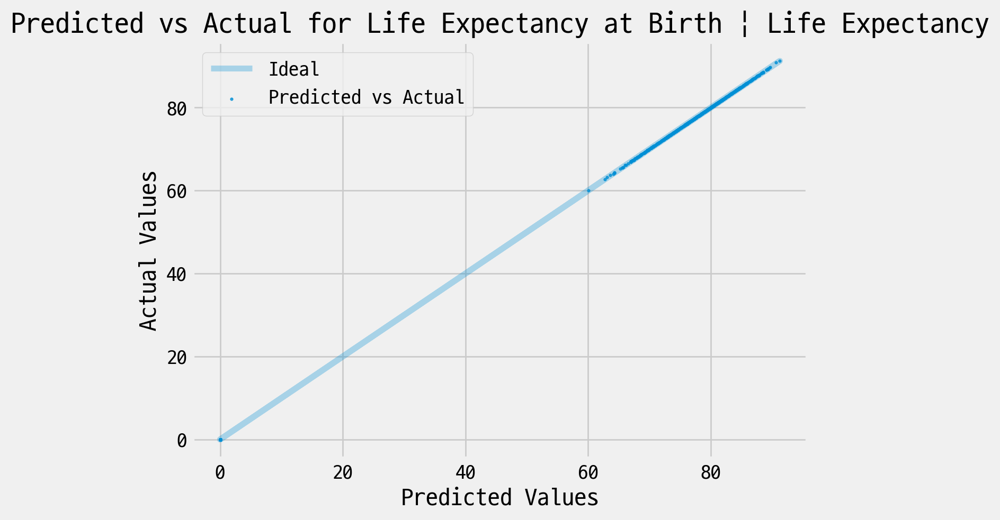

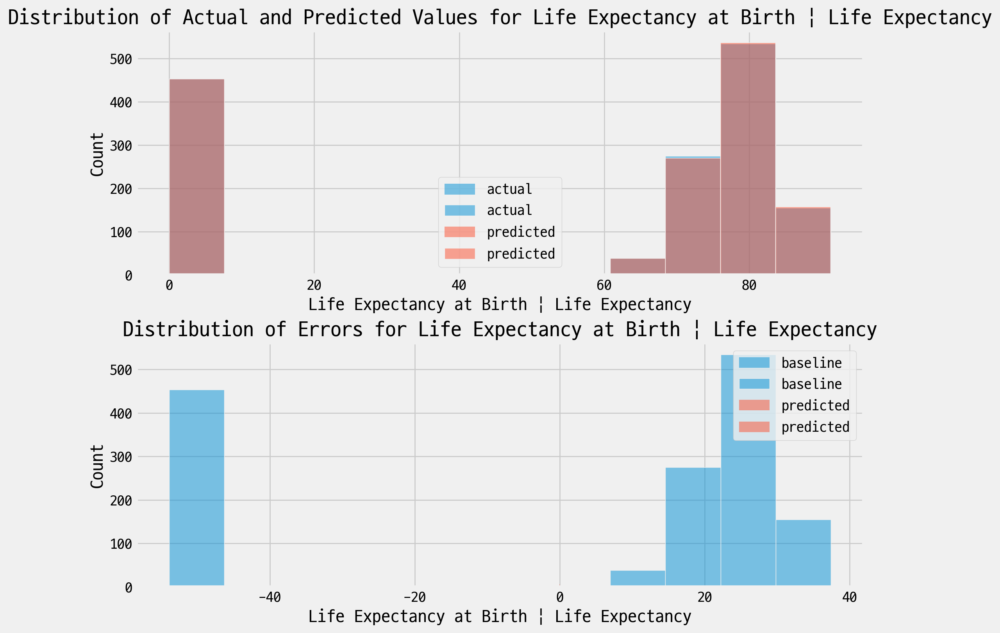

Processing: Mental Health | Suicide
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.008789975461239387

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.001111621495841599

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.09375486900017187

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0027903728137136847



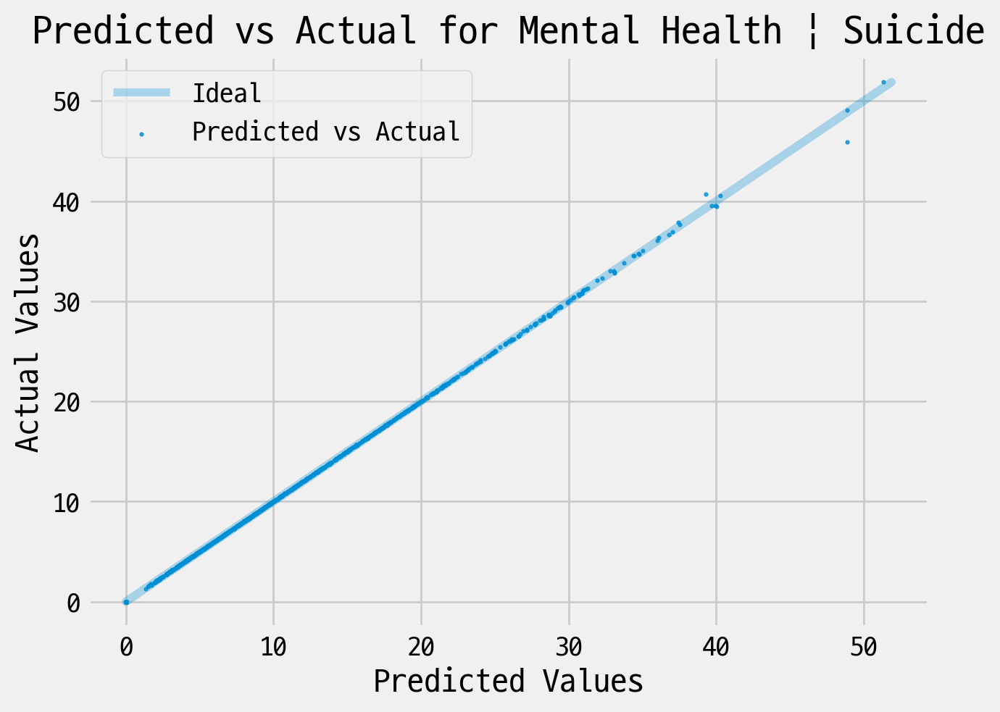

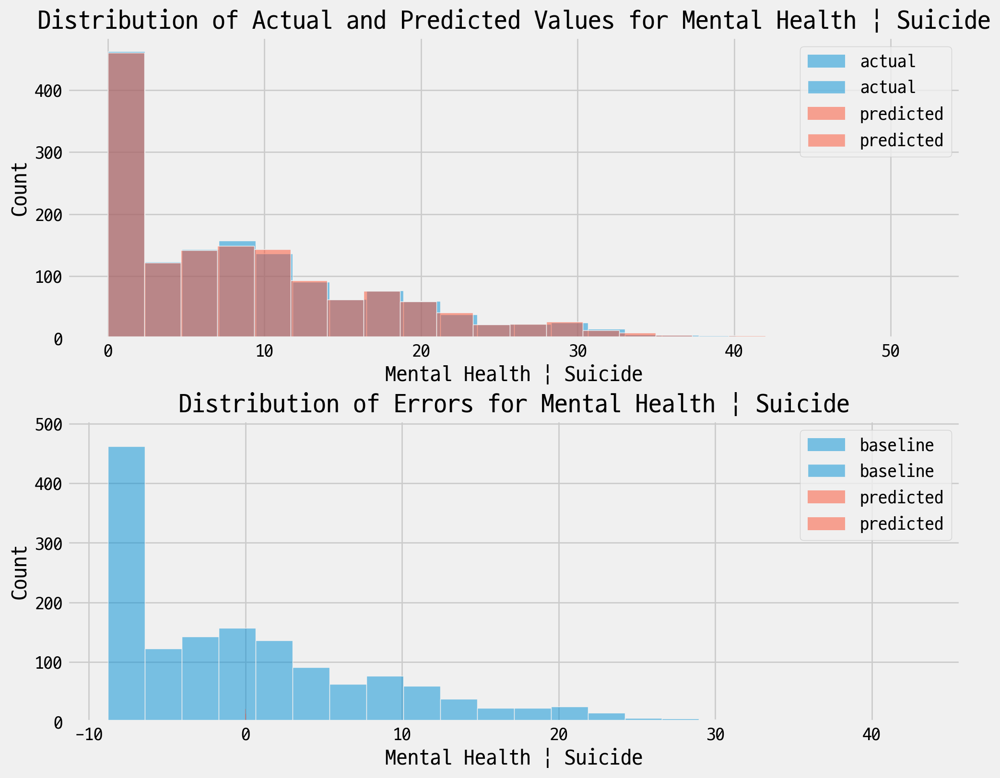

Processing: Deaths | Motor Vehicle Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.018092550006259058

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.001248002798523853

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.13450854993738895

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0037753504222621348



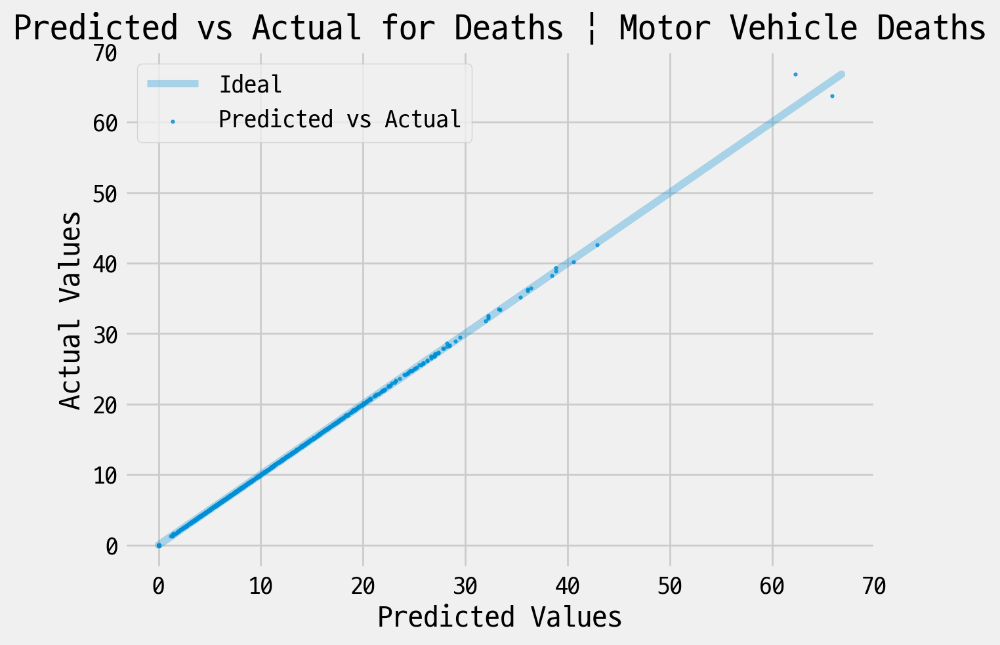

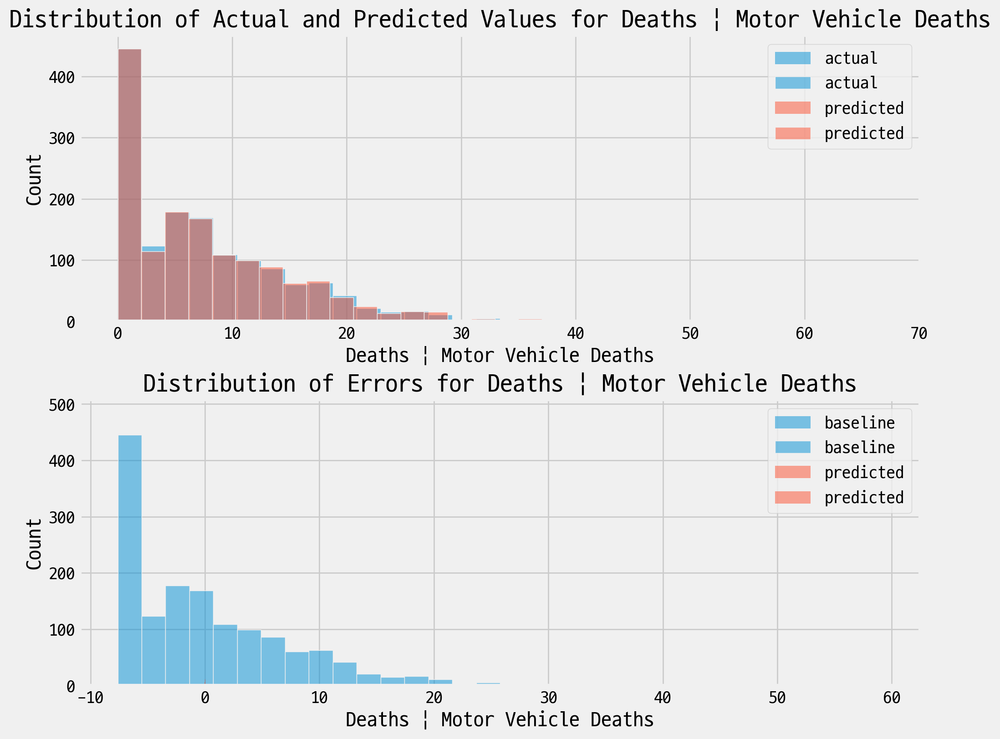

Processing: Deaths | Gun Deaths (Firearms)
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.07758575628559643

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0019311807678495368

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.27854219839298394

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0034442239645488446



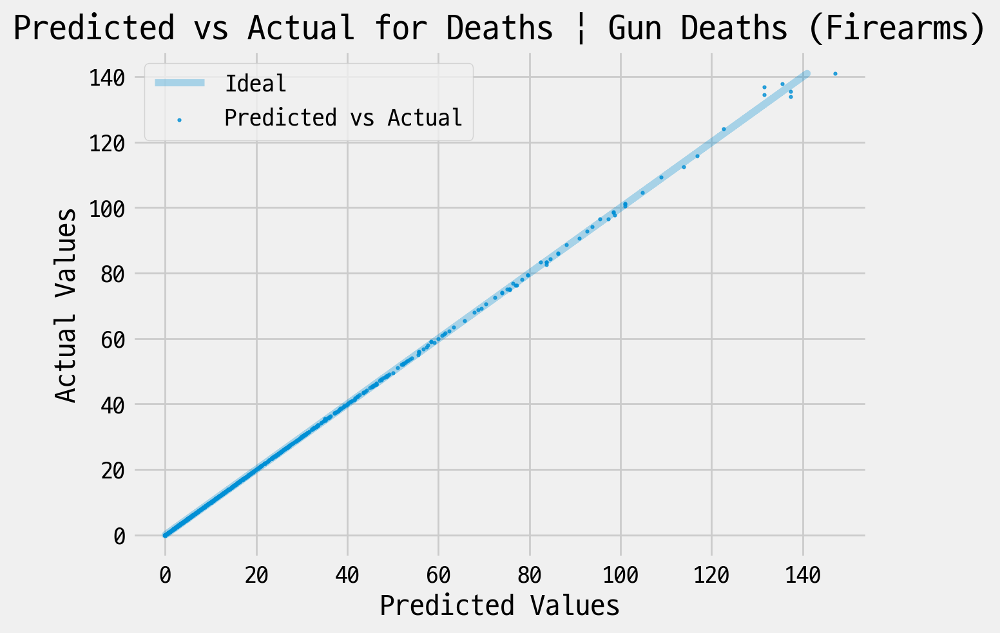

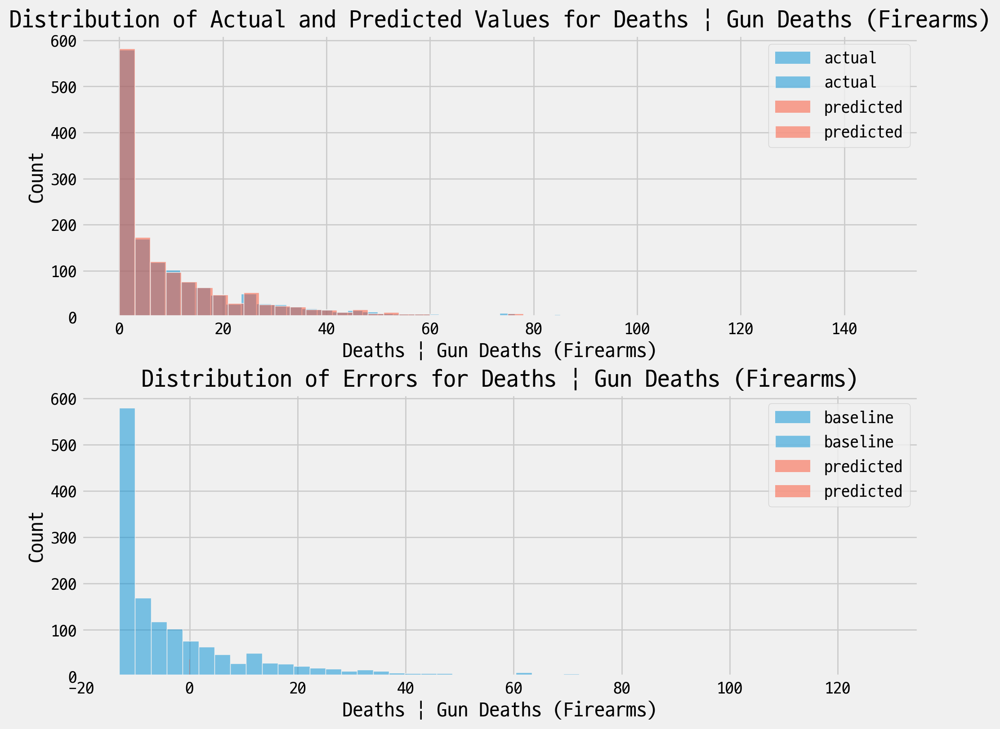

Processing: Respiratory Infection | Pneumonia or Influenza Deaths
Train Mean Squared Error (MSE): 9.349244442181026e-18
Test Mean Squared Error (MSE): 0.0037126010397875455

Train Mean Absolute Percentage Error (MAPE): 5.2979986524316875e-12
Test Mean Absolute Percentage Error (MAPE): 0.0007002140155046696

Train Root Mean Squared Error (RMSE): 3.057653420873763e-09
Test Root Mean Squared Error (RMSE): 0.06093111717166809

Train Root Mean Squared Log Error (RMSLE): 2.6144966342463253e-10
Test Root Mean Squared Log Error (RMSLE): 0.0024155630796670676



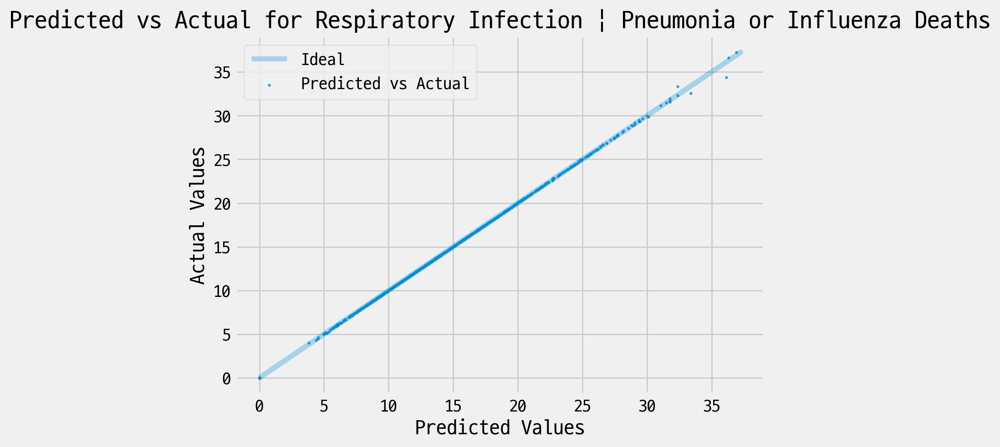

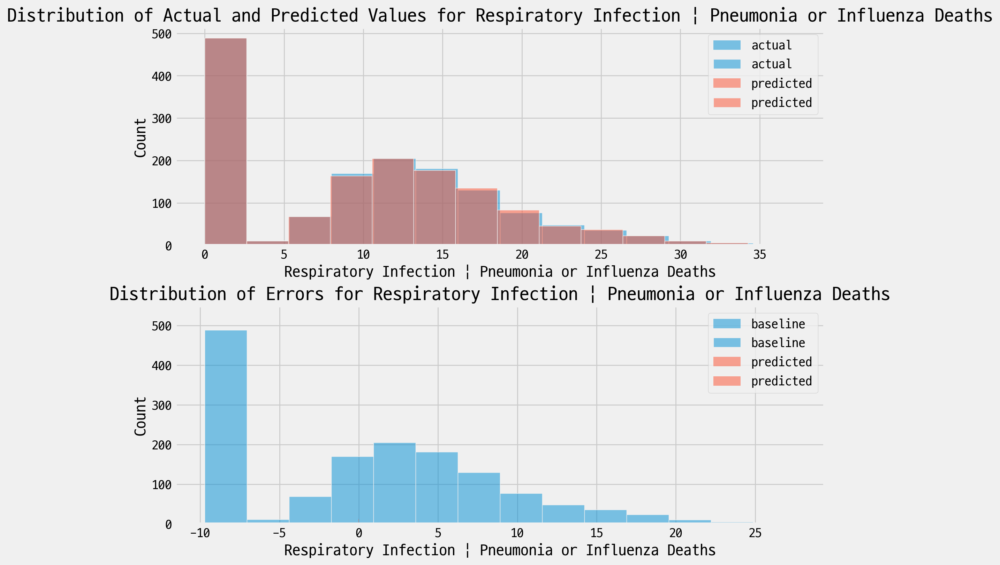

Processing: Substance Use | Opioid Overdose Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.45154658880470067

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0015297121107418893

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.6719721637126799

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.003642963956211237



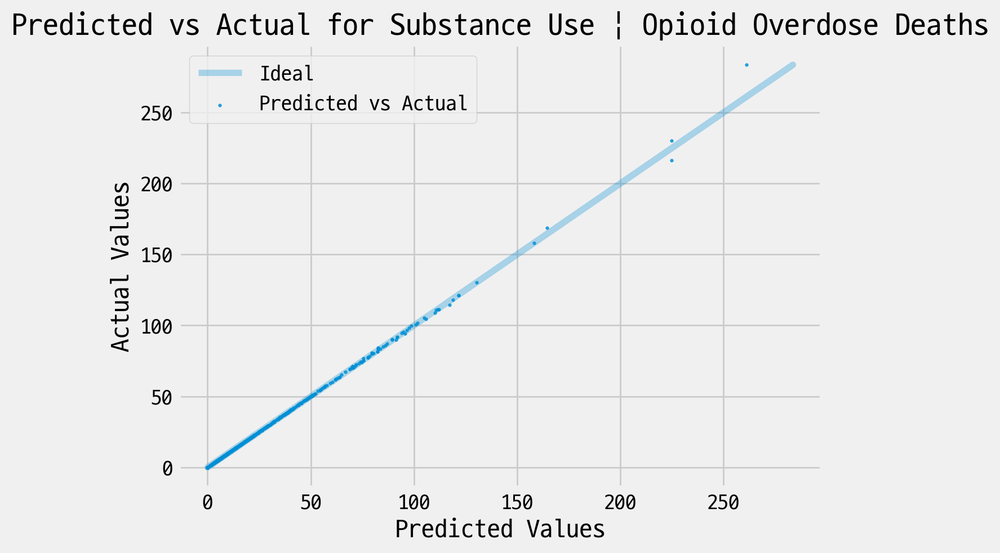

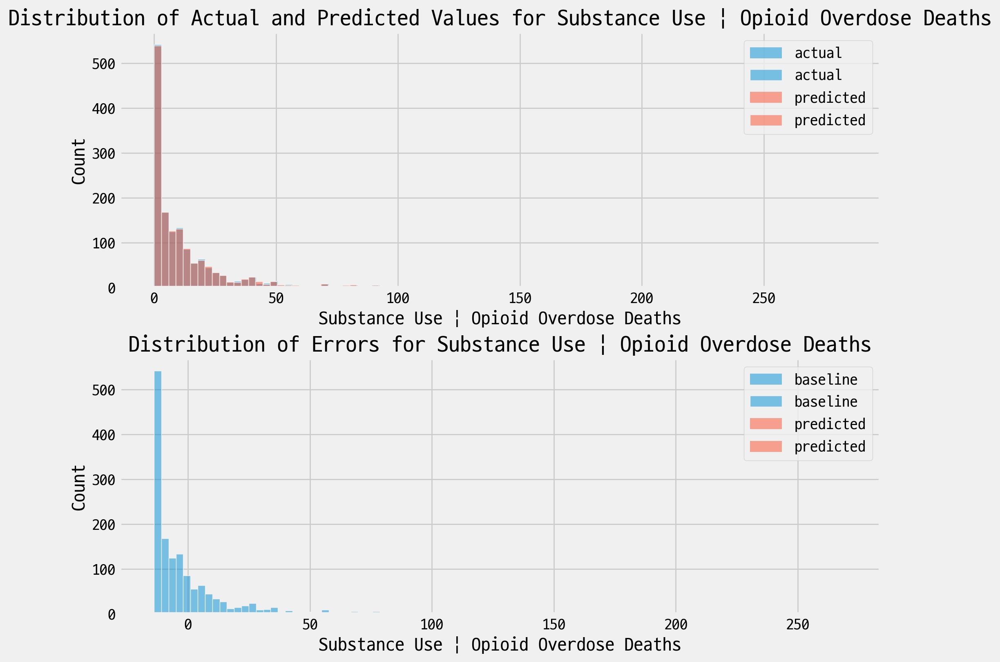

Processing: Cancer | Colorectal Cancer Deaths
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.0007610288685629779

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0005209617191995232

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.027586751685600427

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0012651143737454711



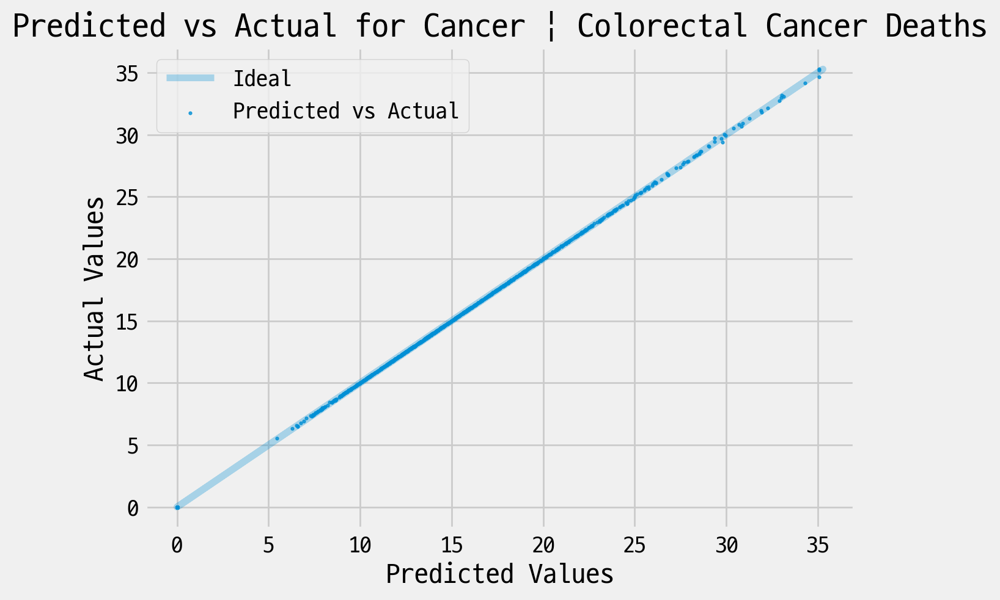

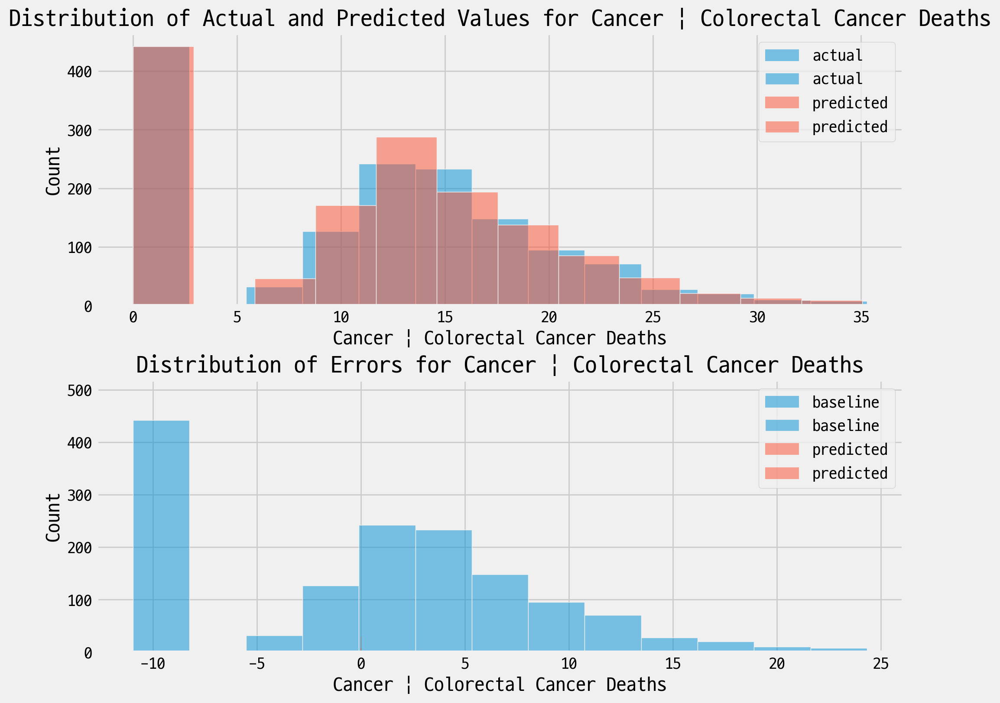

Processing: Crime Incidents | Homicides
Train Mean Squared Error (MSE): 0.0
Test Mean Squared Error (MSE): 0.07615788105591868

Train Mean Absolute Percentage Error (MAPE): 0.0
Test Mean Absolute Percentage Error (MAPE): 0.0015139553161021776

Train Root Mean Squared Error (RMSE): 0.0
Test Root Mean Squared Error (RMSE): 0.27596717387384806

Train Root Mean Squared Log Error (RMSLE): 0.0
Test Root Mean Squared Log Error (RMSLE): 0.0030458568423788615



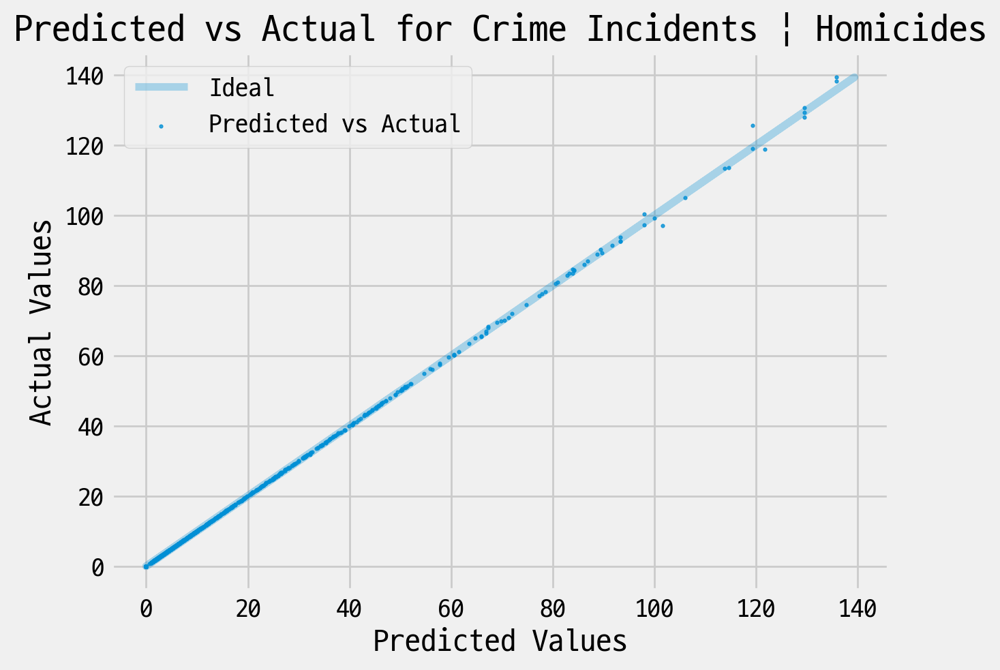

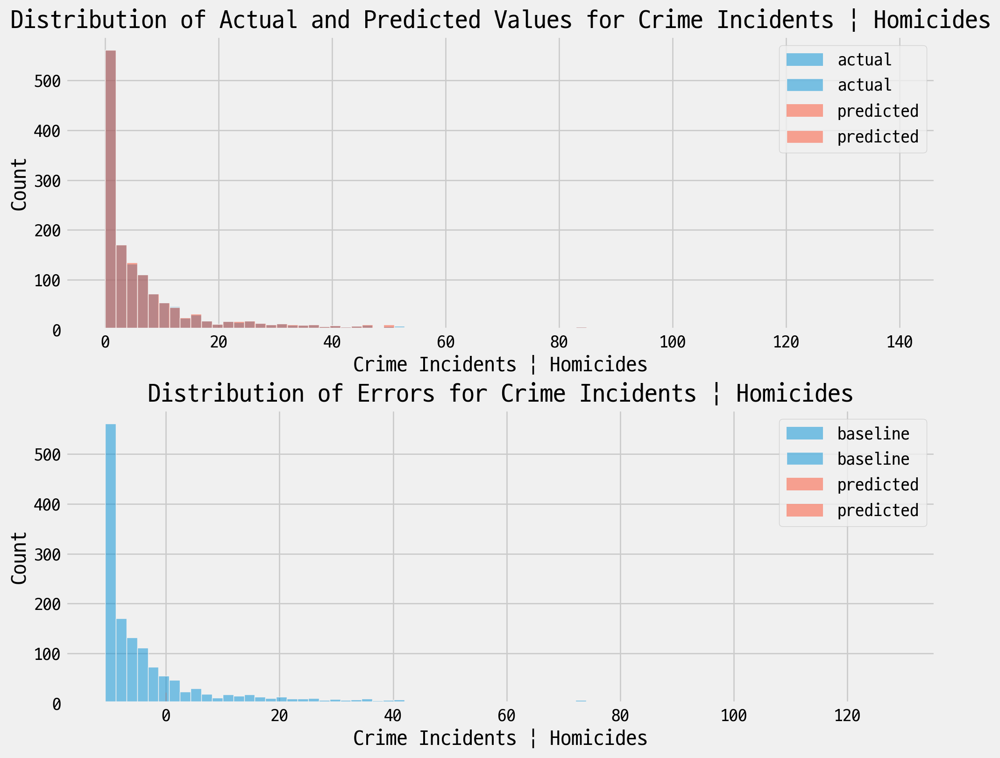

In [191]:
test_col_1 = [
    'Deaths | Premature Death',                                  
    'Deaths | Injury Deaths',                                    
    'Cancer | All Cancer Deaths',                                
    'Cardiovascular Disease | Cardiovascular Disease Deaths',    
    'Deaths | Deaths from All Causes',                           
    'Substance Use | Drug Overdose Deaths',                      
    'Cardiovascular Disease | Heart Disease Deaths',             
    'Diabetes and Obesity | Diabetes Deaths',                    
    'Cancer | Lung Cancer Deaths',                               
    'Life Expectancy at Birth | Life Expectancy',                
    'Mental Health | Suicide',                                   
    'Deaths | Motor Vehicle Deaths',                             
    'Deaths | Gun Deaths (Firearms)',                            
    'Respiratory Infection | Pneumonia or Influenza Deaths',     
    'Substance Use | Opioid Overdose Deaths',                    
    'Cancer | Colorectal Cancer Deaths',                         
    'Crime Incidents | Homicides',                               
]

results = []

for target_column in test_col_1:
    print(f"Processing: {target_column}")
    
    # 특징 변수와 타겟 변수 분리
    X = pvtb_encoded_1.drop(columns=['geo_label_city','date_label','encoded_strata_race_label_0', 'encoded_strata_race_label_1',
       'encoded_strata_race_label_2', 'encoded_strata_race_label_3',
       'encoded_strata_race_label_4', 'encoded_strata_race_label_5',
       'encoded_strata_sex_label_0', 'encoded_strata_sex_label_1',
       'encoded_strata_sex_label_2'])
    y = pvtb_encoded_1[target_column]

    # 결측치 처리 (결측치를 0으로 대체하는 예시, 다른 방법으로 대체 가능)
    X = X.fillna(0)
    y = y.fillna(0)
    
    # 학습 데이터와 테스트 데이터로 분리
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # 결정 트리 모델 생성 및 학습
    dt_model = DecisionTreeRegressor(random_state=42)
    dt_model.fit(X_train, y_train)
    
    # 예측 수행
    y_pred_train = dt_model.predict(X_train)
    y_pred_test = dt_model.predict(X_test)
    
    # 평가 지표 계산 및 출력
    train_mse = mean_squared_error(y_train, y_pred_train)
    test_mse = mean_squared_error(y_test, y_pred_test)
    train_mape = mean_absolute_percentage_error(y_train, y_pred_train)
    test_mape = mean_absolute_percentage_error(y_test, y_pred_test)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    train_rmsle = np.sqrt(mean_squared_log_error(y_train, y_pred_train))
    test_rmsle = np.sqrt(mean_squared_log_error(y_test, y_pred_test))
    
    print("Train Mean Squared Error (MSE):", train_mse)
    print("Test Mean Squared Error (MSE):", test_mse)
    print()
    print("Train Mean Absolute Percentage Error (MAPE):", train_mape)
    print("Test Mean Absolute Percentage Error (MAPE):", test_mape)
    print()
    print("Train Root Mean Squared Error (RMSE):", train_rmse)
    print("Test Root Mean Squared Error (RMSE):", test_rmse)
    print()
    print("Train Root Mean Squared Log Error (RMSLE):", train_rmsle)
    print("Test Root Mean Squared Log Error (RMSLE):", test_rmsle)
    print()
    
    # 결과 저장
    results.append({
        'target_column': target_column,
        'train_mse': train_mse,
        'test_mse': test_mse,
        'train_mape': train_mape,
        'test_mape': test_mape,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_rmsle': train_rmsle,
        'test_rmsle': test_rmsle
    })
    
    # 예측 값과 실제 값을 비교하는 산점도 및 대각선 그래프
    fig, ax = plt.subplots()
    ax.plot(y_test, y_test, alpha=0.3, label='Ideal')  # 대각선 그래프 (y = y)
    ax.scatter(y_pred_test, y_test, s=3, alpha=0.8, label='Predicted vs Actual')  # 실제 값 대 예측 값 산점도
    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Actual Values')
    ax.legend()
    plt.title(f'Predicted vs Actual for {target_column}')
    plt.show()
    
    # 히스토그램 비교
    fig, axes = plt.subplots(2, 1, figsize=(10, 8))  # 그래프 크기 조정 (옵션)

    # 첫 번째 서브플롯: 실제 값과 예측 값의 히스토그램
    sns.histplot(y_test, label='actual', ax=axes[0], alpha=0.5)
    sns.histplot(y_pred_test, label='predicted', ax=axes[0], alpha=0.5)
    axes[0].set_title(f'Distribution of Actual and Predicted Values for {target_column}')
    axes[0].legend()

    # 두 번째 서브플롯: 기준선과 예측 오차의 히스토그램
    sns.histplot(y_test - np.mean(y_test), ax=axes[1], label='baseline', alpha=0.5)
    sns.histplot(y_test - y_pred_test, ax=axes[1], label='predicted', alpha=0.5)
    axes[1].set_title(f'Distribution of Errors for {target_column}')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

## check for other labels

In [83]:
test_cols =[
    'Substance Use | Opioid Overdose Deaths',                    
    'Births | Prenatal Care',                                    
    'Life Expectancy at Birth | Life Expectancy',                
    'Sexually Transmitted Disease | HIV/AIDS Prevalence',        
    'Respiratory Infection | Flu Vaccinations, Medicare',        
    'Health Insurance | Uninsured, Child',                       
    'Population | Single-Parent Families',                       
    'Active Transportation | Walking to Work',                   
    'Transportation | Drives Alone to Work',                     
    'Transportation | Public Transportation Use',                
    'Health Insurance | Uninsured, All Ages',                    
    'Deaths | Infant Deaths',                                    
    'Deaths | Maternal Deaths',                                  
    'Births | Preterm Births',                                   
]

In [ ]:
test_df = pvtb_entire[['geo_label_city','date_label','strata_race_label','strata_sex_label']+test_cols]
test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x : city_list.index(x))
test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x : entire_race.index(x))
test_df['sex_idx'] = test_df['strata_sex_label'].apply(lambda x : entire_sex.index(x))

/tmp/ipykernel_9847/1684340861.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['city_idx'] = test_df['geo_label_city'].apply(lambda x : city_list.index(x))
/tmp/ipykernel_9847/1684340861.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['race_idx'] = test_df['strata_race_label'].apply(lambda x : entire_race.index(x))
/tmp/ipykernel_9847/1684340861.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

In [ ]:
dict_df = dict()

input_col = ['city_idx','date_label']+['race_idx','sex_idx']

for col in test_cols:
    temp = test_df[input_col+[col]]
    temp_nonan = temp.dropna()
    dict_df[col] = temp_nonan[input_col], temp_nonan[col]

In [ ]:
dict_train_test = {
    col: train_test_split(*dict_df[col],
                         test_size = 0.2,
                         random_state=801) #check how to using stratify option
    for col in test_cols}

model = KNeighborsRegressor(n_neighbors=7,weights='distance',metric=vec_metric_cy_weighted,algorithm='auto')
dict_knn, dict_pred = dict(), dict()

In [ ]:
import copy, time

for col in test_cols[::2]:
    knn_col = copy.deepcopy(model)
    train_X, test_X, train_y, test_y = dict_train_test[col]
    
    start = time.time()
    knn_col.fit(train_X,train_y)
    y_pred = knn_col.predict(test_X)
    end = time.time()
    
    print (col,'/ n : ',len(train_X),f"/, time : {end-start:.5f} (sec)")
    dict_knn[col], dict_pred[col] = knn_col, y_pred

Substance Use | Opioid Overdose Deaths / n :  3851 /, time : 39.33952 (sec)
Life Expectancy at Birth | Life Expectancy / n :  3993 /, time : 43.87868 (sec)
Respiratory Infection | Flu Vaccinations, Medicare / n :  1596 /, time : 7.13419 (sec)
Population | Single-Parent Families / n :  1764 /, time : 8.42840 (sec)
Transportation | Drives Alone to Work / n :  1764 /, time : 8.37914 (sec)
Health Insurance | Uninsured, All Ages / n :  1680 /, time : 7.50891 (sec)
Deaths | Maternal Deaths / n :  800 /, time : 1.65858 (sec)


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_squared_log_error as msle

In [ ]:
dict_score = dict()

for col in test_cols[::2]:
    train_X, test_X, train_y, test_y = dict_train_test[col]
    rmse_model = np.sqrt(mse(dict_pred[col],test_y))
    rmse_base = np.sqrt(mse([train_y.mean()]*len(test_y),test_y))
    msle_model = msle(dict_pred[col],test_y)
    msle_base = msle([train_y.mean()]*len(test_y),test_y)
    mape_model = (mape(dict_pred[col],test_y))
    mape_base = (mape([train_y.mean()]*len(test_y),test_y))
    r2_model = r2_score(test_y,dict_pred[col])
    r2_base = r2_score([train_y.mean()]*len(test_y),dict_pred[col])
    dict_score[col] = {
        'rmse' : [rmse_model, rmse_base],
        'msle' : [msle_model, msle_base],
        'mape' : [mape_model, mape_base],
        'r2_score' : [r2_model,r2_base]
    }
    print('{}\nr2 score : {:.5f}'.format(col,r2_model))
    print('rmse_model : {:.5f} / rmse_base : {:.5f}\t'.format(*dict_score[col]['rmse']),
          'mape_model : {:.5f} / mape_base : {:.5f}\t'.format(*dict_score[col]['mape']),
          'msle_model : {:.5f} / msle_base : {:.5f}'.format(*dict_score[col]['msle']))
    print('-'*150)

Substance Use | Opioid Overdose Deaths
r2 score : 0.58585
rmse_model : 18.23834 / rmse_base : 28.40608	 mape_model : 0.50710 / mape_base : 0.83497	 msle_model : 0.31025 / msle_base : 0.97675
------------------------------------------------------------------------------------------------------------------------------------------------------
Life Expectancy at Birth | Life Expectancy
r2 score : 0.84981
rmse_model : 2.05653 / rmse_base : 5.30834	 mape_model : 0.02012 / mape_base : 0.05405	 msle_model : 0.00069 / msle_base : 0.00468
------------------------------------------------------------------------------------------------------------------------------------------------------
Respiratory Infection | Flu Vaccinations, Medicare
r2 score : 0.81095
rmse_model : 4.25387 / rmse_base : 9.78970	 mape_model : 0.07807 / mape_base : 0.19567	 msle_model : 0.01071 / msle_base : 0.05867
-----------------------------------------------------------------------------------------------------------------

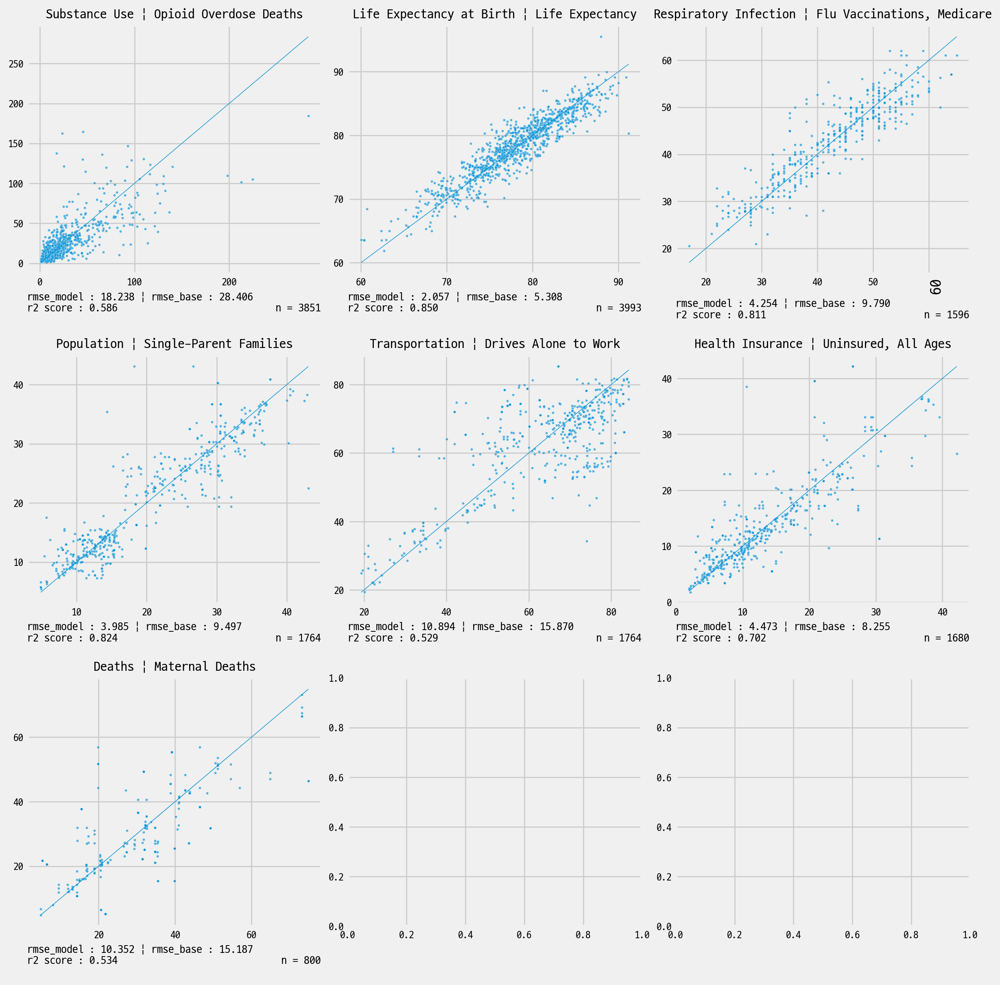

In [ ]:
# x = data.iloc[n].index, y = data.iloc[n].values

data_plot ={
    col : (dict_train_test[col][3], dict_pred[col])
    for col in test_cols[::2]
}
data_line = {
    col : (dict_train_test[col][3],dict_train_test[col][3])
    for col in test_cols[::2]
}

fig,axes = plt.subplots(3,3,figsize=(12,12))
fig,axes = pair_plot_feat_hue(fig=fig,axes=axes,data=data_line,
#fig,axes = pair_plot_feat_hue(fig=None,axes=None,data=data_line,
                              pair_plot=sns.lineplot,lw=0.5)
#fig.set_size_inches(12,8, forward=True)
#왠지 모르게 저걸 설정하면 망가짐 
fig,axes = pair_plot_feat_hue(fig=fig,axes=axes,data=data_plot,
                              pair_plot=sns.scatterplot,s=5,alpha=0.65)

for n,key in enumerate(data_plot.keys()):
    ax = axes.flatten()[n]
    ax.set_ylabel('')
    ax.set_title(key,fontsize=12)
    ax.set_xlabel('rmse_model : {:.3f} | rmse_base : {:.3f}\nr2 score : {:.3f} {:>35}\n'.format(*dict_score[key]['rmse'],dict_score[key]['r2_score'][0],
        f'n = {len(dict_train_test[key][0])}'), fontsize=10, ha ='left')

for ax in axes.flatten():
    plt.setp(ax.get_yticklabels(),rotation = 0, fontsize = 9)
    plt.setp(ax.get_xticklabels(),ha ='center',rotation = 0, fontsize = 9)
#    print(ax.get_yticklabels())
#    print('-'*30)

#print(axes.flatten()[2].get_yticklabels())

In [ ]:
ax = axes.flatten()[2]
ax.get_yticklabels()

[Text(0, 0.0, '0'),
 Text(0, 10.0, '10'),
 Text(0, 20.0, '20'),
 Text(0, 30.0, '30'),
 Text(0, 40.0, '40'),
 Text(0, 50.0, '50')]

In [ ]:
df_score = pd.DataFrame(dict_score[test_cols[0]]).T[[1,0]]
df_score

,1,0
rmse,28.406076,18.238338
mape,0.834974,0.507099
msle,0.976750,0.310252
r2_score,0.000000,0.585849


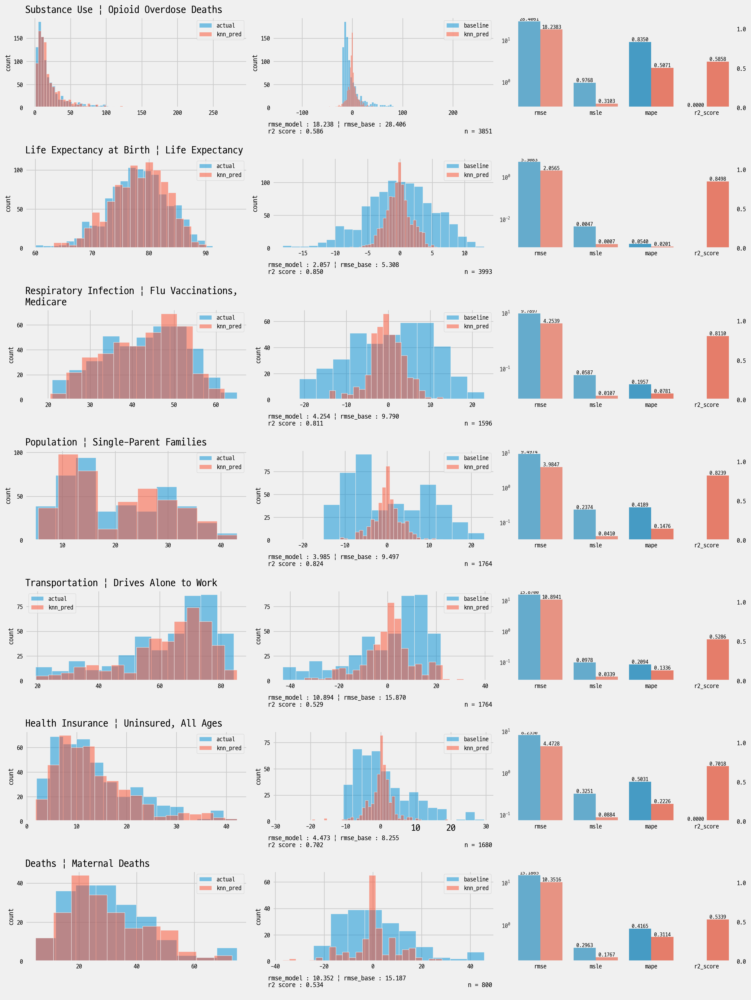

In [ ]:
from itertools import repeat, chain

fig,axes = plt.subplots(len(data_plot),3,figsize=(15,20))
for n, col in enumerate(data_plot.keys()):
    #quo, rem = divmod(n,3)
    ax1, ax2, ax3 = axes[n][0], axes[n][1], axes[n][2]
    test_y, y_pred = data_plot[col]
    train_y = dict_train_test[col][2]
    
    sns.histplot(test_y,label='actual',ax=ax1,alpha=0.5)
    sns.histplot(y_pred,label='knn_pred',ax=ax1,alpha=0.5)
    ax1.legend(fontsize=9)
    
    sns.histplot(test_y-np.mean(train_y),ax=ax2, label = 'baseline',alpha=0.5)
    sns.histplot(test_y-y_pred,ax=ax2, label = 'knn_pred',alpha=0.5)
    ax2.legend(fontsize=9)
    
    df_score = pd.DataFrame(dict_score[col]).T[[1,0]]
    xs = list(chain.from_iterable(repeat(val,2) for val in df_score.index))
    ax3r = ax3.twinx()
    sns.barplot(x=xs[:4],y=list(df_score.values.reshape(-1))[:4],
                hue = ['knn_pred','base']*2,ax=ax3,alpha=0.65,legend=False)
    sns.barplot(x=xs[4:],y=list(df_score.values.reshape(-1))[4:],
                hue = ['knn_pred','base']*2,ax=ax3r,alpha=0.8,legend=False)
    ax3.set_yscale('log')
    ax3r.set_ylim([0.0,1.15])
    ax3r.bar_label(ax3r.containers[0], fontsize=8, fmt='%.4f')
    ax3r.bar_label(ax3r.containers[1], fontsize=8, fmt='%.4f')
    ax3.grid(False)
    ax3r.grid(False)
    ax3r.set_yscale('linear')    
    ax3.bar_label(ax3.containers[0], fontsize=8, fmt='%.4f')
    ax3.bar_label(ax3.containers[1], fontsize=8, fmt='%.4f')
    #ax3.axvline()
    
    ax1.set_title(str_cutter(col,50),fontsize=15,loc='left',ha='left')
    ax2.xaxis.set_label_coords(-0.02, -0.15)
    ax2.set_xlabel('rmse_model : {:.3f} | rmse_base : {:.3f}\nr2 score : {:.3f} {:>48}\n'.format(*dict_score[col]['rmse'],dict_score[col]['r2_score'][0],
        f'n = {len(dict_train_test[col][0])}'), fontsize=10,ha ='left')
    #ax2.xaxis.set_label_position('left')
    ax1.set_xlabel('')
    ax3.set_xlabel('')
    ax1.set_ylabel('count',fontsize =10) 
    ax2.set_ylabel('count',fontsize =10) 
    plt.setp(ax3.get_yticklabels(),rotation = 0, fontsize = 9, color='#333333')
    plt.setp(ax3r.get_yticklabels(),rotation = 0, fontsize = 9)

for ax in axes.flatten():
    plt.setp(ax.get_yticklabels(),rotation = 0, fontsize = 9)
    plt.setp(ax.get_xticklabels(),ha ='center',rotation = 0, fontsize = 9)

cf. 누락율이 꽤나 높음에도 예상보다 잘 맞춤
- 단 해당 칼럼들은 race-sex집단에서 stratified 된 집단이 각 도시/연도 별로 최소 하나는 있는 도시/연도가 50% 이상임
- 위의 비율 기준, 118개 중 상위 30 ~ 44 위의 label들 (100% ~ 53.8%)
- 45위 부터는 25% 미만으로 떨어짐

    (구체적 내용 : 240619_check_missing_entire.ipynb)
- 현재 연도를 많이 보지 않으니, 도시 기준으로 분포하는 비율을 봐서, 추가적인 후보를 추릴 수 있을 것 같음

<Axes: >

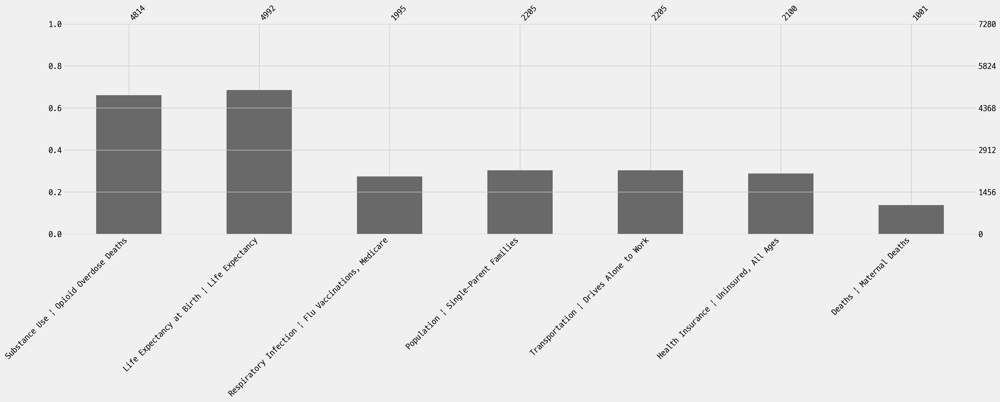

In [ ]:
msno.bar(pvtb_entire[list(data_plot.keys())])

## TODO : refactoring

## TODO : other models 

In [ ]:
df_geo_info

,geo_label_state,geo_label_citystate,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation,count
geo_label_city,,,,,,,,
New York City,NY,"New York City, NY",Northeast,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6535
Houston,TX,"Houston, TX",South,Poorest cities (18%+ poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6431
Los Angeles,CA,"Los Angeles, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Highly Segregated (50%+),6372
Philadelphia,PA,"Philadelphia, PA",Northeast,Poorest cities (18%+ poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6310
San Diego,CA,"San Diego, CA",West,Less poor cities (<18% poor),Largest (>1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),6251
Chicago,IL,"Chicago, IL",Midwest,Less poor cities (<18% poor),Largest (>1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),6210
San Francisco,CA,"San Francisco, CA",West,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Less Segregated (<50%),6121
Las Vegas,NV,"Las Vegas, NV",West,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%),5848
Boston,MA,"Boston, MA",Northeast,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+),5718


In [ ]:
for col in geo_strat_cols:
    test_nonan[col] = test_nonan['geo_label_city'].apply(lambda x: df_geo_info.loc[x,col])
    #test_nonan[col+'2'] = df_geo_info.loc[test_nonan['geo_label_city'],col]

/tmp/ipykernel_1962/920039715.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_nonan[col] = test_nonan['geo_label_city'].apply(lambda x: df_geo_info.loc[x,col])
/tmp/ipykernel_1962/920039715.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_nonan[col] = test_nonan['geo_label_city'].apply(lambda x: df_geo_info.loc[x,col])
/tmp/ipykernel_1962/920039715.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

In [ ]:
test_nonan.dropna()

,geo_label_city,date_label,Deaths | Premature Death,city_idx,geo_strata_region,geo_strata_poverty,geo_strata_Population,geo_strata_PopDensity,geo_strata_Segregation
0,Austin,2010,5094.792265,20,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%)
1,Austin,2010,3807.898474,20,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%)
2,Austin,2010,6377.256790,20,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%)
3,Austin,2010,2579.797021,20,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%)
4,Austin,2010,2025.151915,20,South,Less poor cities (<18% poor),Smaller (<1.3 million),Lower pop. density (<10k per sq mi),Less Segregated (<50%)
...,...,...,...,...,...,...,...,...,...
7274,Washington,2022,2692.047582,16,South,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+)
7275,Washington,2022,6300.589535,16,South,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+)
7277,Washington,2022,2231.116039,16,South,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+)
7278,Washington,2022,1609.792900,16,South,Less poor cities (<18% poor),Smaller (<1.3 million),Highest pop. density (>10k per sq mi),Highly Segregated (50%+)


In [ ]:
X = test_nonan[geo_strat_cols+['date_label']]

In [ ]:
from sklearn.tree import DecisionTreeRegressor

tree_test = DecisionTreeRegressor()

In [ ]:
y_tree = tree_test.fit(X,y)
#tree regression model은 string은 넣지 못함

ValueError: could not convert string to float: 'South'